# Problem-Specific Coordinate Generation for HyperNEAT Substrates

## Setup

The testing was done on a 16GB VRAM GPU with CUDA 12.8. VRAM usage is determined mainly by substrate and population size.

### Imports

This setup requires some dependencies, mainly TensorNEAT, JAX, numpy, matplotlib, NetworkX, scikit-learn and wandb for logging. Using a virtual environment (i.e. conda) is highly recommended. Python 3.10.18 was used in development and testing.

In [1]:
import jax
import numpy as np
import wandb
import matplotlib.pyplot as plt
from collections import defaultdict

from config import config
from tensorneat.algorithm.hyperneat import FullSubstrate

from substrate_generation.pca_coor_generator import PCAanalyzer 
from substrate_generation.pca_inv_coor_generator import InvPCAanalyzer 
from substrate_generation.dl_coor_generator import DictionaryAnalyzer
from substrate_generation.fa_coor_generator import FactorAnalyzer
from substrate_generation.manual_coor_generator import ManualIOMapper
from substrate_generation.random_coor_generator import RandomCoordinateGenerator
from substrate_generation.ica_generator import ICAanalyzer 
from substrate_generation.data_sampling import collect_random_policy_data, collect_trained_agent_policy_data
from evol_pipeline.brax_env import CustomBraxEnv
from evol_pipeline.custom_pipeline import CustomPipeline
from evol_pipeline.custom_substrate import AutoLayeredCoordMLPSubstrate
from substrate_generation.hidden_layers import HiddenLayerGenerator
from utils.visualization import visualize_cppn, visualize_nn, display_plots_side_by_side
from utils.utils import save_coordinates_to_csv, setup_folder_structure, save_data_sources, load_data_sources, append_summary_row
from evol_pipeline.evol_algorithm import create_evol_algorithm

A quick setup of the folder structure to avoid errors further down the line.

In [2]:
OUTPUT_DIR = config["experiment"]["output_dir"]
setup_folder_structure(OUTPUT_DIR)

### Setup Environment

[Brax environments](https://github.com/google/brax/tree/main/brax/envs) are used for this experiment through the [TensorNEAT wrapper](https://github.com/EMI-Group/tensorneat/tree/main/src/tensorneat/problem/rl).

In [3]:
env_name = config["experiment"]["env_name"]
env_problem = CustomBraxEnv(
    env_name=env_name,
    backend=config["environment"]["backend"],
    brax_args=config["environment"]["brax_args"],
    max_step=config["environment"]["max_step"],
    repeat_times=config["environment"]["repeat_times"],
    obs_normalization=config["environment"]["obs_normalization"],
    sample_episodes=config["environment"]["sample_episodes"],
)
obs_size = env_problem.input_shape[0]
act_size = env_problem.output_shape[0]
feature_dims_repeats = config["data_analysis"]["feature_dims"]

print("env_problem.input_shape: ", env_problem.input_shape)
print("env_problem.input_shape: ", env_problem.output_shape)

/home/andi/anaconda3/envs/jax/lib/python3.10/site-packages/brax/io/mjcf.py:480: UserWarning: Brax System, piplines and environments are not actively being maintained. Please see MJX for a well maintained JAX-based physics engine: https://github.com/google-deepmind/mujoco/tree/main/mjx. For a host of environments that use MJX, see: https://github.com/google-deepmind/mujoco_playground.
  warnings.warn(
2025-10-29 18:00:05.728822: W external/xla/xla/service/gpu/autotuning/dot_search_space.cc:200] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs?Working around this by using the full hints set instead.
2025-10-29 18:00:16.538452: W external/xla/xla/service/gpu/autotuning/dot_search_space.cc:200] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs?Working around this by usin

env_problem.input_shape:  (27,)
env_problem.input_shape:  (8,)


## Data Sampling

Before we can apply data-driven approaches to the task of substrate generation, some data needs to be generated. This can either be done by generating random action or actually training an agent for a short period and then sampling from its action. Both data sampling methods are used for comparison.

### Data Sampling Method 1: Trained Agent

First, we train an number of agents for a few generations on a simple substrate for the sole purpose of sampling their actions.


In [4]:
key = jax.random.PRNGKey(config["experiment"]["seed"])
num_trained_agent_sampling = config["data_sampling"]["num_agents_to_sample"]
all_trained_agent_data = []
for i in range(num_trained_agent_sampling):
    print(f"\nTraining and sampling agent #{i+1}/{num_trained_agent_sampling}")
    key, subkey = jax.random.split(key)
    trained_agent_data_run = collect_trained_agent_policy_data(
        env_problem=env_problem,
        key=subkey,
        num_steps=config["data_sampling"]["sampling_steps"],
        obs_diff_only=True,
        do_normalization=True,
    )
    all_trained_agent_data.append(trained_agent_data_run)

combined_trained_agent_data = np.vstack(all_trained_agent_data)

print(f"Data collection complete. Combined data from {num_trained_agent_sampling} trained agents.")
print(f"Shape of each run's data: {all_trained_agent_data[0].shape}")
print(f"Shape of combined trained agents data: {combined_trained_agent_data.shape}")



Training and sampling agent #1/2

Starting Agent Training and Data Collection
Configuring and training the agent...
Query dimension for sampling:  4
initializing
initializing finished
start compile
compile finished, cost time: 32.190825s
Generation: 1, Cost time: 7022.38ms
 	fitness: valid cnt: 1000, max: 51.7927, min: -3957.4875, mean: -1628.6064, std: 1431.1322

	node counts: max: 8, min: 6, mean: 7.30
 	conn counts: max: 12, min: 5, mean: 10.35
 	species: 10, [107, 54, 14, 1, 35, 3, 1, 41, 35, 709]

Generation: 2, Cost time: 7026.88ms
 	fitness: valid cnt: 1000, max: 52.3521, min: -3956.0601, mean: -426.9966, std: 1010.8704

	node counts: max: 9, min: 6, mean: 7.55
 	conn counts: max: 14, min: 4, mean: 10.51
 	species: 10, [116, 14, 18, 79, 55, 105, 48, 20, 15, 530]

Generation: 3, Cost time: 7039.26ms
 	fitness: valid cnt: 1000, max: 53.7757, min: -3973.1067, mean: -162.1395, std: 698.6778

	node counts: max: 10, min: 5, mean: 7.77
 	conn counts: max: 14, min: 2, mean: 10.70
 	spe

2025-10-29 18:06:52.320319: W external/xla/xla/service/gpu/autotuning/dot_search_space.cc:200] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs?Working around this by using the full hints set instead.
2025-10-29 18:06:52.320335: W external/xla/xla/service/gpu/autotuning/dot_search_space.cc:200] All configs were filtered out because none of them sufficiently match the hints. Maybe the hints set does not contain a good representative set of valid configs?Working around this by using the full hints set instead.


Causal expert data collection finished.


Training and sampling agent #2/2

Starting Agent Training and Data Collection
Configuring and training the agent...
Query dimension for sampling:  4
initializing
initializing finished
start compile
compile finished, cost time: 33.184772s
Generation: 1, Cost time: 7091.47ms
 	fitness: valid cnt: 1000, max: 51.5613, min: -3954.8425, mean: -1623.6472, std: 1384.7412

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 5, mean: 10.34
 	species: 10, [78, 63, 65, 2, 60, 22, 1, 2, 1, 706]

Generation: 2, Cost time: 7063.91ms
 	fitness: valid cnt: 1000, max: 52.3712, min: -3951.2827, mean: -710.2993, std: 1220.8818

	node counts: max: 9, min: 6, mean: 7.34
 	conn counts: max: 14, min: 4, mean: 10.48
 	species: 10, [22, 1, 75, 6, 34, 44, 84, 1, 1, 732]

Generation: 3, Cost time: 7086.56ms
 	fitness: valid cnt: 1000, max: 52.7907, min: -3950.9756, mean: -143.3316, std: 683.9705

	node counts: max: 10, min: 6, mean: 7.58
 	conn counts: m

### Data Sampling Method 2: Random Policy

Now, we will sample data from the environment with a random action policy.

In [5]:
key, random_key = jax.random.split(key)
num_random_sampling_steps = num_trained_agent_sampling * config["data_sampling"]["sampling_steps"]
random_data = collect_random_policy_data(
    env_problem, random_key, 
    num_random_sampling_steps, 
    obs_diff_only=True,
    do_normalization=True,
)

Starting data collection for 2000 steps using a random policy...
Causal data collection finished.


In [6]:
data_sources = {
    "trained": combined_trained_agent_data,
    "random": random_data
}

data_archive_path = f"{OUTPUT_DIR}/data_sources.npz"
save_data_sources(data_sources, data_archive_path)

Successfully saved data sources to: output/ant/data_sources.npz


In [7]:
LOAD_DATA_FROM_FILE = False 

data_archive_path = f"{OUTPUT_DIR}/data_sources.npz"

if LOAD_DATA_FROM_FILE:
    data_sources = load_data_sources(data_archive_path)

## Data Analysis

Next, it's time to analyse the sampled data. The goal is to find correlations in the data which can be used to assign substrate coordinates. Again, different methods are used for comparison, namely Principal Component Analysis (PCA), Factor Analysis (FA) and Dictionary Learning (DL). These methods will be applied to both data samples.

In this first step, the analysis methods will be used to produce input and output coordinates only. The hidden layers are generated later.

All results are stored in a single dictionary object which is defined first.

In [8]:
def deep_defaultdict():
    return defaultdict(deep_defaultdict)

generated_io_coors = deep_defaultdict()

### ICA

First method to be used is Independent Component Analysis (ICA). As you can read in the [scikit-learn documentation](https://scikit-learn.org/stable/modules/decomposition.html#independent-component-analysis-ica): "Typically, ICA is not used for reducing dimensionality but for separating superimposed signals."


Analyzing 'trained' data with ICA (1 dims)
Running Independent Component Analysis (ICA) to find 1 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_trained_1fd.png



Analyzing 'random' data with ICA (1 dims)
Running Independent Component Analysis (ICA) to find 1 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_random_1fd.png




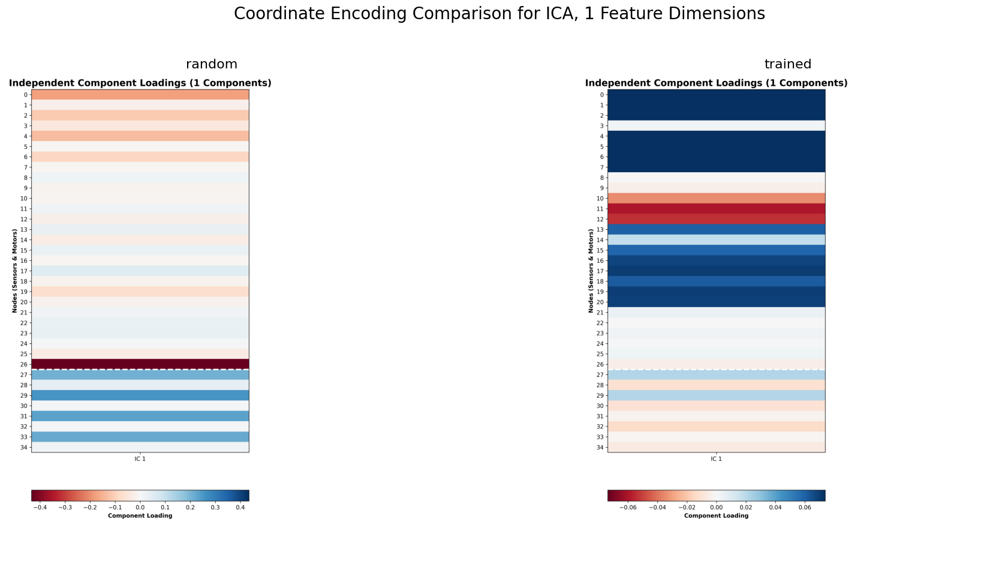


Analyzing 'trained' data with ICA (2 dims)
Running Independent Component Analysis (ICA) to find 2 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_trained_2fd.png



Analyzing 'random' data with ICA (2 dims)
Running Independent Component Analysis (ICA) to find 2 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_random_2fd.png




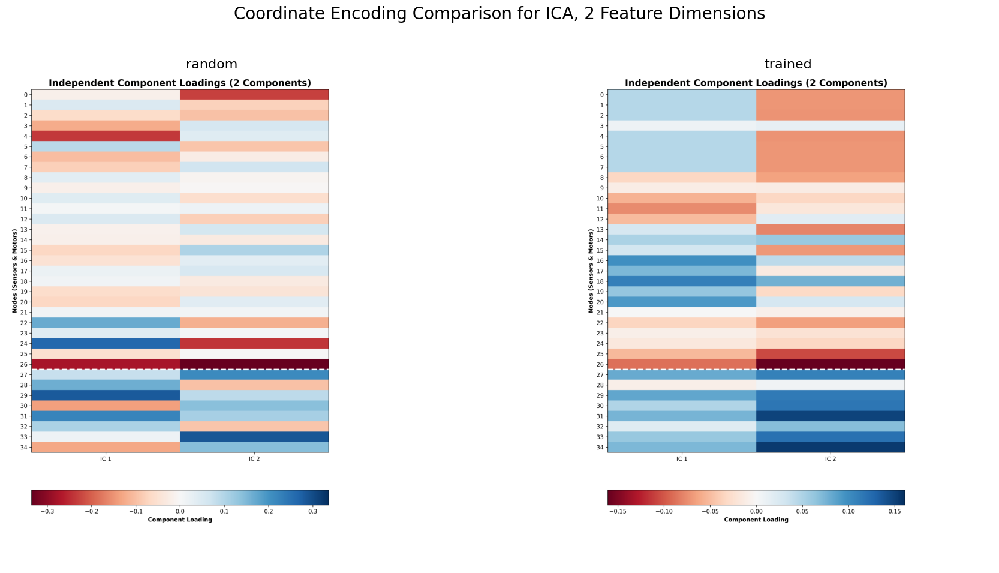


Analyzing 'trained' data with ICA (5 dims)
Running Independent Component Analysis (ICA) to find 5 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_trained_5fd.png



Analyzing 'random' data with ICA (5 dims)
Running Independent Component Analysis (ICA) to find 5 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_random_5fd.png




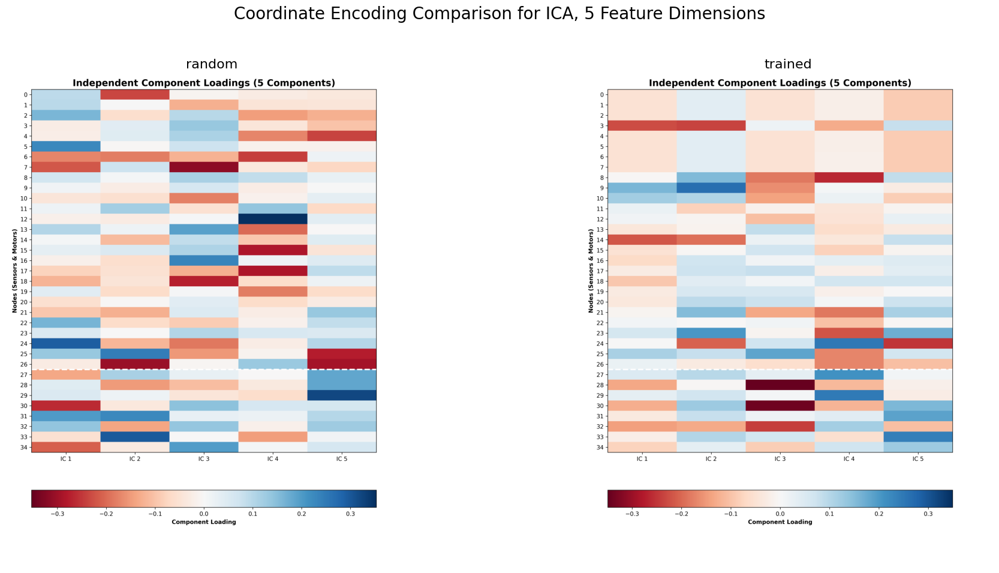


Analyzing 'trained' data with ICA (9 dims)
Running Independent Component Analysis (ICA) to find 9 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_trained_9fd.png



Analyzing 'random' data with ICA (9 dims)
Running Independent Component Analysis (ICA) to find 9 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_random_9fd.png




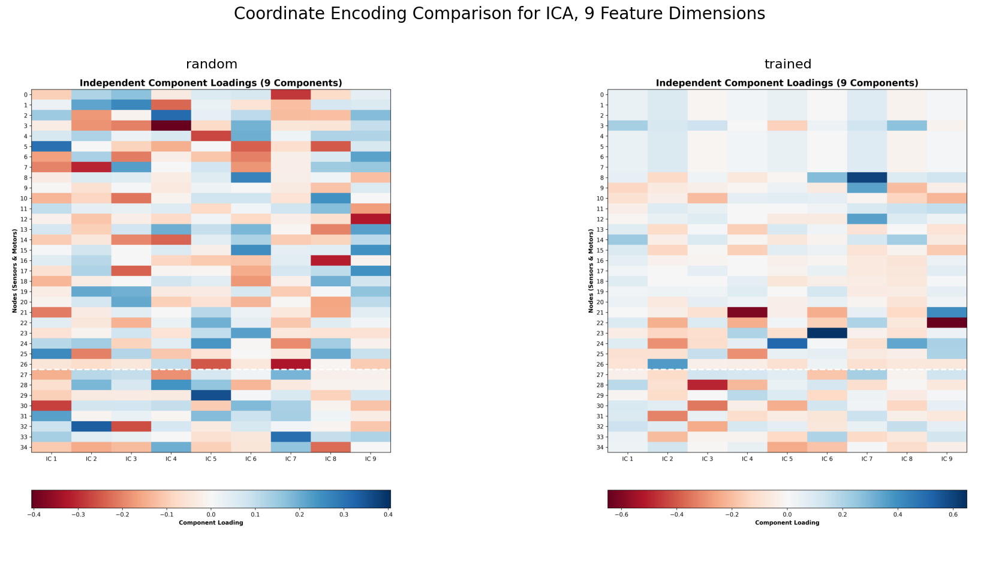


Analyzing 'trained' data with ICA (14 dims)
Running Independent Component Analysis (ICA) to find 14 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_trained_14fd.png



Analyzing 'random' data with ICA (14 dims)
Running Independent Component Analysis (ICA) to find 14 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15


/home/andi/anaconda3/envs/jax/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_random_14fd.png




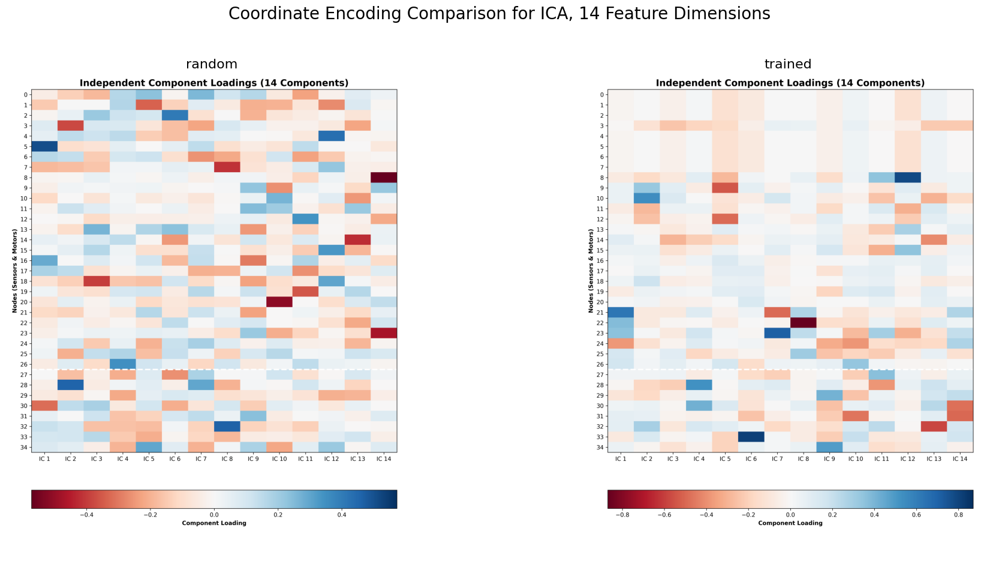


Analyzing 'trained' data with ICA (19 dims)
Running Independent Component Analysis (ICA) to find 19 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_trained_19fd.png



Analyzing 'random' data with ICA (19 dims)
Running Independent Component Analysis (ICA) to find 19 components...
ICA complete. Extracting coordinates (component loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20


/home/andi/anaconda3/envs/jax/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Independent component heatmap saved to: output/ant/data_analysis/ica_heatmap_random_19fd.png




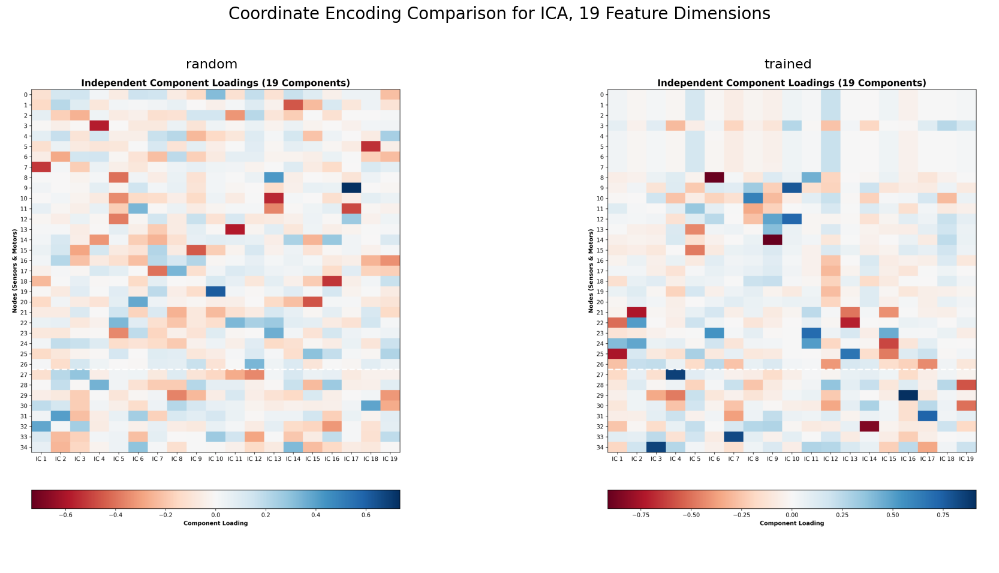

In [9]:
for feature_dims in feature_dims_repeats:
    for data_label, data_array in data_sources.items():

        print(f"\nAnalyzing '{data_label}' data with ICA ({feature_dims} dims)")
        analyzer_ica = ICAanalyzer(
            data=data_array, obs_size=obs_size, act_size=act_size,
            feature_dims=feature_dims,
            width_factor=config["substrate"]["width_factor"],
            normalize_coors=config["data_analysis"]["normalize_coors"],
            depth_factor=config["substrate"]["depth_factor"],
            seed=config["experiment"]["seed"]
        )
        input_coors_ica, output_coors_ica = analyzer_ica.generate_io_coordinates()
        generated_io_coors[data_label]["ica"][f"{feature_dims}fd"]["input_coors"] = input_coors_ica
        generated_io_coors[data_label]["ica"][f"{feature_dims}fd"]["output_coors"] = output_coors_ica
        analyzer_ica.plot_independent_components(save_path=f"{OUTPUT_DIR}/data_analysis/ica_heatmap_{data_label}_{feature_dims}fd.png")
        print("\n")

    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/ica_heatmap_random_{feature_dims}fd.png", f"{OUTPUT_DIR}/data_analysis/ica_heatmap_trained_{feature_dims}fd.png"],
        plot_titles=["random", "trained"],
        main_title=f"Coordinate Encoding Comparison for ICA, {feature_dims} Feature Dimensions",
        save_path=f"{OUTPUT_DIR}/data_analysis/ica_heatmap_comparison_{feature_dims}fd.png"
    )

### PCA

Principal Component Analysis (PCA) is commonly used for dimensionality reduction and using Singular Value Decomposition of the data to project it to a lower dimensional space. The [scikit-learn implementation](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) of PCA is used here.

Analyzing trained sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 1 dimensions)...
PCA found 1 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 1
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
PCA variance plot saved to: output/ant/data_analysis/pca_variance_trained_1fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_trained_1fd.png


Analyzing random sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 1 dimensions)...
PCA found 1 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 1
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
PCA variance plot saved to: output/ant/data_analysis/pca_variance_random_1fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_random_1fd.png




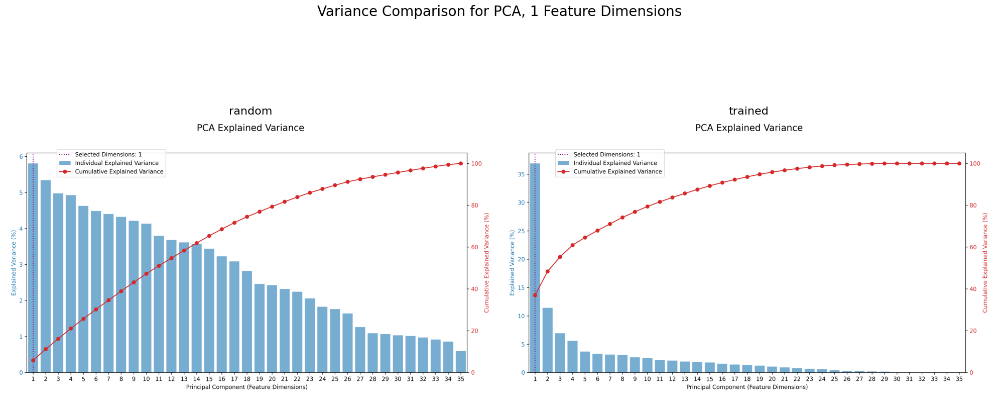

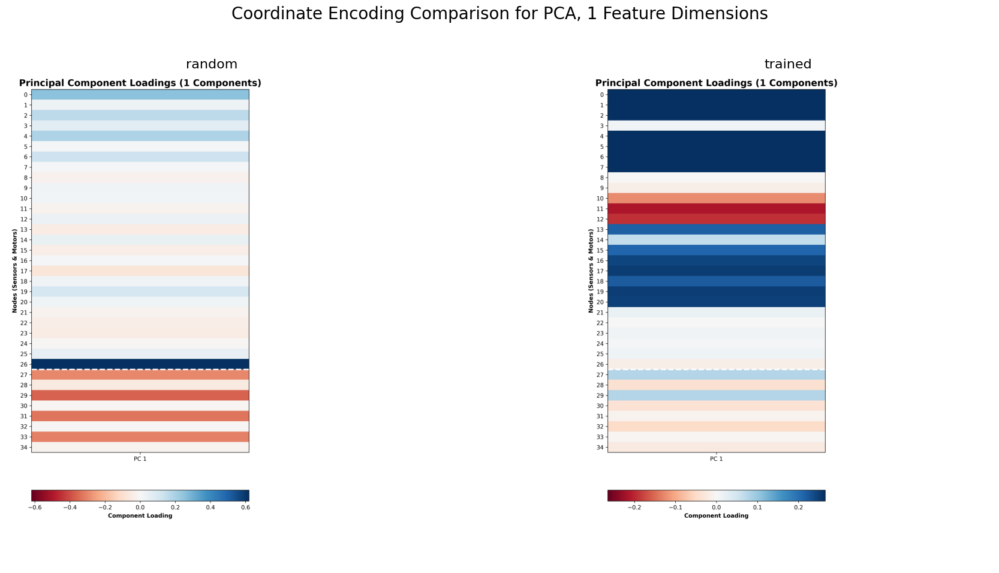

Analyzing trained sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 2 dimensions)...
PCA found 2 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 2
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
PCA variance plot saved to: output/ant/data_analysis/pca_variance_trained_2fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_trained_2fd.png


Analyzing random sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 2 dimensions)...
PCA found 2 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 2
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
PCA variance plot saved to: output/ant/data_analysis/pca_variance_random_2fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_random_2fd.png




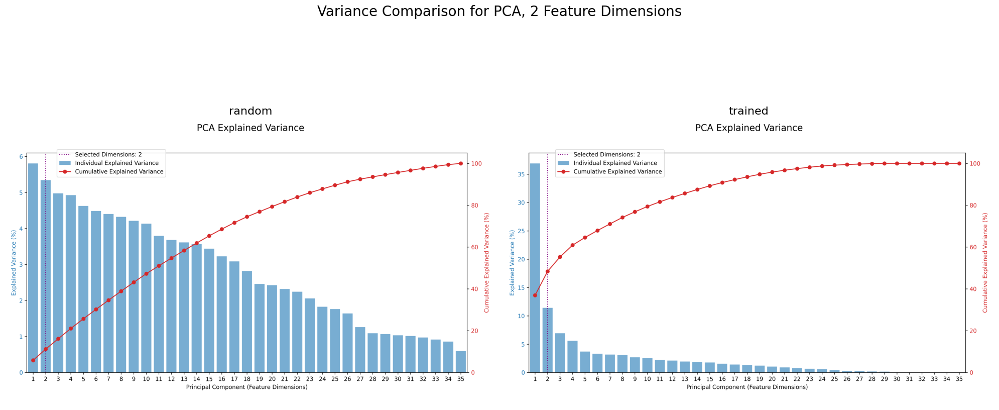

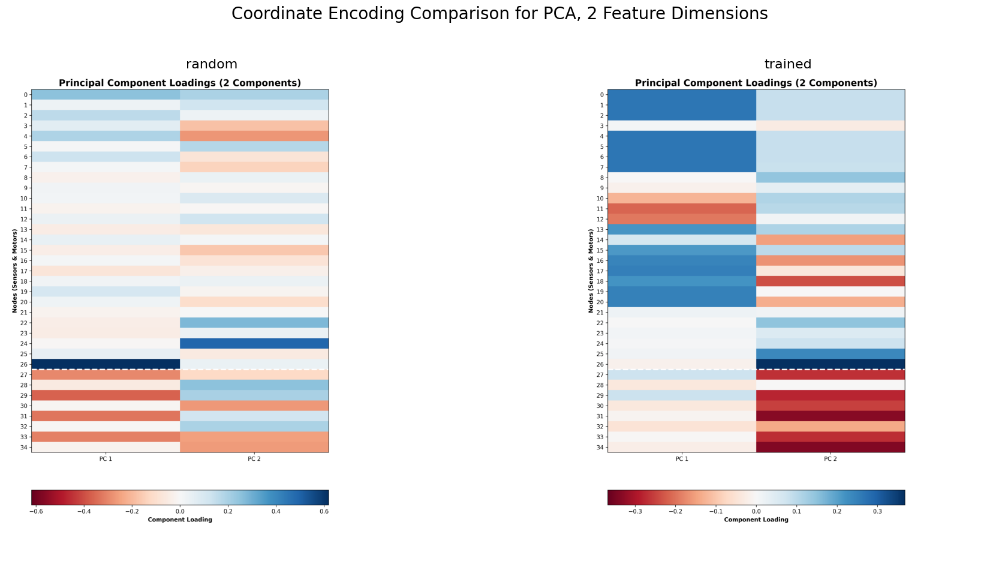

Analyzing trained sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 5 dimensions)...
PCA found 5 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 5
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
PCA variance plot saved to: output/ant/data_analysis/pca_variance_trained_5fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_trained_5fd.png


Analyzing random sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 5 dimensions)...
PCA found 5 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 5
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
PCA variance plot saved to: output/ant/data_analysis/pca_variance_random_5fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_random_5fd.png




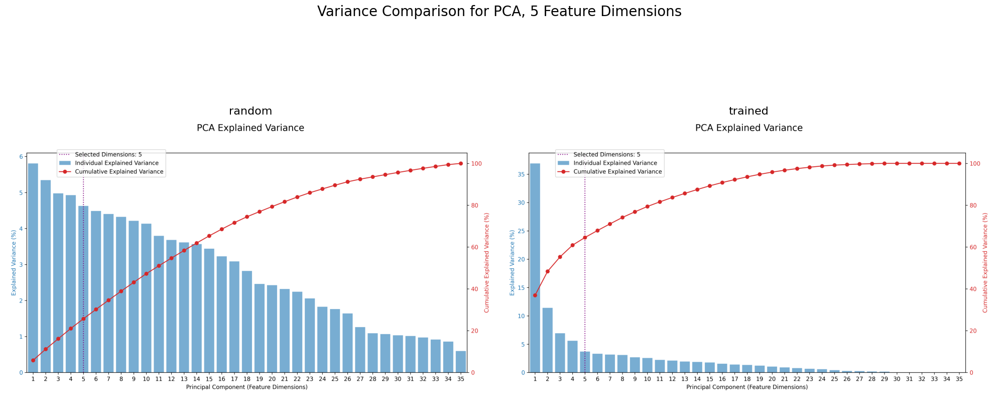

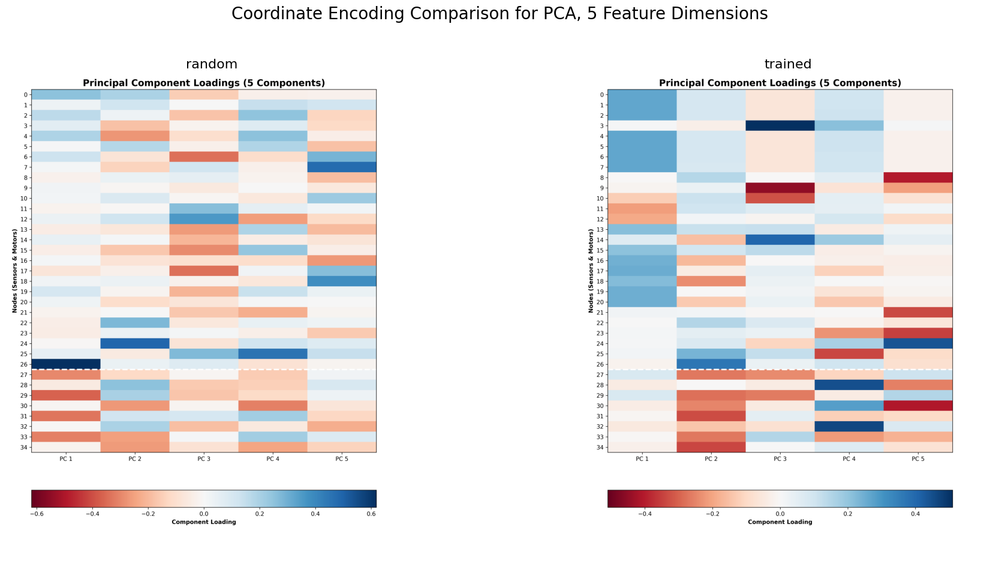

Analyzing trained sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 9 dimensions)...
PCA found 9 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 9
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
PCA variance plot saved to: output/ant/data_analysis/pca_variance_trained_9fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_trained_9fd.png


Analyzing random sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 9 dimensions)...
PCA found 9 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 9
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
PCA variance plot saved to: output/ant/data_analysis/pca_variance_random_9fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_random_9fd.png




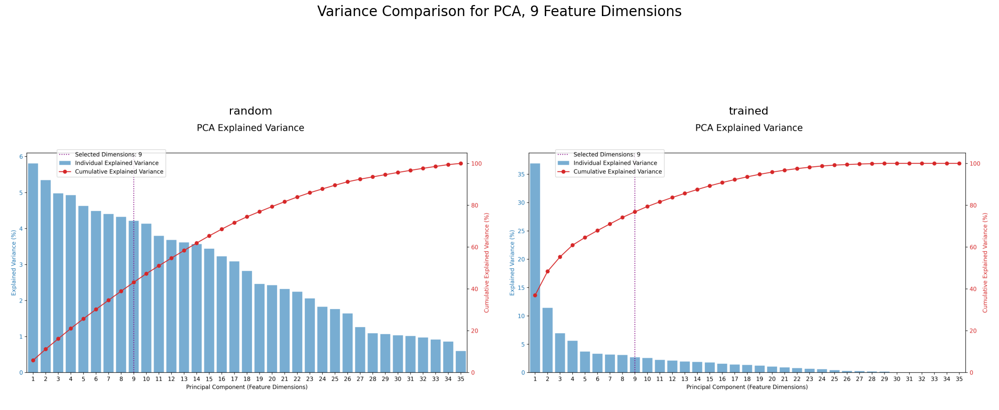

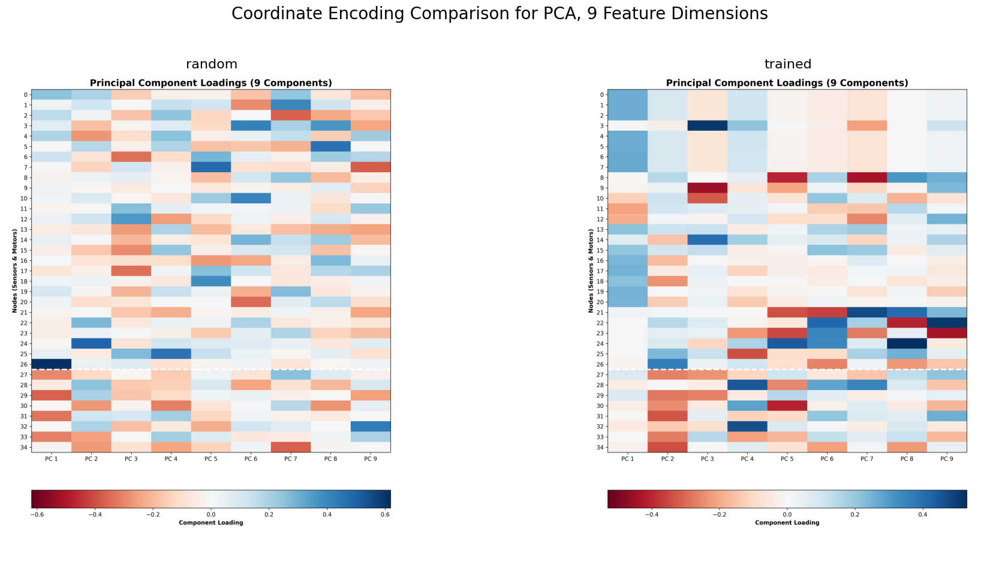

Analyzing trained sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 14 dimensions)...
PCA found 14 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 14
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
PCA variance plot saved to: output/ant/data_analysis/pca_variance_trained_14fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_trained_14fd.png


Analyzing random sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 14 dimensions)...
PCA found 14 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 14
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
PCA variance plot saved to: output/ant/data_analysis/pca_variance_random_14fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_random_14

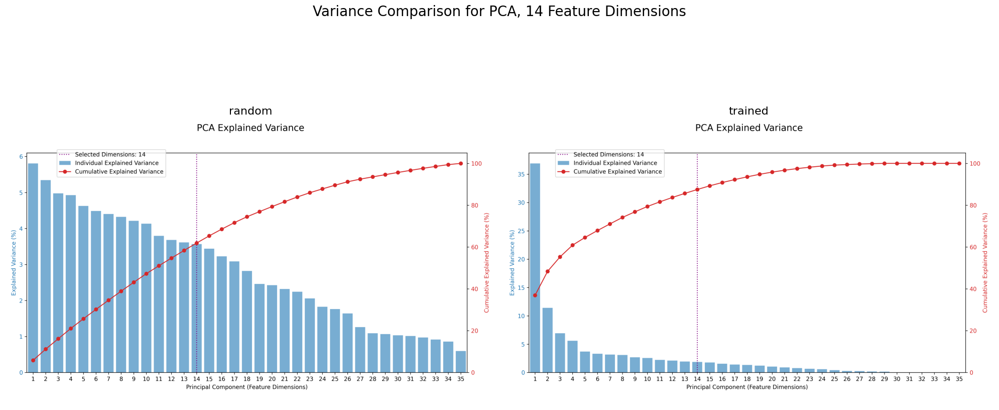

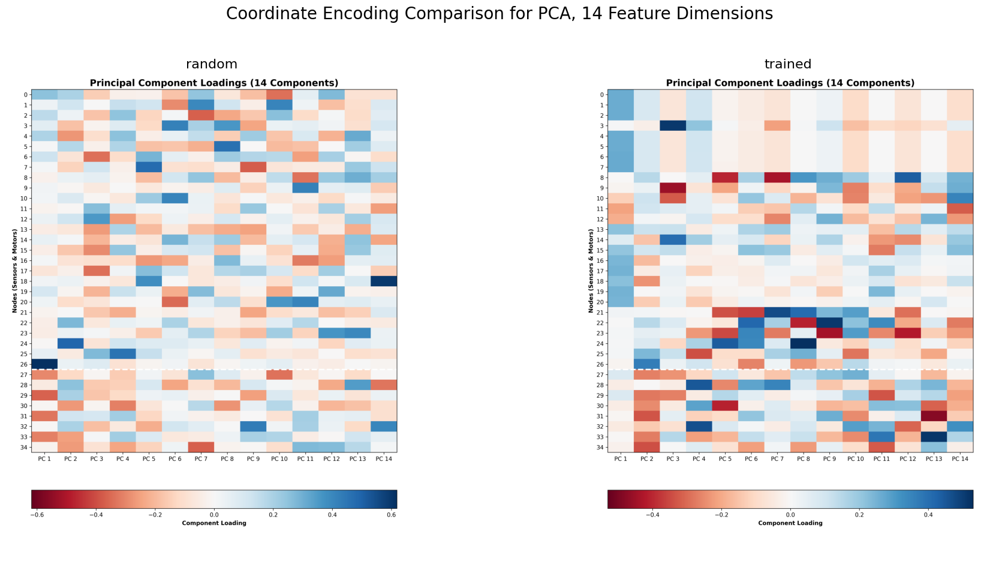

Analyzing trained sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 19 dimensions)...
PCA found 19 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 19
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
PCA variance plot saved to: output/ant/data_analysis/pca_variance_trained_19fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_trained_19fd.png


Analyzing random sampling data
Running PCA to find feature dimensions covering 100.0% of variance (with a hard limit of 19 dimensions)...
PCA found 19 dimensions needed for 100.0% variance.
Applying max limit. Final number of feature dimensions: 19
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
PCA variance plot saved to: output/ant/data_analysis/pca_variance_random_19fd.png
Principal component heatmap saved to: output/ant/data_analysis/pca_heatmap_random_19

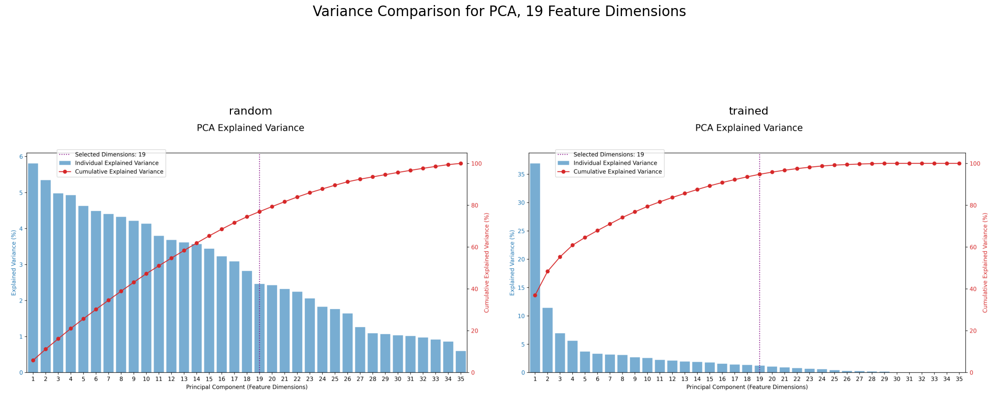

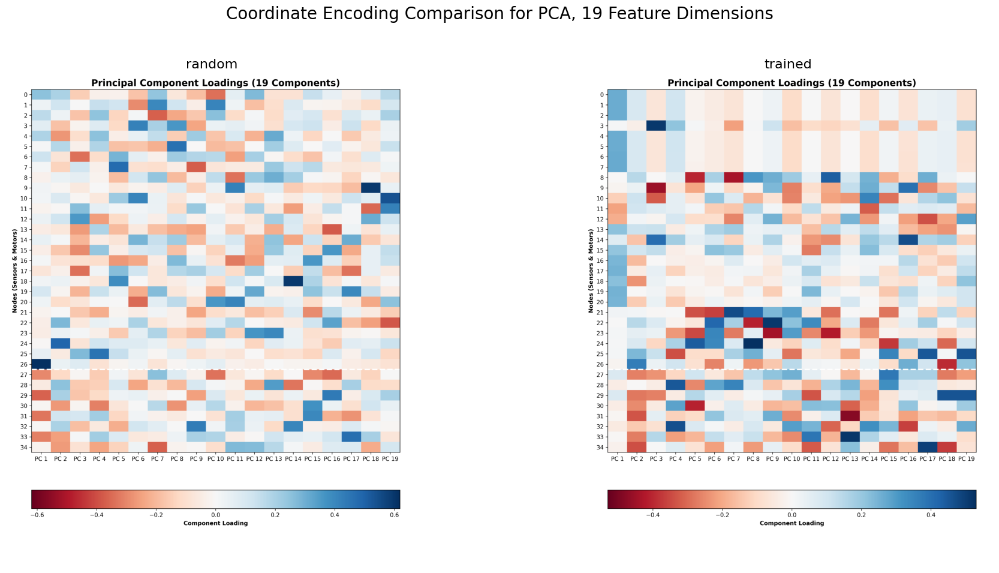

In [10]:
for feature_dims in feature_dims_repeats:
    for data_label, data_array in data_sources.items():

        print(f"Analyzing {data_label} sampling data")
        analyzer_pca = PCAanalyzer(
            data=data_array, 
            obs_size=obs_size, 
            act_size=act_size,
            variance_threshold=config["data_analysis"]["variance_threshold"], 
            feature_dims=feature_dims,
            width_factor=config["substrate"]["width_factor"],
            normalize_coors=config["data_analysis"]["normalize_coors"],
            depth_factor=config["substrate"]["depth_factor"],
        )
        input_coors_pca, output_coors_pca = analyzer_pca.generate_io_coordinates()
        generated_io_coors[data_label]["pca"][f"{feature_dims}fd"]["input_coors"] = input_coors_pca
        generated_io_coors[data_label]["pca"][f"{feature_dims}fd"]["output_coors"] = output_coors_pca
        analyzer_pca.plot_variance(save_path=f"{OUTPUT_DIR}/data_analysis/pca_variance_{data_label}_{feature_dims}fd.png")
        analyzer_pca.plot_principal_components(save_path=f"{OUTPUT_DIR}/data_analysis/pca_heatmap_{data_label}_{feature_dims}fd.png")
        print("\n")

    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/pca_variance_random_{feature_dims}fd.png", f"{OUTPUT_DIR}/data_analysis/pca_variance_trained_{feature_dims}fd.png"],
        plot_titles=["random", "trained"],
        main_title=f"Variance Comparison for PCA, {feature_dims} Feature Dimensions",
        save_path=f"{OUTPUT_DIR}/data_analysis/pca_variance_comparison_{feature_dims}fd.png"
    )
    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/pca_heatmap_random_{feature_dims}fd.png", f"{OUTPUT_DIR}/data_analysis/pca_heatmap_trained_{feature_dims}fd.png"],
        plot_titles=["random", "trained"],
        main_title=f"Coordinate Encoding Comparison for PCA, {feature_dims} Feature Dimensions",
        save_path=f"{OUTPUT_DIR}/data_analysis/pca_heatmap_comparison_{feature_dims}fd.png"
    )

To measure the effect of PC selection by variance, another baseline with inversed variance selection is established. It means that in this case, the PCs with the least variance are chosen for coordinate generation.

Analyzing trained sampling data with PCA
Running inverse PCA to find 1 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_trained_1fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_trained_1fd.png


Analyzing random sampling data with PCA
Running inverse PCA to find 1 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_random_1fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_random_1fd.png




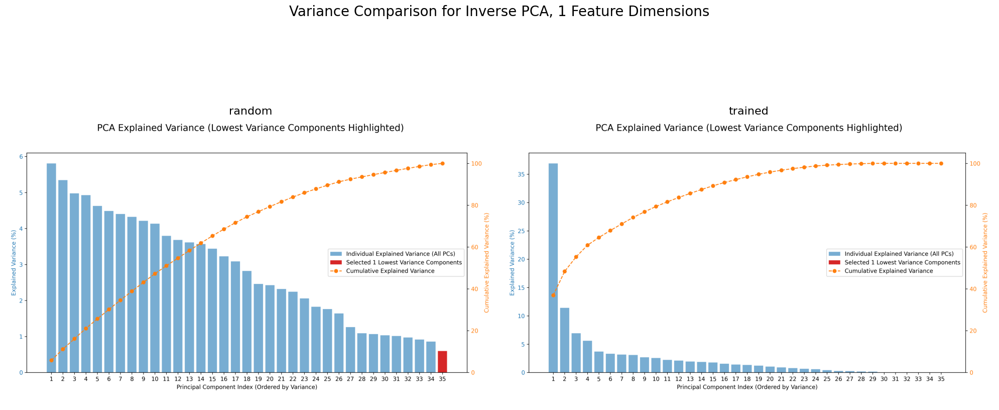

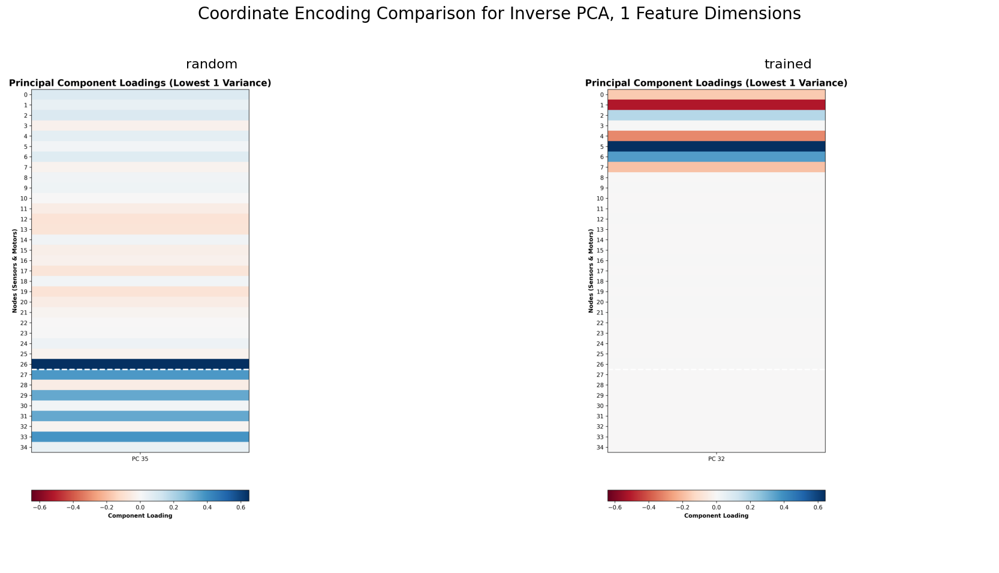

Analyzing trained sampling data with PCA
Running inverse PCA to find 2 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_trained_2fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_trained_2fd.png


Analyzing random sampling data with PCA
Running inverse PCA to find 2 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_random_2fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_random_2fd.png




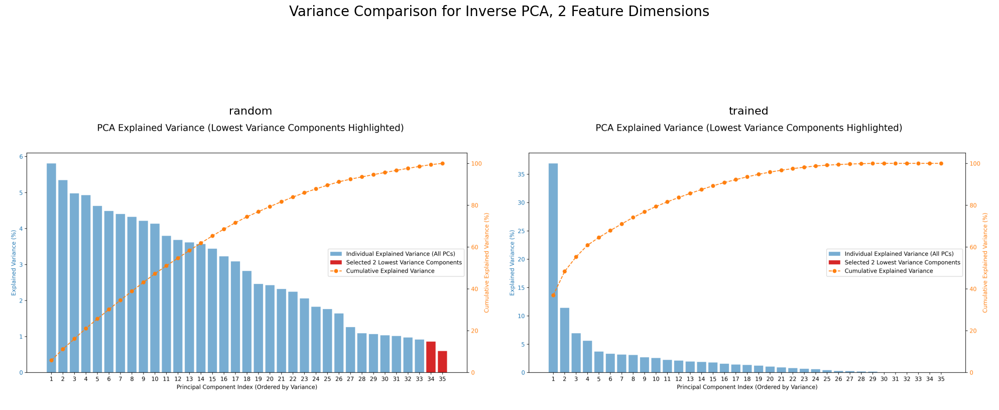

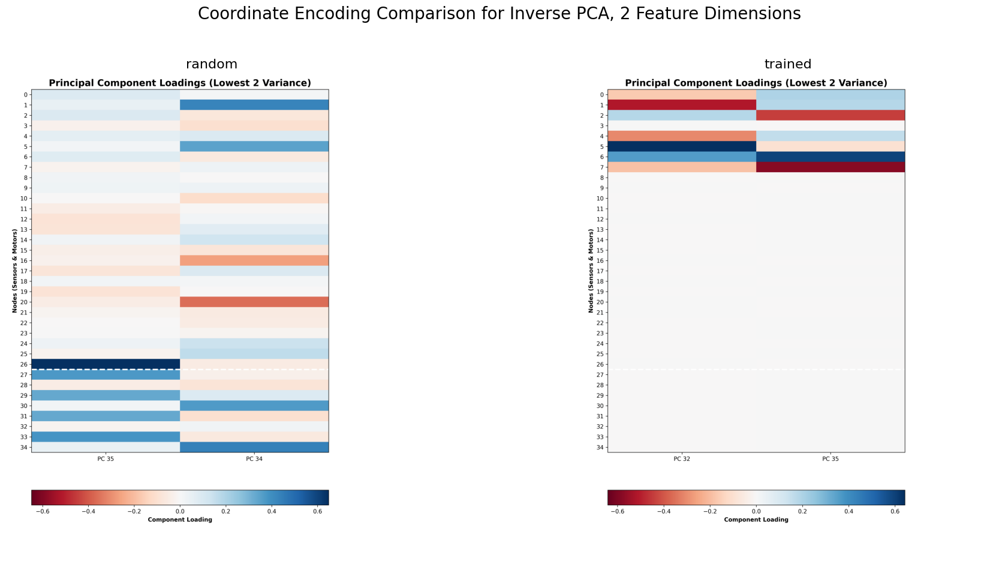

Analyzing trained sampling data with PCA
Running inverse PCA to find 5 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_trained_5fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_trained_5fd.png


Analyzing random sampling data with PCA
Running inverse PCA to find 5 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_random_5fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_random_5fd.png




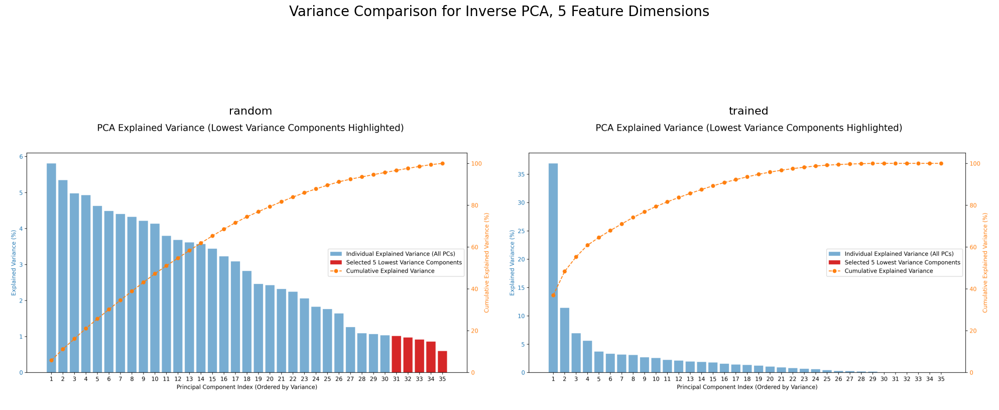

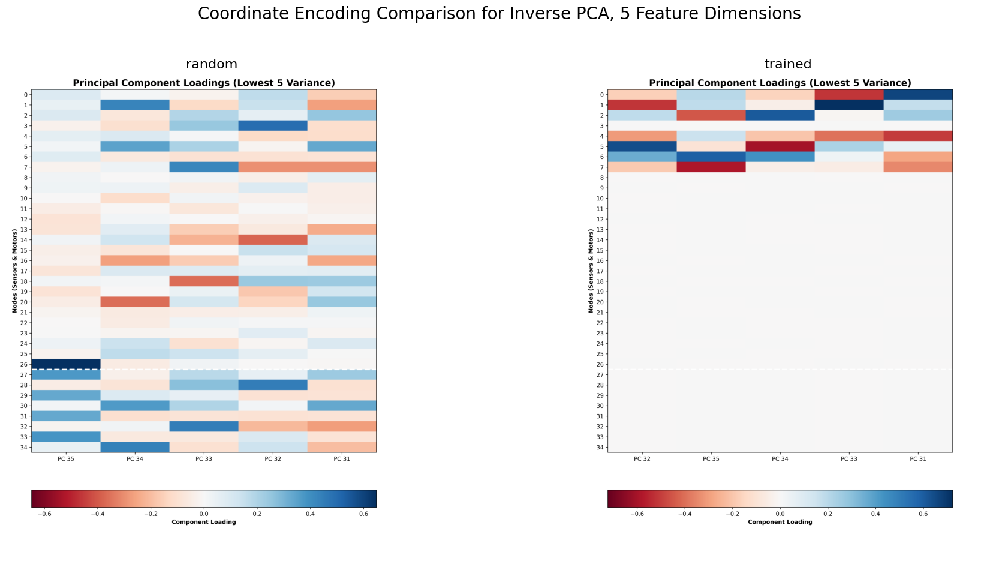

Analyzing trained sampling data with PCA
Running inverse PCA to find 9 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_trained_9fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_trained_9fd.png


Analyzing random sampling data with PCA
Running inverse PCA to find 9 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_random_9fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_random_9fd.png




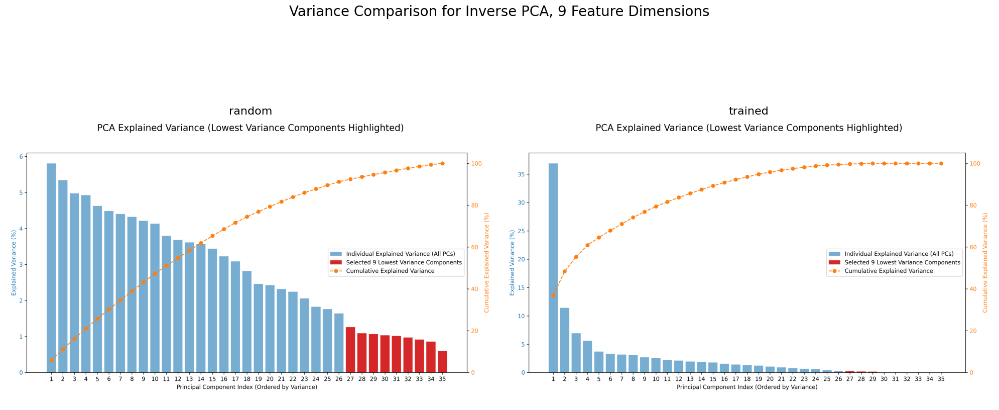

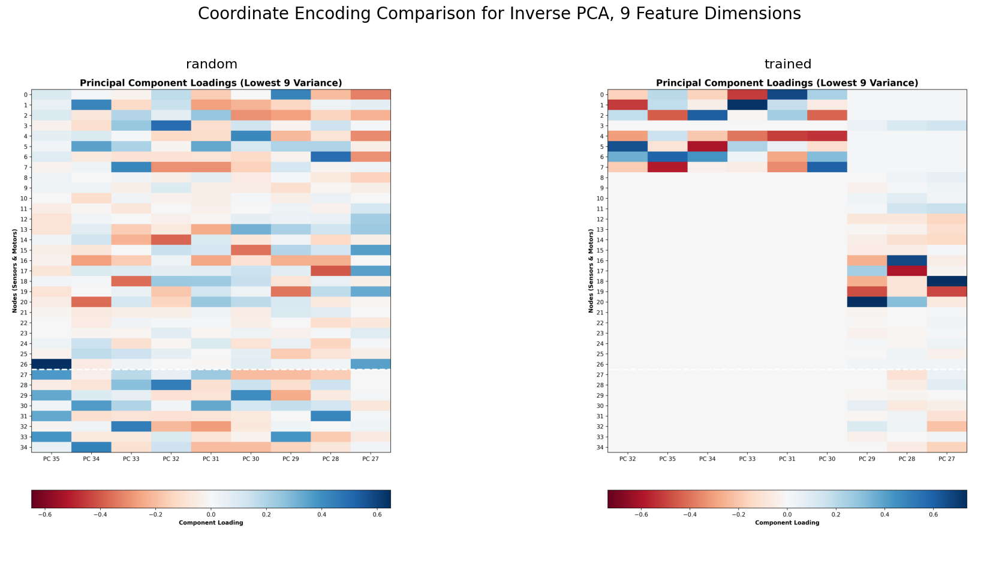

Analyzing trained sampling data with PCA
Running inverse PCA to find 14 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_trained_14fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_trained_14fd.png


Analyzing random sampling data with PCA
Running inverse PCA to find 14 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_random_14fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_random_14fd.png




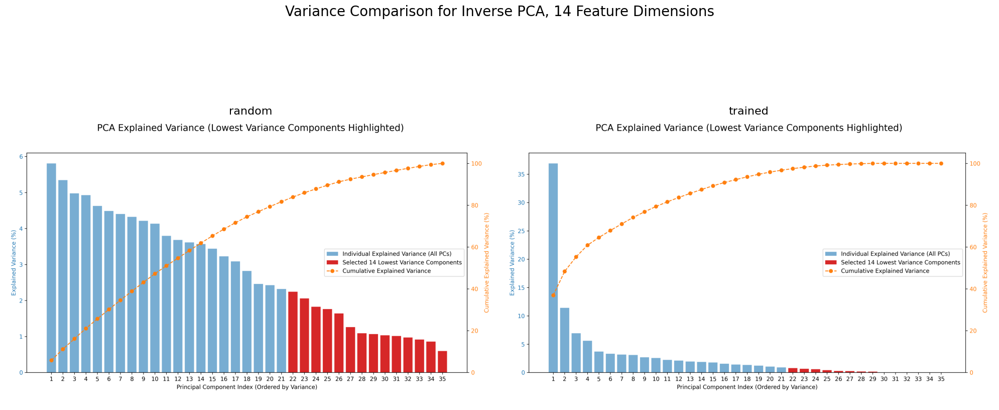

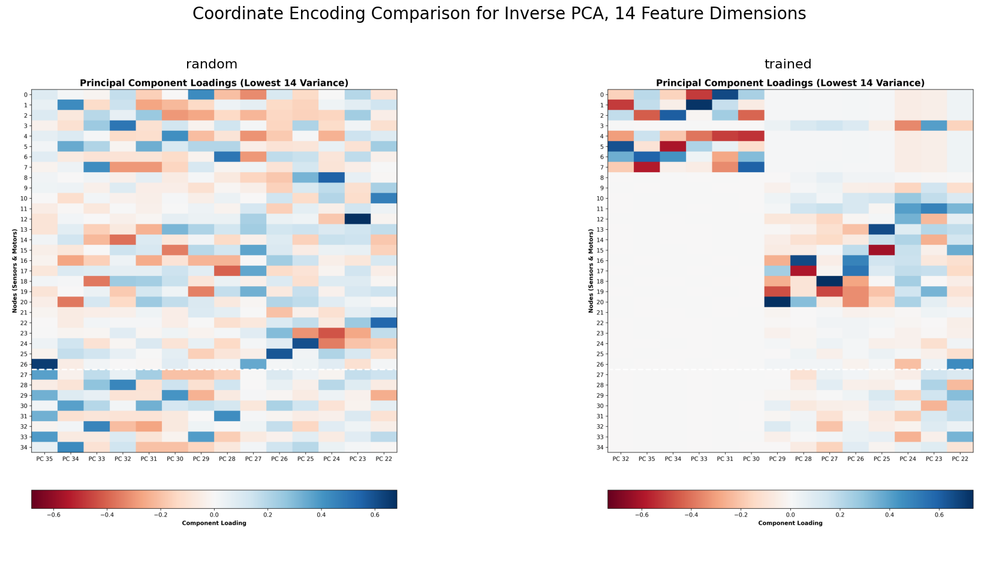

Analyzing trained sampling data with PCA
Running inverse PCA to find 19 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_trained_19fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_trained_19fd.png


Analyzing random sampling data with PCA
Running inverse PCA to find 19 feature dimensions covering least variance...
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
Inverse PCA variance plot saved to: output/ant/data_analysis/inv_pca_random_19fd.png
Principal component heatmap saved to: output/ant/data_analysis/inv_pca_heatmap_random_19fd.png




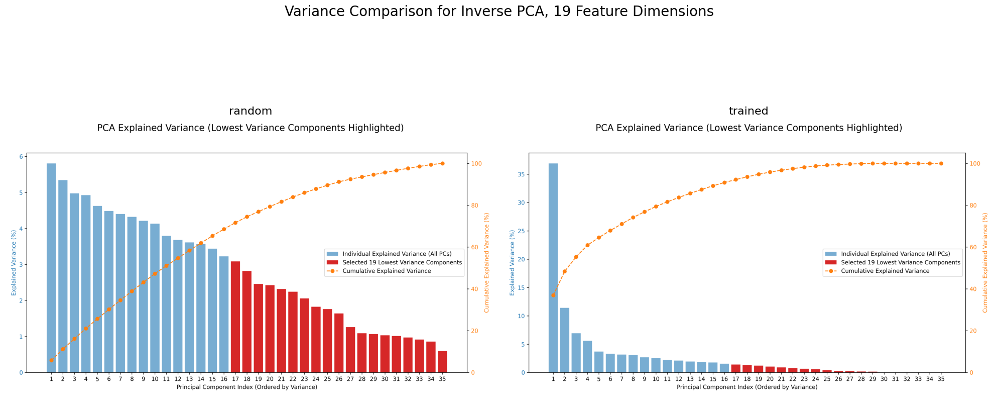

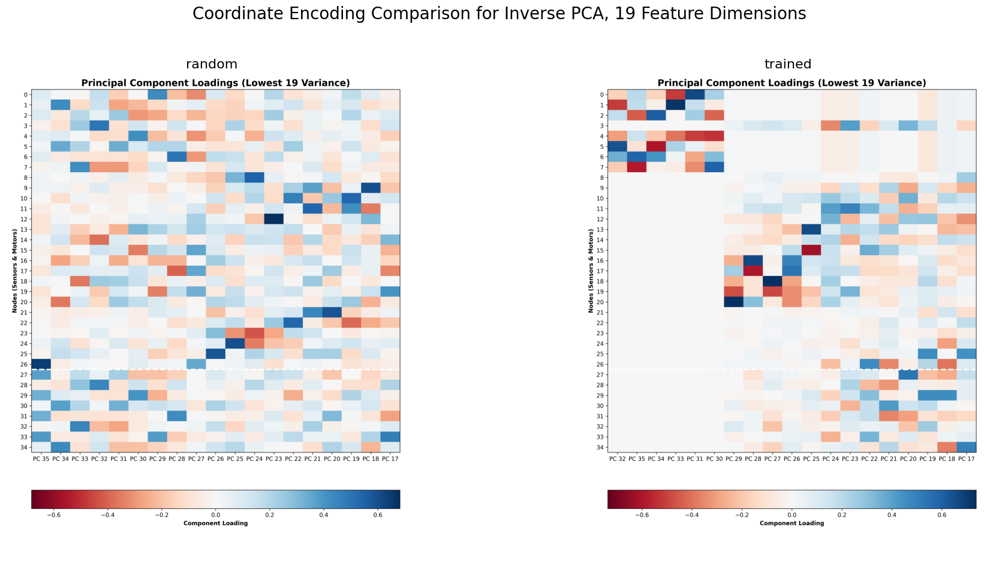

In [11]:
for feature_dims in feature_dims_repeats:    
    for data_label, data_array in data_sources.items():

        print(f"Analyzing {data_label} sampling data with PCA")
        analyzer_inv_pca = InvPCAanalyzer(
            data=data_array, 
            obs_size=obs_size, 
            act_size=act_size,
            feature_dims=feature_dims,
            width_factor=config["substrate"]["width_factor"],
            normalize_coors=config["data_analysis"]["normalize_coors"],
            depth_factor=config["substrate"]["depth_factor"],
        )
        input_coors_inv_pca, output_coors_inv_pca = analyzer_inv_pca.generate_io_coordinates()
        generated_io_coors[data_label][f"inv_pca"][f"{feature_dims}fd"]["input_coors"] = input_coors_inv_pca
        generated_io_coors[data_label][f"inv_pca"][f"{feature_dims}fd"]["output_coors"] = output_coors_inv_pca
        analyzer_inv_pca.plot_least_variance_components(save_path=f"{OUTPUT_DIR}/data_analysis/inv_pca_{data_label}_{feature_dims}fd.png")
        analyzer_inv_pca.plot_principal_components(save_path=f"{OUTPUT_DIR}/data_analysis/inv_pca_heatmap_{data_label}_{feature_dims}fd.png")
        print("\n")


    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/inv_pca_random_{feature_dims}fd.png", f"{OUTPUT_DIR}/data_analysis/inv_pca_trained_{feature_dims}fd.png"],
        plot_titles=["random", "trained"],
        main_title=f"Variance Comparison for Inverse PCA, {feature_dims} Feature Dimensions",
        save_path=f"{OUTPUT_DIR}/data_analysis/inv_pca_variance_comparison_{feature_dims}fd.png"
    )
    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/inv_pca_heatmap_random_{feature_dims}fd.png", f"{OUTPUT_DIR}/data_analysis/inv_pca_heatmap_trained_{feature_dims}fd.png"],
        plot_titles=["random", "trained"],
        main_title=f"Coordinate Encoding Comparison for Inverse PCA, {feature_dims} Feature Dimensions",
        save_path=f"{OUTPUT_DIR}/data_analysis/inv_pca_heatmap_comparison_{feature_dims}fd.png"
    )

### Factor Analysis

Next, the data is analysed through factor analysis.

Analyzing trained sampling data
Running Factor Analysis to find 1 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_trained_1fd.png


Analyzing random sampling data
Running Factor Analysis to find 1 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_random_1fd.png




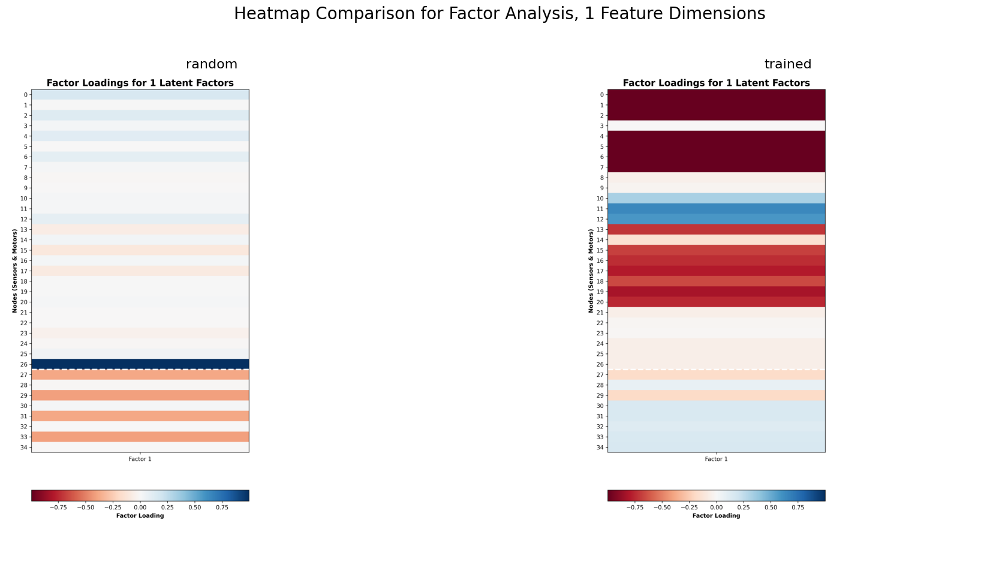

Analyzing trained sampling data
Running Factor Analysis to find 2 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_trained_2fd.png


Analyzing random sampling data
Running Factor Analysis to find 2 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_random_2fd.png




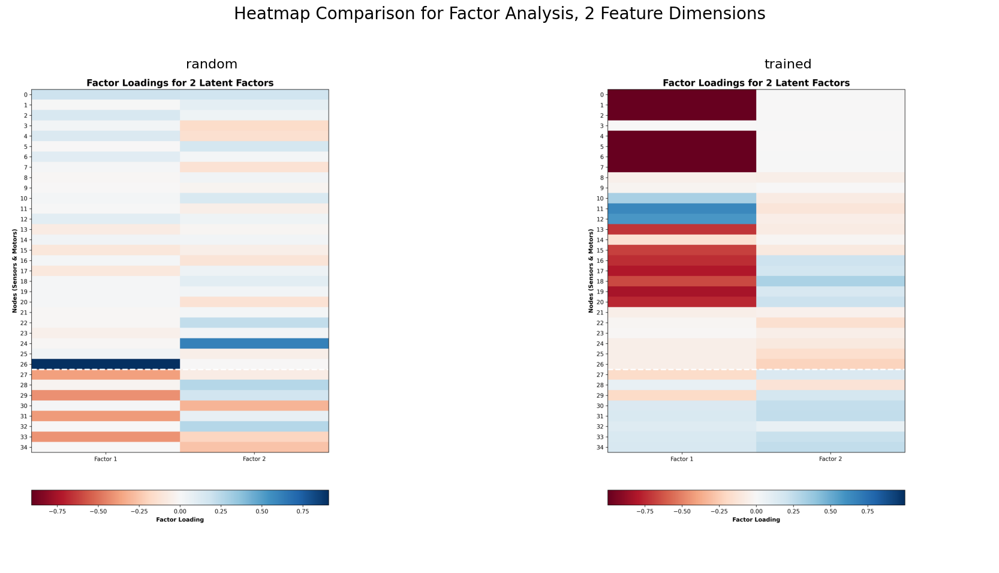

Analyzing trained sampling data
Running Factor Analysis to find 5 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_trained_5fd.png


Analyzing random sampling data
Running Factor Analysis to find 5 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_random_5fd.png




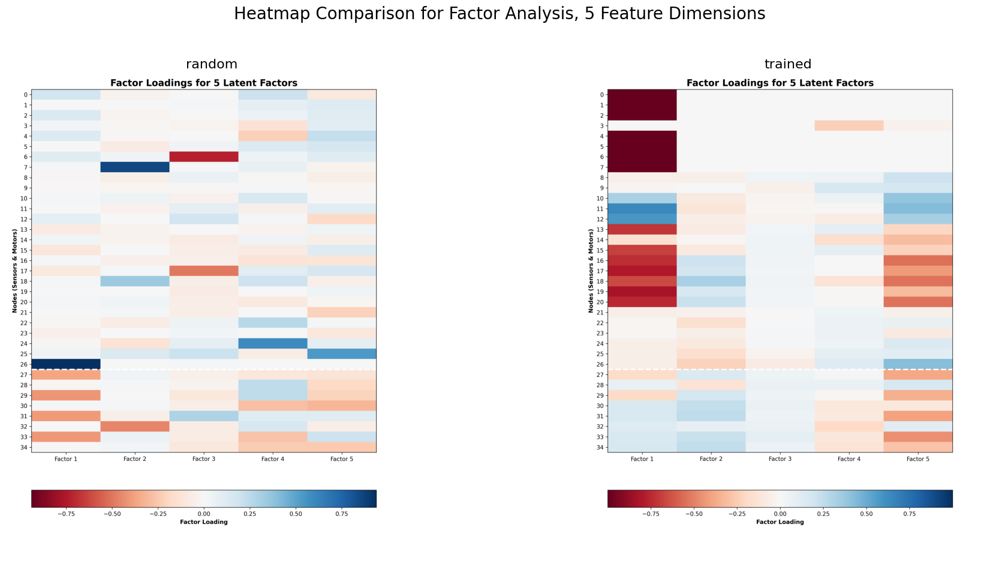

Analyzing trained sampling data
Running Factor Analysis to find 9 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_trained_9fd.png


Analyzing random sampling data
Running Factor Analysis to find 9 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_random_9fd.png




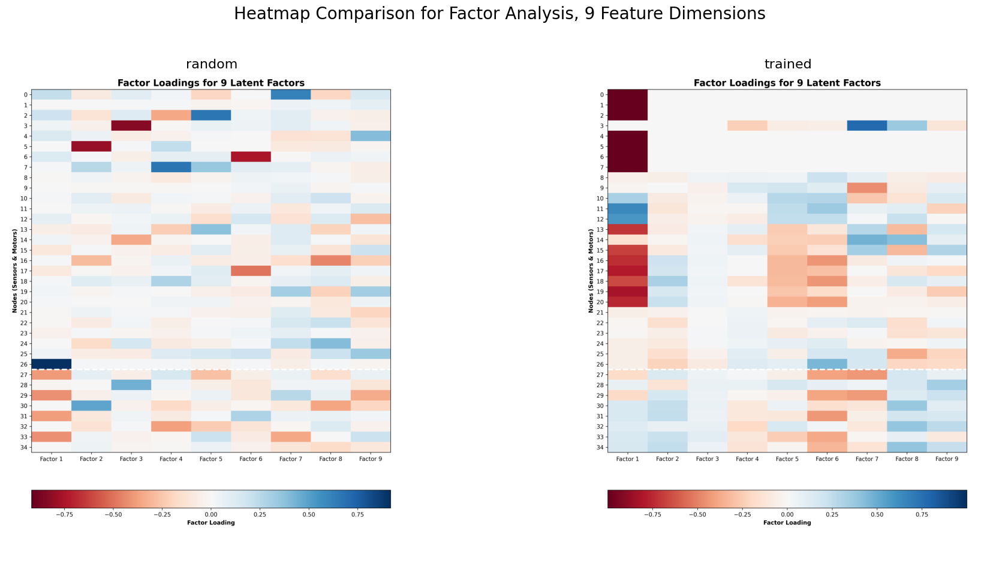

Analyzing trained sampling data
Running Factor Analysis to find 14 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_trained_14fd.png


Analyzing random sampling data
Running Factor Analysis to find 14 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_random_14fd.png




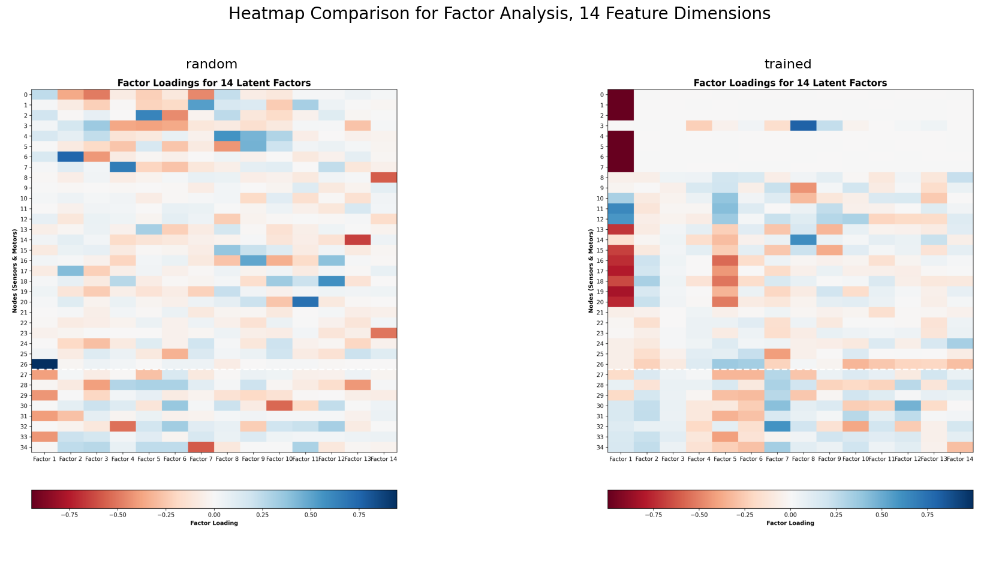

Analyzing trained sampling data
Running Factor Analysis to find 19 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_trained_19fd.png


Analyzing random sampling data
Running Factor Analysis to find 19 latent factors...
Factor Analysis complete. Extracting coordinates (factor loadings).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
Factor loadings heatmap saved to: output/ant/data_analysis/fa_heatmap_random_19fd.png




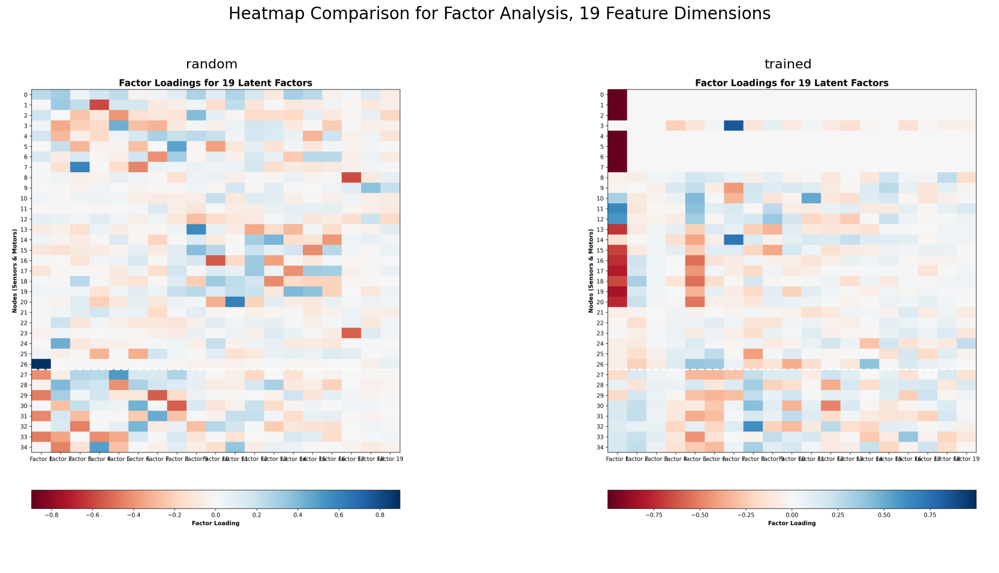

In [12]:
for feature_dims in feature_dims_repeats:  
    for data_label, data_array in data_sources.items():
        print(f"Analyzing {data_label} sampling data")
        analyzer_fa = FactorAnalyzer(
            data=data_array, 
            obs_size=obs_size, 
            act_size=act_size,
            feature_dims=feature_dims,
            width_factor=config["substrate"]["width_factor"],
            normalize_coors=config["data_analysis"]["normalize_coors"],
            depth_factor=config["substrate"]["depth_factor"],
        )
        input_coors_fa, output_coors_fa = analyzer_fa.generate_io_coordinates()
        generated_io_coors[data_label]["fa"][f"{feature_dims}fd"]["input_coors"] = input_coors_fa
        generated_io_coors[data_label]["fa"][f"{feature_dims}fd"]["output_coors"] = output_coors_fa
        analyzer_fa.plot_factor_loadings(save_path=f"{OUTPUT_DIR}/data_analysis/fa_heatmap_{data_label}_{feature_dims}fd.png")
        print("\n")

    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/fa_heatmap_random_{feature_dims}fd.png", f"{OUTPUT_DIR}/data_analysis/fa_heatmap_trained_{feature_dims}fd.png"],
        plot_titles=["random", "trained"],
        main_title=f"Heatmap Comparison for Factor Analysis, {feature_dims} Feature Dimensions",
        save_path=f"{OUTPUT_DIR}/data_analysis/fa_heatmap_comparison_{feature_dims}fd.png"
    )

### Dictionary Learning

Lastly, Dictionary Learning is also applied to the data.

Analyzing trained sampling data
Running Dictionary Learning to find 1 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_trained_1fd.png


Analyzing random sampling data
Running Dictionary Learning to find 1 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 2
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_random_1fd.png




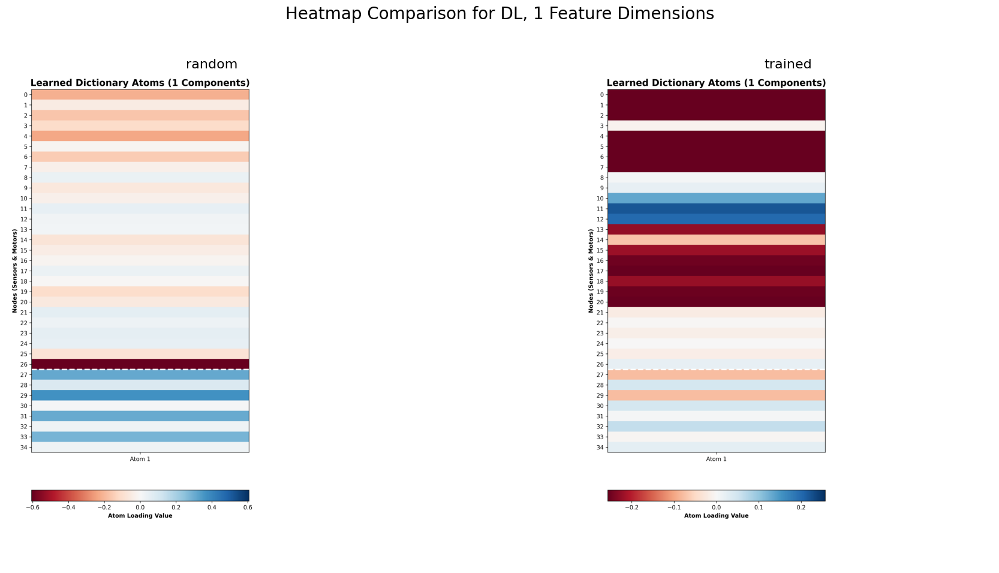

Analyzing trained sampling data
Running Dictionary Learning to find 2 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_trained_2fd.png


Analyzing random sampling data
Running Dictionary Learning to find 2 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 3
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_random_2fd.png




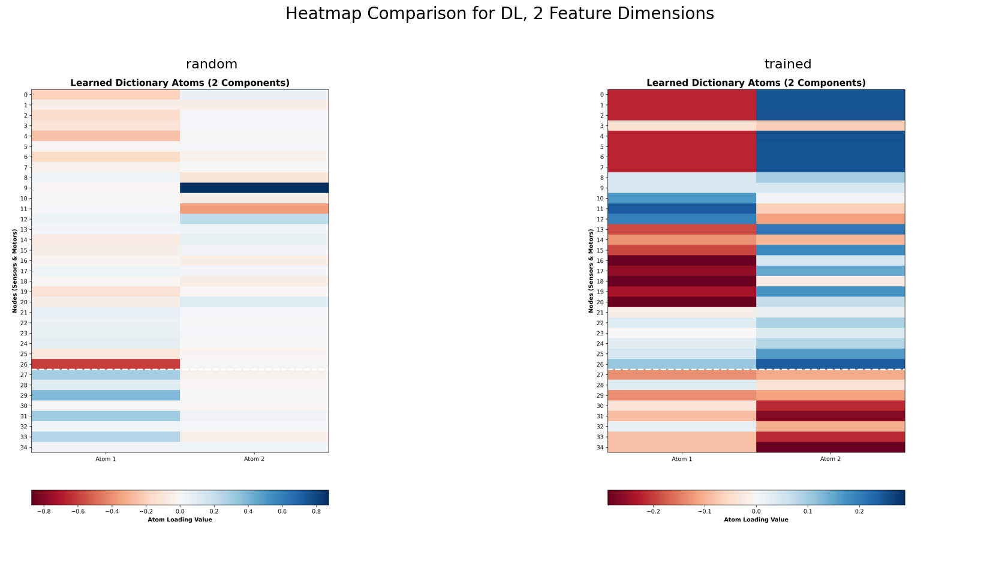

Analyzing trained sampling data
Running Dictionary Learning to find 5 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_trained_5fd.png


Analyzing random sampling data
Running Dictionary Learning to find 5 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 6
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_random_5fd.png




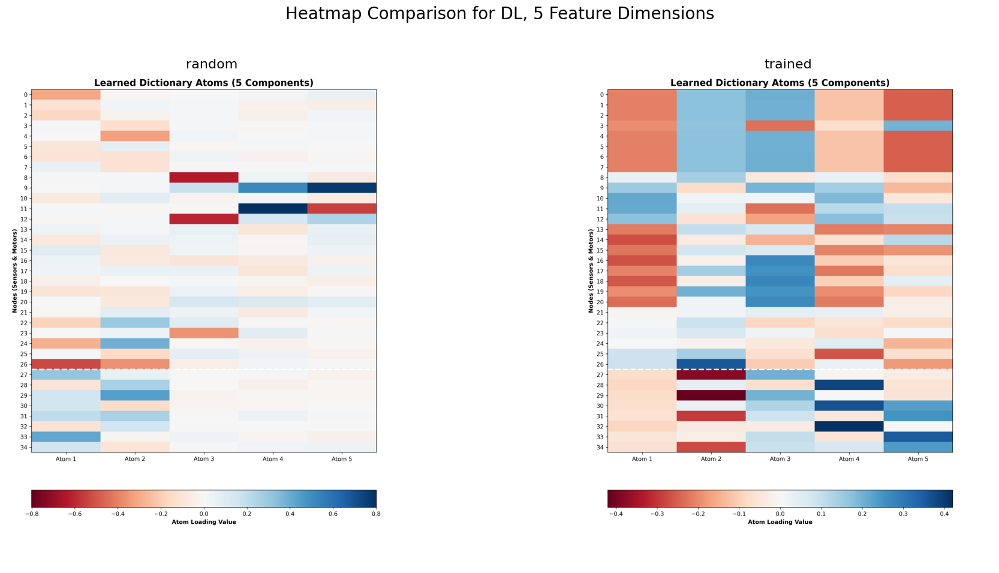

Analyzing trained sampling data
Running Dictionary Learning to find 9 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_trained_9fd.png


Analyzing random sampling data
Running Dictionary Learning to find 9 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 10
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_random_9fd.png




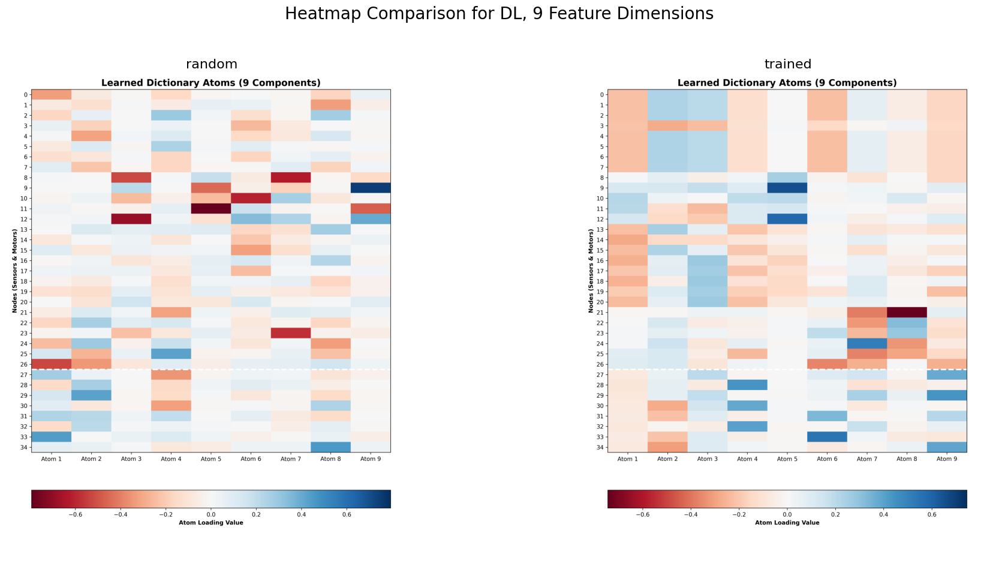

Analyzing trained sampling data
Running Dictionary Learning to find 14 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_trained_14fd.png


Analyzing random sampling data
Running Dictionary Learning to find 14 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 15
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_random_14fd.png




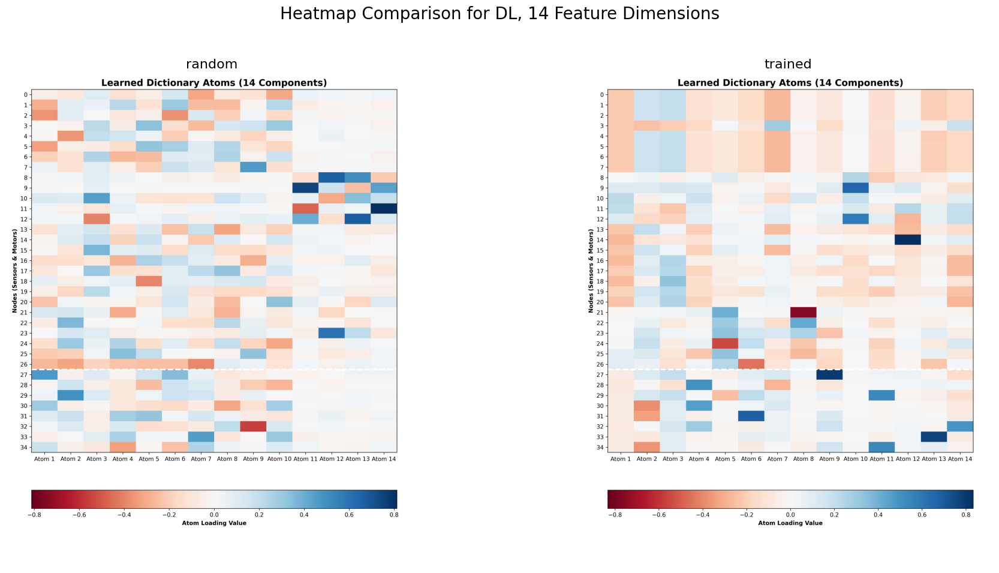

Analyzing trained sampling data
Running Dictionary Learning to find 19 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_trained_19fd.png


Analyzing random sampling data
Running Dictionary Learning to find 19 dictionary atoms...
DL complete. Extracting coordinates (loadings on dictionary atoms).
Normalizing coordinates...
Added layering dimension. Final coordinate size: 20
Dictionary atoms heatmap saved to: output/ant/data_analysis/dl_heatmap_random_19fd.png




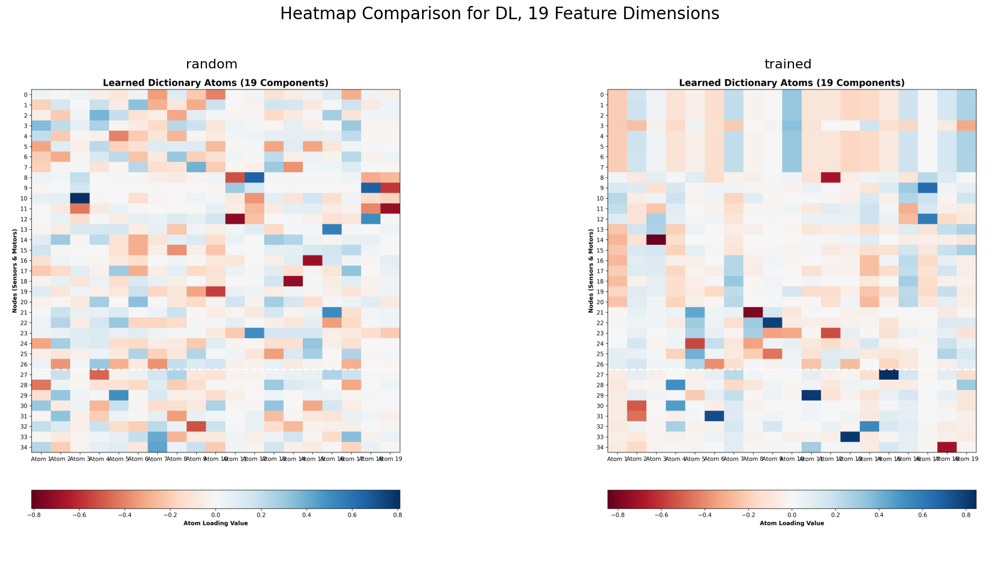

In [13]:
for feature_dims in feature_dims_repeats:  
    for data_label, data_array in data_sources.items():
        print(f"Analyzing {data_label} sampling data")
        analyzer_dl = DictionaryAnalyzer(
            data=data_array,
            obs_size=obs_size,
            act_size=act_size,
            feature_dims=feature_dims,
            alpha=config["data_analysis"]["dl_alpha"],
            max_iter=config["data_analysis"]["dl_max_iter"],
            width_factor=config["substrate"]["width_factor"],
            normalize_coors=config["data_analysis"]["normalize_coors"],
            depth_factor=config["substrate"]["depth_factor"],
        )
        input_coors_dl, output_coors_dl = analyzer_dl.generate_io_coordinates()
        generated_io_coors[data_label]["dl"][f"{feature_dims}fd"]["input_coors"] = input_coors_dl
        generated_io_coors[data_label]["dl"][f"{feature_dims}fd"]["output_coors"] = output_coors_dl
        analyzer_dl.plot_dictionary_atoms(save_path=f"{OUTPUT_DIR}/data_analysis/dl_heatmap_{data_label}_{feature_dims}fd.png")
        print("\n")

    display_plots_side_by_side(
        plot_paths=[f"{OUTPUT_DIR}/data_analysis/dl_heatmap_random_{feature_dims}fd.png", f"{OUTPUT_DIR}/data_analysis/dl_heatmap_trained_{feature_dims}fd.png"],
        plot_titles=["random", "trained"],
        main_title=f"Heatmap Comparison for DL, {feature_dims} Feature Dimensions",
        save_path=f"{OUTPUT_DIR}/data_analysis/dl_heatmap_comparison_{feature_dims}fd.png"
    )

## Substrate Generation

Now it's time to generate the full substrates. The input and ouput nodes have already been generated above, so the hidden layers are the crucial part that's missing.

### Generating Hidden Layers

A `HiddenLayerGenerator` class is used to generate hidden nodes from the input node. There are of course, many ways these hidden nodes can be defined in the high-dimensional space. The class has a few options hard-coded:

* `one_hot_binary`: This does a one-hot encoding of the dimensions, so there will be one coordinate for each dimension. E.g. for 3 Dimensions: (1,0,0),(0,1,0),(0,0,1)
* `one_hot_ternary`: This does a one-hot encoding of the dimensions which also includes negatives, so there will be one coordinate for each dimension. E.g. for 3 Dimensions: (1,0,0),(0,1,0),(0,0,1),(-1,0,0),(0,-1,0),(0,0,-1)
* `one_double_hot_binary`: This is the same as one-hot, but has two coordinates in every dimension, e.g. for 3 dimensions: (1,0,0),(0,1,0),(0,0,1),(2,0,0),(0,2,0),(0,0,2)
* `two_hot_binary`: This adds all possible pairs of dimensions as coordinates to the one_hor ecoding, e.g. for 3 dimensions: (1,0,0),(0,1,0),(0,0,1),(1,1,0),(1,0,1),(0,1,1)
* `shift`: This schema takes all input nodes and simply "shifts" every one of them into the layering direction by 1 for each layer.
* `shift_two_out`: This does the same as `shift`, but doubles the number of nodes by adding duplicates outside the bounds of the original nodes by adding the width_factor which determines the outer bounds of the dimensions.
* `shift_three_out`: This does the same as `shift_double_out`, but adds another set of duplicates of the original nodes with double the distance than before.
* `shift_two_in`: This does the same as `shift`, but doubles the number of nodes by adding duplicates inside the bounds of the original nodes by dividing the coordinates in each dimension by 2.
* `shift_three_in`: This does the same as `shift_double_in`, but adds another set of duplicates of the original where the nodes in each dimension are positioned at 1/3, 2/3 and full distance.

So `shift_*_in` increases the resolution while `shift_*_out` extends the network outwards.

One important thing to notice is that the number of generated hidden nodes is highly dependent on the number of dimensions (one_hot/one_double_hot linear and two_hot exponential), except for the `shift`-based methods.

In [14]:
hidden_layer_gen = HiddenLayerGenerator(
    env_name=env_name,
    obs_size=obs_size,
    act_size=act_size,
    hidden_layer_type=config["substrate"]["hidden_layer_type"],
    hidden_depth=config["substrate"]["hidden_depth"],
    depth_factor=config["substrate"]["depth_factor"],
    width_factor=config["substrate"]["width_factor"],
)

substrates = deep_defaultdict()

### Simple Baseline Substrate

Before the data-driven approchaes are applied, some baselines are needed. The first one is a very simple 2D grid. This is the basic baseline in the sense of a "vanilla" HyperNEAT algorithm.

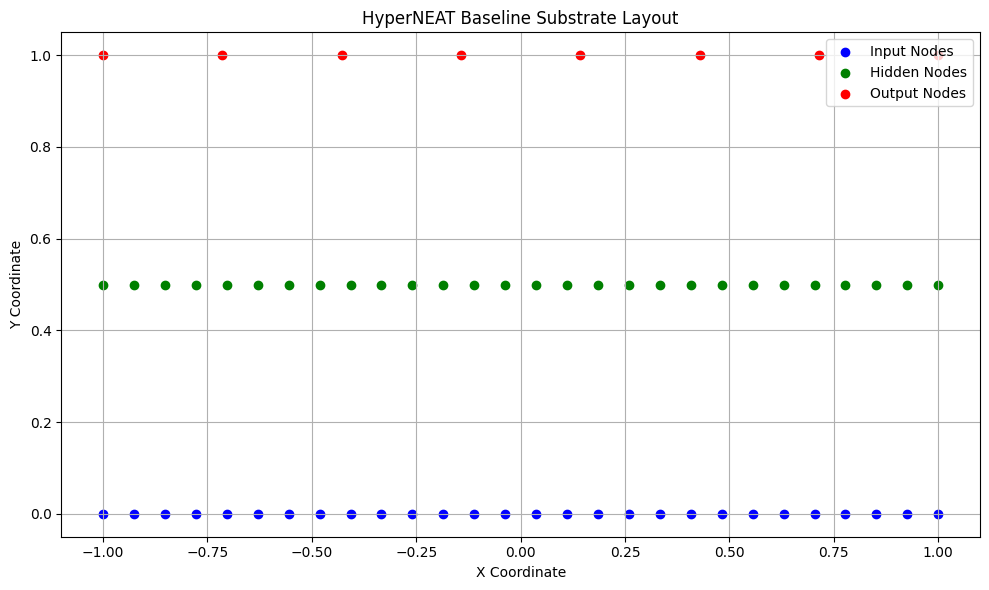

In [15]:
width_factor = config["substrate"]["width_factor"]
hidden_depth = config["substrate"]["hidden_depth"]
depth_factor = config["substrate"]["depth_factor"]

# Input nodes (including bias) spaced horizontally from -1 to 1 at y = 0
input_coors_simple = [(((i / (obs_size) * 2 - 1)*width_factor), 0) for i in range(obs_size+1)]

# Use hidden node generator
hidden_coors_simple = hidden_layer_gen.get_hidden_coors(input_coors=input_coors_simple)

# Output neurons spaced out evenly horizontally at y=(1*depth_factor)
output_coors_simple = [(((i / (act_size - 1) * 2 - 1)*width_factor), (depth_factor)) for i in range(act_size)]

substrates["manual"]["simple"][f"1fd"]["substrate"] = FullSubstrate(
    input_coors=input_coors_simple,
    hidden_coors=hidden_coors_simple,
    output_coors=output_coors_simple,
)

substrates["manual"]["simple"][f"1fd"]["input_coors"] = input_coors_simple
substrates["manual"]["simple"][f"1fd"]["hidden_coors"] = hidden_coors_simple
substrates["manual"]["simple"][f"1fd"]["output_coors"] = output_coors_simple

plt.figure(figsize=(10, 6))

# Plot each layer with different colors
x, y = zip(*input_coors_simple)
plt.scatter(x, y, c='blue', label='Input Nodes')
x, y = zip(*hidden_coors_simple)
plt.scatter(x, y, c='green', label='Hidden Nodes')
x, y = zip(*output_coors_simple)
plt.scatter(x, y, c='red', label='Output Nodes')

plt.title('HyperNEAT Baseline Substrate Layout')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/baseline_substrate")
plt.show()

### Random Substrate

We also want to test if our data-driven approaches are better than arbritarily chosen coordinates in an equally high-dimensional space. For this purpose the generator creates a substrate with the given number of dimensions in which all coordinates are random binary combinations, e.g. (0,1,0,1,1,0). If the target number of coordinates can't be created from unique binary combinations, the generator uses terniary combinations of 0, 0.5, 1. If that also fails to generate the required number of coordinates, if falls back to continous random numbers.

In [16]:
for feature_dims in feature_dims_repeats:  
    random_generator = RandomCoordinateGenerator(
        obs_size=obs_size,
        act_size=act_size,
        feature_dims=feature_dims,
        depth_factor=config["substrate"]["depth_factor"],
        width_factor=config["substrate"]["width_factor"],
    )
    input_coors_random, output_coors_random = random_generator.generate_io_coordinates()
    generated_io_coors["no_data"]["random_coors"][f"{feature_dims}fd"]["input_coors"] = input_coors_random
    generated_io_coors["no_data"]["random_coors"][f"{feature_dims}fd"]["output_coors"] = output_coors_random

Generating random coordinates with 1 feature dimensions...
Added layering dimension. Final coordinate size: 2
Generating random coordinates with 2 feature dimensions...
Added layering dimension. Final coordinate size: 3
Generating random coordinates with 5 feature dimensions...
Added layering dimension. Final coordinate size: 6
Generating random coordinates with 9 feature dimensions...
Added layering dimension. Final coordinate size: 10
Generating random coordinates with 14 feature dimensions...
Added layering dimension. Final coordinate size: 15
Generating random coordinates with 19 feature dimensions...
Added layering dimension. Final coordinate size: 20


### Substrate from Manual Mapping

The next baseline represents a substrate which is "hand-crafted" by a human expert.

A `ManualInputMapper` class creates substrate coordinates from a mapping of semantically meaningful categories such as "front", "back", "velocity", "angle". Every substrate node can be sorted into multiple categories. One of multiple categories form a dimension. E.g. "angle" might be a single dimension on its own whereas "front" and "back" are two opposite directions in the same dimension. Accordingly every category maps to a vector in the respective dimension. Applying all the vectors for a node, e.g. "front", "left", "hip" and "angular velocity" for the input node "angular velocity of the front left hip", generates the coordinate (0, 0, 1, 0, 0, 0, 0, -1, 1, 1, 0, 0).

The manual mappings are are implemented for the following [Brax environments](https://github.com/google/brax/tree/main/brax/envs):
* ant
* halfcheetah
* swimmer

In [17]:
manual_mapper = ManualIOMapper(
    env_name=env_name,
    obs_size=obs_size,
    act_size=act_size,
    hidden_layer_type=config["substrate"]["hidden_layer_type"],
    width_factor=config["substrate"]["width_factor"],
    depth_factor=config["substrate"]["depth_factor"],
)
input_coors_manual, output_coors_manual, manual_feature_dims = manual_mapper.generate_io_coordinates()
generated_io_coors["manual"]["mapping"][f"{manual_feature_dims}fd"]["input_coors"] = input_coors_manual
generated_io_coors["manual"]["mapping"][f"{manual_feature_dims}fd"]["output_coors"] = output_coors_manual

Using user-defined input and output mapping for 'ant'.
Number of feature dimensions: 9
Total number after adding output and layering dimensions (coord_size): 10
Number of output nodes: 8
Number of input nodes (obs + bias): 28


### Substrate from Data Analysis Results

Next, the input and output nodes created through data analysis are used to create substrates.

In [18]:
for data_label, data_dict in generated_io_coors.items():
    for method_label, method_dict in data_dict.items():
        for feature_dims_label, feature_dims_dict in method_dict.items():
            input_coors = feature_dims_dict["input_coors"]
            output_coors = feature_dims_dict["output_coors"]
            hidden_coors = hidden_layer_gen.get_hidden_coors(input_coors=input_coors)
            generated_io_coors[data_label][method_label][feature_dims_label]["hidden_coors"] = hidden_coors

            substrates[data_label][method_label][feature_dims_label]["substrate"] = FullSubstrate(
                input_coors=input_coors,
                hidden_coors=hidden_coors,
                output_coors=output_coors
            )

            substrates[data_label][method_label][feature_dims_label]["input_coors"] = input_coors
            substrates[data_label][method_label][feature_dims_label]["hidden_coors"] = hidden_coors
            substrates[data_label][method_label][feature_dims_label]["output_coors"] = output_coors

## Neuroevolution

Finally the substrates are ready to be used for neuroevolution with HyperNEAT. Weights and Biases (wandb) is used for logging and the CPPNs with highest fitness and their phenotypes are visualized. Coordinates are logged for further analysis.


In [19]:
for data_label, data_dict in substrates.items():
    for method_label, method_dict in data_dict.items():
        for feature_dims_label, feature_dims_dict in method_dict.items():

            active_substrate = substrates[data_label][method_label][feature_dims_label]["substrate"]
            evol_algorithm = create_evol_algorithm(substrate=active_substrate)

            initial_cppn_layers = config["algorithm"]["genome"]["cppn_init_hidden_layers"](active_substrate.query_coors.shape[1])
            print("Intial CPPN Layers:", initial_cppn_layers)
            substrate_dimensions = int(active_substrate.query_coors.shape[1]/2)

            wanbd_name = f"{env_name}_{data_label}_{method_label}_{substrate_dimensions}d"
            wandb_tags = [config["substrate"]["hidden_layer_type"], env_name, data_label, method_label, f"{config['substrate']['hidden_depth']}_hl", f"{config['algorithm']['neat']['pop_size']}pop", f"{config['environment']['backend']}"]

            wandb.init(
                name=wanbd_name,
                project="substrate_generation",
                tags=wandb_tags,
                config=config  
            )

            wandb.config.update(
                {
                    "substrate": {
                        "obs_size": obs_size,
                        "act_size": act_size,
                        "num_queries": active_substrate.query_coors.shape[0],
                        "query_dim": active_substrate.query_coors.shape[1],
                        },
                    "algorithm": {
                        "neat": {
                            "num_inputs": evol_algorithm.num_inputs,
                            },
                        "genome": {
                            "cppn_init_hidden_layers": initial_cppn_layers,
                            },
                        },
                },
            )

            pipeline = CustomPipeline(
                algorithm=evol_algorithm,
                problem=env_problem,
                seed=config["experiment"]["seed"],
                generation_limit=config["pipeline"]["generation_limit"],
                fitness_target=config["pipeline"]["fitness_target"],
                is_save=True,
                save_dir=config["experiment"]["output_dir"],
            )

            init_state = pipeline.setup()
            state = pipeline.auto_run(state=init_state)

            print(f"\nTraining finished. Best fitness achieved: {pipeline.best_fitness}")

            wandb.finish()

            append_summary_row(
                path=f"{OUTPUT_DIR}/summary_results.csv",
                row={
                    "dimensionality": int(active_substrate.query_coors.shape[1] / 2),
                    "sampling": data_label,
                    "method": method_label,
                    "max_fitness": float(pipeline.best_fitness),
                },
            )


            state_for_show = state[0] if isinstance(state, tuple) else state

            # Transform the best genome into network parameters
            best_genome = pipeline.best_genome

            # Built-in show method to produce and save a video of the agent
            pipeline.show(
                state=state_for_show,
                best=best_genome,
                output_type="mp4",
                save_path=f"{OUTPUT_DIR}/video/agent_{data_label}_{method_label}_{feature_dims_label}.mp4",
            )

            # All coordinates are needed for visualization
            input_coors = substrates[data_label][method_label][feature_dims_label]["input_coors"]
            hidden_coors = substrates[data_label][method_label][feature_dims_label]["hidden_coors"]
            output_coors = substrates[data_label][method_label][feature_dims_label]["output_coors"]

            # Visualizes the CPPN
            visualize_cppn(
                pipeline=pipeline, 
                state=state, 
                save_path=f"{OUTPUT_DIR}/topology/cppn_{data_label}_{method_label}_{feature_dims_label}.svg"
            )
            
            # Visualizes a representation of the neural network in 2D space
            visualize_nn(
                pipeline=pipeline, 
                state=state, 
                save_path=f"{OUTPUT_DIR}/topology/nn_{data_label}_{method_label}_{feature_dims_label}.svg", 
                substrate=active_substrate, 
                input_coors=input_coors, 
                hidden_coors=hidden_coors, 
                output_coors=output_coors, 
                hidden_depth=config["substrate"]["hidden_depth"], 
                max_weight=config["algorithm"]["hyperneat"]["max_weight"], 
            )
            
            # all input and output coordinates are logged for further analysis
            log_coors = input_coors
            for coor in hidden_coors:
                log_coors.append(coor)
            for coor in output_coors:
                log_coors.append(coor)
            save_coordinates_to_csv(
                coordinates=log_coors,
                filepath=f"{OUTPUT_DIR}/coordinates/{data_label}_{method_label}_{feature_dims_label}_io.csv",
            )


Intial CPPN Layers: [2]


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


wandb: Network error (ConnectionError), entering retry loop.


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 33.821094s
Generation: 1, Cost time: 22589.05ms
 	fitness: valid cnt: 3000, max: 51.2932, min: -3969.3506, mean: -1410.1953, std: 1289.0321

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [89, 143, 1, 1, 1, 44, 41, 32, 32, 83, 56, 1, 1, 1, 4, 73, 140, 55, 70, 2132]

Generation: 2, Cost time: 22856.43ms
 	fitness: valid cnt: 3000, max: 55.4699, min: -3964.3320, mean: -520.3711, std: 999.0314

	node counts: max: 9, min: 6, mean: 7.47
 	conn counts: max: 14, min: 4, mean: 10.60
 	species: 20, [6, 156, 166, 162, 134, 69, 125, 123, 114, 112, 159, 89, 16, 44, 37, 35, 28, 20, 13, 1392]

Generation: 3, Cost time: 22985.69ms
 	fitness: valid cnt: 3000, max: 55.3222, min: -3951.7920, mean: -162.2603, std: 662.8991

	node counts: max: 10, min: 5, mean: 7.67
 	conn counts: max: 16, min: 1, mean: 10.89
 	species: 20, [224, 9, 176, 91, 139, 151, 158, 1

compute_ms,▄▆▇▅▃▄▃▆▇▂▂▁▂▃▃▂▄▃▄▃▄▄▆▇█▇▇███▄▄▅▅▅▅▅▅▅▅
compute_ms_pop,▆▇▅▄▄▁▁▄▂▃▂▃▃▃▂▃▃▄▃▄▃▄▇██▇██▇▄▄▄▅▅▅▅▅▅▅▅
fitness_max,▁▁▁▁▂▆▆▅▆▅▆▅▆▇█▆▇▇▇▅▆▆▇▇▇█▇█▇▇▇▇▇▇▇▆▇▇▇█
fitness_mean,▆█▆▆▄▄▄▂▁▁▃▅▄▄▄▆▇▇▇▆█▇▇▇▇▇▆▆▆▇██▇▆█▇▇▇█▇
fitness_min,▄▃▇▄▄▇▆▃▆▂▇▅▅█▆▇▃▂▇▇▆▁▆▄▂▅▄█▁▅▄▄▅▄▇▃▆▇▇▆
fitness_std,▅▅▇▄▅▇▇█▅▅▅▆▄▄▃▂▂▃▃▃▃▂▃▃▂▄▂▃▅▄▂▂▃▃▁▁▁▁▃▃
generation,▁▁▁▁▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
num_species,███████████████████████████▅██▅█▁███▅▅██
compute_ms,22840.62314
compute_ms_pop,7.61354
fitness_max,285.25177


Total reward:  -39.136524


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_manual_simple_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_manual_simple_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1510 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_manual_simple_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/manual_simple_1fd_io.csv
Intial CPPN Layers: [2]


wandb: Currently logged in as: wirkelzirkel (wirkelzirkel-iu) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 32.718821s
Generation: 1, Cost time: 22276.64ms
 	fitness: valid cnt: 3000, max: 52.8055, min: -3958.3367, mean: -1247.0853, std: 1256.2452

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [13, 73, 52, 26, 7, 6, 1, 1, 27, 11, 19, 25, 15, 17, 4, 4, 7, 13, 19, 2660]

Generation: 2, Cost time: 22176.45ms
 	fitness: valid cnt: 3000, max: 52.9554, min: -3956.9158, mean: -623.9868, std: 1103.8258

	node counts: max: 25, min: 21, mean: 23.43
 	conn counts: max: 46, min: 0, mean: 42.32
 	species: 20, [23, 172, 137, 1, 118, 56, 110, 101, 1, 81, 95, 3, 59, 52, 52, 41, 5, 26, 13, 1854]

Generation: 3, Cost time: 22304.18ms
 	fitness: valid cnt: 3000, max: 55.9074, min: -3956.1296, mean: -172.7953, std: 686.7237

	node counts: max: 26, min: 21, mean: 23.65
 	conn counts: max: 48, min: 1, mean: 41.90
 	species: 20, [2, 217, 156, 164, 163, 132, 113,

compute_ms,▁▁▁▁▁▂▂▂▃▂▃▃▄▄▄▃▄▄▃▄▄▄▄▄▄▅▅▅▄▅▅▆▆▆▆▇▇▇▇█
compute_ms_pop,▁▁▁▁▁▂▂▂▃▃▃▃▂▃▄▄▄▄▄▅▅▅▅▅▅▅▆▇▇▇▆▇▇▇▇▇▇██▇
fitness_max,▁▂▂▃▃▃▃▃▃▄▃▄▃▄▄▄▄▄▅▄▅▅▆▅▅▆▇▆▇▆▆▇▇▇█▇▇█▇▇
fitness_mean,▁▇▇▇▇███████████████████████████████████
fitness_min,▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▇▁▇▃▂▇▂▂▇▂▁▁▇▇▅▁▁▁▇█▁▁▁
fitness_std,█▆▆▅▅▃▄▃▄▄▃▃▄▃▃▃▄▃▃▃▂▃▃▂▁▂▂▂▂▁▂▁▁▂▂▂▂▂▂▂
generation,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇██
num_species,████████████████▆██████▇███▇▆▇▆▇▇██▇▇▃▂▁
compute_ms,23608.54292
compute_ms_pop,7.86951
fitness_max,525.89185


Total reward:  -32.186035


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_manual_mapping_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_manual_mapping_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1705 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_manual_mapping_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/manual_mapping_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 33.259935s
Generation: 1, Cost time: 21756.29ms
 	fitness: valid cnt: 3000, max: 57.5416, min: -3966.5337, mean: -1761.7791, std: 1271.0018

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [67, 46, 71, 71, 32, 1, 5, 1, 152, 26, 36, 133, 1, 1, 1, 73, 166, 13, 1, 2103]

Generation: 2, Cost time: 21644.12ms
 	fitness: valid cnt: 3000, max: 60.5561, min: -3958.8428, mean: -663.3815, std: 1117.2832

	node counts: max: 9, min: 5, mean: 7.52
 	conn counts: max: 14, min: 1, mean: 10.62
 	species: 20, [168, 45, 65, 74, 39, 80, 85, 12, 107, 100, 144, 7, 62, 49, 42, 14, 28, 20, 13, 1846]

Generation: 3, Cost time: 21782.17ms
 	fitness: valid cnt: 3000, max: 81.4081, min: -3957.1028, mean: -286.5479, std: 847.7054

	node counts: max: 10, min: 5, mean: 7.72
 	conn counts: max: 15, min: 1, mean: 10.98
 	species: 20, [228, 117, 259, 13, 95, 129, 43, 26, 

compute_ms,▁▁▁▂▁▃▃▂▃▃▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▇▆▇▆▇▇██▇▇▇█▇
compute_ms_pop,▁▂▂▃▃▂▃▃▃▃▄▄▄▄▅▄▅▅▅▄▅▅▆▆▆▆▆▆▆▆▇▇▇█▇▇▇██▇
fitness_max,▁▂▄▆▇▆▇█▇▇▇▇▇███▇▇██▇█▇▇██▇▇█▇███▇▇██▇▇█
fitness_mean,▅▆▆▅▅▁▁▃▃▃▅▅▅▅▅▅▅▅▆▆▅▅▆▆▇▇▅▆▆▆▇▆▇▆▇▇▇▇▇█
fitness_min,▂▄▂▂▄▂▃▂▁▂▃▄▄▄▆▄▁▂▅▄▅▂▅▅▅▃▅▄▇▄▅▄▇▄▁▄█▆▅▃
fitness_std,█▃▃▄▅▅▅▃▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▂▂▃▃▂▂▂▂▁▂▁▂▂▂▁▁▁
generation,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇██
num_species,███████████████████████▅████████▁██▅████
compute_ms,22876.01042
compute_ms_pop,7.62534
fitness_max,235.94363


Total reward:  -11.890748


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_ica_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_ica_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1727 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_ica_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_ica_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 33.344764s
Generation: 1, Cost time: 21767.40ms
 	fitness: valid cnt: 3000, max: 51.4016, min: -3966.0735, mean: -1708.3348, std: 1267.0327

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [101, 76, 50, 61, 66, 1, 1, 1, 46, 16, 47, 63, 107, 39, 1, 3, 1, 28, 20, 2272]

Generation: 2, Cost time: 21850.23ms
 	fitness: valid cnt: 3000, max: 58.1968, min: -3965.9143, mean: -607.4836, std: 1078.6305

	node counts: max: 11, min: 7, mean: 9.48
 	conn counts: max: 18, min: 0, mean: 14.68
 	species: 20, [16, 173, 26, 7, 269, 75, 113, 156, 43, 47, 30, 15, 172, 26, 66, 35, 28, 20, 13, 1670]

Generation: 3, Cost time: 21859.02ms
 	fitness: valid cnt: 3000, max: 53.3257, min: -3960.8672, mean: -209.8612, std: 726.7858

	node counts: max: 12, min: 8, mean: 9.63
 	conn counts: max: 20, min: 2, mean: 14.81
 	species: 20, [211, 116, 4, 128, 174, 139, 155, 

compute_ms,▁▁▁▂▂▃▃▃▄▄▅▅▆▆▅▆▆▇▇▆▆▇▆▆▆▇▇▇▇▇▇▇▇▇▇█████
compute_ms_pop,▁▁▂▂▃▃▄▄▅▅▆▆▇▆▇▇▆▆▇▇▇▇▇▇▇▇▇▇▇▇████▇█████
fitness_max,▁▁▁▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▇▆▇▇█▇█▇▇▇▇█
fitness_mean,▅▅▅▅▅▅▅▅▄▄▁▁▃▅▄▆▇▇▇▇█▇▇▇▇█▇█████▇▇▇▇▇▇▇▇
fitness_min,▃▃▃▃▄▂▄▃▂▃▂▃▃▂▃▄▃▂▃▄▃▄▃▃▃▅▄▇▄▁▄█▃▃▅▄▂▄▃▄
fitness_std,█▃▃▃▃▃▃▄▄▅▄▅▅▅▄▃▂▂▁▂▁▂▁▂▁▁▁▁▁▁▁▂▂▁▁▂▂▂▂▂
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇██
num_species,████████████████████████████▅██████████▁
compute_ms,23014.49561
compute_ms_pop,7.6715
fitness_max,342.9425


Total reward:  -34.03875


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_ica_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_ica_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1691 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_ica_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_ica_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 33.551047s
Generation: 1, Cost time: 21936.44ms
 	fitness: valid cnt: 3000, max: 52.4300, min: -3956.5825, mean: -1443.7677, std: 1278.7982

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [33, 69, 61, 11, 28, 2, 1, 2, 17, 72, 24, 18, 38, 25, 7, 2, 40, 30, 40, 2480]

Generation: 2, Cost time: 21977.61ms
 	fitness: valid cnt: 3000, max: 54.4022, min: -3954.2026, mean: -556.7469, std: 1076.6533

	node counts: max: 17, min: 13, mean: 15.48
 	conn counts: max: 30, min: 0, mean: 26.29
 	species: 20, [176, 34, 170, 159, 136, 5, 120, 18, 103, 50, 4, 88, 67, 47, 1, 40, 1, 7, 15, 1759]

Generation: 3, Cost time: 22031.17ms
 	fitness: valid cnt: 3000, max: 68.9045, min: -3956.5747, mean: -200.7459, std: 725.7577

	node counts: max: 18, min: 13, mean: 15.75
 	conn counts: max: 31, min: 1, mean: 26.55
 	species: 20, [2, 221, 79, 169, 171, 190, 145

compute_ms,▂▁▂▁▁▂▃▃▃▃▃▃▄▄▄▅▅▅▄▄▄▅▅▅▅▅▅▆▅▆▆▆▆▇██████
compute_ms_pop,▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▄▅▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇█
fitness_max,▁▂▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇█▇▇▇▇▇▇▇▇▇█▇█▇▇▇██
fitness_mean,▅▃▁▃▃▅▄▄▅▅▆▅▅▄▆▃▃▄▅▅▃▅▅▃▆▅▆▄▆▅▇█▇█▆▇▅▆▆▄
fitness_min,▂▂▄▃▃▄▂▃▃▄▁▃▄▄█▃█▄▄▃▄▄█▃▆▂▂▅▁▅▅▄▃▃▄▂▃▄▁▃
fitness_std,█▁▂▂▂▂▂▁▂▁▃▃▃▃▃▃▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▃▂▂▂▃
generation,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇███
num_species,█████████████████████████████████▆▃█▃█▁▃
compute_ms,23062.05583
compute_ms_pop,7.68735
fitness_max,488.35699


Total reward:  -34.112755


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_ica_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_ica_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1408 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_ica_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_ica_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 33.711062s
Generation: 1, Cost time: 22162.30ms
 	fitness: valid cnt: 3000, max: 69.4403, min: -3963.6499, mean: -1345.3416, std: 1260.5416

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [20, 72, 56, 22, 6, 3, 1, 1, 32, 5, 11, 31, 5, 26, 4, 3, 1, 6, 15, 2680]

Generation: 2, Cost time: 22183.70ms
 	fitness: valid cnt: 3000, max: 85.3569, min: -3955.1572, mean: -631.4874, std: 1117.1417

	node counts: max: 25, min: 22, mean: 23.48
 	conn counts: max: 46, min: 20, mean: 42.03
 	species: 20, [3, 171, 142, 12, 129, 117, 110, 70, 3, 81, 2, 64, 84, 74, 44, 43, 7, 1, 13, 1830]

Generation: 3, Cost time: 22279.43ms
 	fitness: valid cnt: 3000, max: 100.2952, min: -3956.5957, mean: -159.4011, std: 665.7988

	node counts: max: 26, min: 21, mean: 23.65
 	conn counts: max: 48, min: 0, mean: 41.36
 	species: 20, [232, 1, 197, 162, 135, 128, 127, 1

compute_ms,▁▁▂▂▂▃▃▂▃▃▃▃▄▄▅▅▅▅▆▆▅▅▆▆▆▆▆▆▆▆▇▇▇▆▇▇▇██▇
compute_ms_pop,▁▁▁▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▅▆▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇██
fitness_max,▁▁▂▄▅▅▅▆▆▆▆▇▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇█▇█▇█▇
fitness_mean,▁▅▇▇▇███████████████████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▃▁▁▂▁▁▄▁▁▁▁█▁▁▂▁▇▁▁▁▁▁▂
fitness_std,█▃▃▃▂▂▁▁▂▁▂▂▂▂▂▂▂▂▂▂▂▂▃▂▂▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂
generation,▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
num_species,████████████████████████████▆███████▆▁██
compute_ms,23565.24444
compute_ms_pop,7.85508
fitness_max,512.41974


Total reward:  -34.032604


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_ica_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_ica_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1693 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_ica_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_ica_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 34.182401s
Generation: 1, Cost time: 22531.41ms
 	fitness: valid cnt: 3000, max: 51.4568, min: -3960.7104, mean: -1266.6661, std: 1238.9889

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [10, 75, 57, 10, 10, 8, 1, 3, 24, 10, 11, 11, 4, 17, 4, 3, 2, 7, 27, 2706]

Generation: 2, Cost time: 22552.84ms
 	fitness: valid cnt: 3000, max: 53.5035, min: -3959.4963, mean: -458.6516, std: 922.1451

	node counts: max: 35, min: 31, mean: 33.42
 	conn counts: max: 66, min: 0, mean: 61.50
 	species: 20, [93, 173, 154, 124, 117, 4, 103, 1, 89, 12, 75, 71, 58, 53, 52, 43, 1, 19, 3, 1755]

Generation: 3, Cost time: 22617.08ms
 	fitness: valid cnt: 3000, max: 57.7591, min: -3948.3591, mean: -126.8474, std: 571.2815

	node counts: max: 36, min: 31, mean: 33.64
 	conn counts: max: 68, min: 2, mean: 60.10
 	species: 20, [2, 220, 138, 161, 155, 128, 157, 1

compute_ms,▁▂▂▂▃▂▃▃▃▃▃▃▄▄▄▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███▇█
compute_ms_pop,▁▁▁▁▁▂▂▂▃▃▃▂▃▃▃▄▃▃▄▄▅▅▅▆▆▅▅▆▆▆▆▇▇▇▇█▇███
fitness_max,▁▂▄▃▅▅▅▆▆▆▆▆▇▆▆▇▇▆▇▇▇▇▆▇▇▇▆█▇██▇▇▇▇▆▇▇▇▆
fitness_mean,▁▇▇▇▇▆▇▆▆▆▆▅▆▆▆▆▇▇▇▇▇████▇▇██▇█▇▇▇▇▇▇▇▇▇
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▆▇█▁▂▁▄▁▁▁▁▁▁▁▃▁▁▁▁▁▁
fitness_std,▅█▆▄▄▅▄▅▅▅▅▅▅▄▆▃▃▃▂▃▃▃▂▂▂▁▂▂▂▁▃▂▂▂▂▃▂▄▃▃
generation,▁▁▁▁▁▂▂▂▃▃▃▃▃▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇███
num_species,██████████████████▅█▁██████████████████▅
compute_ms,23723.78206
compute_ms_pop,7.90793
fitness_max,490.07758


Total reward:  -32.152035


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_ica_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_ica_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1705 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_ica_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_ica_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.542309s
Generation: 1, Cost time: 22909.34ms
 	fitness: valid cnt: 3000, max: 54.4357, min: -3956.9646, mean: -1237.5699, std: 1220.0792

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [26, 76, 57, 8, 6, 2, 1, 1, 18, 7, 11, 22, 4, 10, 9, 3, 3, 18, 15, 2703]

Generation: 2, Cost time: 22886.21ms
 	fitness: valid cnt: 3000, max: 56.8885, min: -3955.9233, mean: -377.8306, std: 895.1901

	node counts: max: 45, min: 41, mean: 43.53
 	conn counts: max: 86, min: 0, mean: 81.98
 	species: 20, [1, 173, 29, 124, 2, 115, 127, 97, 100, 83, 2, 72, 54, 6, 47, 37, 1, 22, 13, 1895]

Generation: 3, Cost time: 22915.90ms
 	fitness: valid cnt: 3000, max: 109.7911, min: -3949.4150, mean: -134.6670, std: 594.6661

	node counts: max: 46, min: 42, mean: 43.79
 	conn counts: max: 87, min: 4, mean: 81.85
 	species: 20, [2, 5, 215, 268, 176, 164, 163, 134, 

compute_ms,▁▁▁▂▂▂▂▂▂▂▃▃▄▄▄▅▄▄▅▅▆▆▆▆▆▆▇▆▆▆▇▆▇▇▇▇▇███
compute_ms_pop,▁▁▁▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▆▆▆▇▇▇▆▇▇▇████
fitness_max,▁▃▃▃▃▄▅▅▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇██▇███▇██▇██
fitness_mean,▁▇▇█████████████████████████▇█▇▇▇▇▇█▇▇▇▇
fitness_min,▁▁▁▁▁▁▃▁▁▁▁▁▄▁▁█▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▂▁▁▁▁▁▁▁
fitness_std,▄▅▅▅▆▄▄▄▁▂▂▂▃▃▂▃▃▂▄▃▄▅▄▆▆▄▆▆▆▆▆▆▇▆▅▆▅▇▆█
generation,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇██
num_species,███████████████████████████▇█▆████▆▁████
compute_ms,24324.31984
compute_ms_pop,8.10811
fitness_max,577.77295


Total reward:  -34.767193


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_ica_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_ica_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1681 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_ica_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_ica_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 34.443920s
Generation: 1, Cost time: 21658.41ms
 	fitness: valid cnt: 3000, max: 59.5234, min: -3961.8362, mean: -1756.3455, std: 1272.7333

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [126, 46, 79, 27, 33, 1, 5, 1, 29, 27, 52, 32, 75, 51, 1, 2, 1, 11, 82, 2319]

Generation: 2, Cost time: 21667.22ms
 	fitness: valid cnt: 3000, max: 75.4680, min: -3957.2383, mean: -646.3167, std: 1109.6040

	node counts: max: 9, min: 5, mean: 7.45
 	conn counts: max: 14, min: 1, mean: 10.73
 	species: 20, [167, 15, 212, 109, 178, 141, 112, 37, 112, 96, 100, 42, 5, 64, 39, 35, 1, 20, 13, 1502]

Generation: 3, Cost time: 21768.44ms
 	fitness: valid cnt: 3000, max: 91.1167, min: -3960.0085, mean: -240.0142, std: 791.8391

	node counts: max: 10, min: 5, mean: 7.62
 	conn counts: max: 16, min: 1, mean: 11.03
 	species: 20, [227, 162, 1, 138, 168, 163, 166, 1

compute_ms,▁▂▂▂▃▂▂▂▃▃▄▄▃▃▃▅▅▄▅▅▅▅▆▆▆▆▅▅▅▆▆▆▆▆▆▆▇▇██
compute_ms_pop,▁▂▂▂▃▂▂▂▃▃▃▃▃▃▄▄▅▅▄▅▅▆▆▆▆▆▆▆▆▆▇▆▆▇▇▇▇▇██
fitness_max,▁▂▂▂▁▃▁▂▃▃▄▅▆▅▅▆▆▇▆▇▇▅▅▆▇▆▆▆▇▆▆▆▇█▇▇▇▇▇▇
fitness_mean,█▇▇▇▅▄▃▂▂▁▂▂▃▃▃▂▂▃▄▃▂▁▂▃▃▂▃▃▄▅▅▅▆▅▄▄▃▂▂▃
fitness_min,▇█▄█▆▇▇█▆▇▄▆▇▇▇▆▇▇▆▇▆▆▄▆▇██▅▇▅▅███▇▆▇▁▆▃
fitness_std,▁▁▂▂▇▆▆▅▆▇▅▅▅▆▆▇▆▇▇▇▆▇█▆▅▄▄▄▄▄▄▅▅▅▅▆▆▆▇▆
generation,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22745.14747
compute_ms_pop,7.58172
fitness_max,219.88606


Total reward:  -11.612042


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1412 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_pca_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_pca_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.348360s
Generation: 1, Cost time: 21711.28ms
 	fitness: valid cnt: 3000, max: 51.2597, min: -3965.9365, mean: -1706.4825, std: 1280.1720

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [112, 70, 45, 37, 14, 1, 1, 1, 44, 24, 14, 23, 1, 1, 1, 28, 109, 52, 48, 2374]

Generation: 2, Cost time: 21746.23ms
 	fitness: valid cnt: 3000, max: 52.6216, min: -3963.0977, mean: -706.0294, std: 1153.8977

	node counts: max: 11, min: 7, mean: 9.45
 	conn counts: max: 18, min: 0, mean: 14.77
 	species: 20, [16, 190, 168, 145, 5, 115, 137, 39, 106, 89, 145, 80, 70, 65, 42, 35, 28, 20, 13, 1492]

Generation: 3, Cost time: 21841.85ms
 	fitness: valid cnt: 3000, max: 55.0232, min: -3954.9436, mean: -257.2007, std: 783.0120

	node counts: max: 12, min: 8, mean: 9.72
 	conn counts: max: 19, min: 6, mean: 14.96
 	species: 20, [2, 179, 202, 138, 133, 150, 150

compute_ms,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▂▃▃▂▃▃▃▃▃▄▄▄▄▄▄▄▄▆▇█▇███
compute_ms_pop,▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▄▃▄▄▄▄▄▄▄▅▅▆▇▇▇█
fitness_max,▁▁▁▅▇▆▆▇█▇▇▇▇▇▇██▇▇▇▇▇██▇█▇█████████████
fitness_mean,▂▂▁▂▂▄▃▄▄▂▃▃▃▄▃▄▄▅▃▄▃▅▆▆▇██▇▇▇▇▇▆▇▇▆▅▇▆▆
fitness_min,▁▂▅▄▃▆▄▂▄▄▆▇▆▆▄▅▇▆▅▆▅▄▇▆▅▆▆▅▆▆▆▆▆▅▆▄▅█▆▆
fitness_std,█▄▅▄▄▄▄▄▄▄▃▄▃▃▃▃▃▃▃▃▃▂▂▁▁▁▁▂▂▂▂▁▁▁▁▁▂▂▂▂
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇██
num_species,████████████████████████▁██▁███████████▁
compute_ms,24036.07917
compute_ms_pop,8.01203
fitness_max,398.38162


Total reward:  -34.504078


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1083 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_pca_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_pca_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 32.435045s
Generation: 1, Cost time: 22932.16ms
 	fitness: valid cnt: 3000, max: 52.7595, min: -3955.6384, mean: -1474.3384, std: 1283.5875

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [56, 68, 59, 38, 37, 1, 1, 1, 30, 40, 45, 43, 22, 41, 2, 1, 1, 30, 12, 2472]

Generation: 2, Cost time: 22950.08ms
 	fitness: valid cnt: 3000, max: 53.5070, min: -3954.5327, mean: -543.3818, std: 1076.5945

	node counts: max: 17, min: 14, mean: 15.52
 	conn counts: max: 30, min: 12, mean: 26.54
 	species: 20, [9, 167, 156, 150, 9, 38, 1, 111, 100, 53, 91, 49, 67, 1, 42, 35, 28, 22, 13, 1858]

Generation: 3, Cost time: 22346.44ms
 	fitness: valid cnt: 3000, max: 59.2267, min: -3951.4543, mean: -126.4646, std: 571.2345

	node counts: max: 18, min: 13, mean: 15.75
 	conn counts: max: 32, min: 2, mean: 26.46
 	species: 20, [2, 218, 177, 188, 193, 124, 17

compute_ms,▁▃▂▅▃▅▃▁▃▂▁▃▇▆▆▇▆▃▃▅▂▄▄▄▄▅▅▅▅▅▅▅▅▆▆▇▇▇▇█
compute_ms_pop,▅▂▃▂▄▃▂▂▁▁▃▆▅▅▇▆█▄▄▄▄▄▄▅▅▅▅▅▅▅▆▅▆▆▆▇▇▇█▇
fitness_max,▁▃▂▃▄▅▅▅▆▅▅▆▇▅▆▆▆▆▆▆▆▆▆▆▇▆▆▇▇▇▇▇▇▆▇▆▇█▇▇
fitness_mean,▁▃▂▄▄▄▅▅▅▅▆▅▆▆▆▇▆▇▇█▇▇█▆▇█▇▇▆▇█▇▇▆▇▇▇▇▆▅
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▅▁▁▁▁▁▁▁▁▁▁▅▁▁▁▁▁▁▁█▁▇▁▁
fitness_std,█▃▃▃▃▂▂▂▃▂▂▂▂▁▁▂▂▁▂▂▂▂▁▁▂▂▂▂▃▂▂▁▂▂▂▂▂▂▂▃
generation,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇███
num_species,█████████████████████████████▁███▆▅█▆███
compute_ms,23342.67926
compute_ms_pop,7.78089
fitness_max,474.62714


Total reward:  -30.929398


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1623 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_pca_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_pca_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.947300s
Generation: 1, Cost time: 22227.59ms
 	fitness: valid cnt: 3000, max: 57.3224, min: -3968.7373, mean: -1401.8531, std: 1274.8195

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [12, 73, 57, 11, 15, 4, 1, 1, 29, 15, 23, 6, 2, 12, 1, 2, 1, 18, 25, 2692]

Generation: 2, Cost time: 22234.30ms
 	fitness: valid cnt: 3000, max: 68.6826, min: -3957.0649, mean: -656.1396, std: 1120.4178

	node counts: max: 25, min: 21, mean: 23.57
 	conn counts: max: 46, min: 0, mean: 42.35
 	species: 20, [176, 171, 14, 133, 1, 10, 132, 103, 87, 4, 76, 1, 61, 49, 49, 35, 29, 20, 1, 1848]

Generation: 3, Cost time: 22214.17ms
 	fitness: valid cnt: 3000, max: 77.3965, min: -3952.7622, mean: -162.2460, std: 685.0766

	node counts: max: 26, min: 22, mean: 23.77
 	conn counts: max: 47, min: 21, mean: 42.76
 	species: 20, [235, 217, 196, 3, 157, 117, 117,

compute_ms,▁▁▁▁▂▁▂▃▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▃▃▃███▂▂▃▃▃▃▃▃▃▃
compute_ms_pop,▁▁▁▁▂▁▂▂▂▂▂▃▂▃▂▃▃▃▃▃▃▄▄▄▄▆▄█▂▃▃▃▃▃▃▃▃▃▃▃
fitness_max,▁▃▃▄▃▄▅▅▄▅▆▇▆▅▇▆███▇▇▆▆▆▇▆▇▇▇▆▇█▆▇▇▇▇▇▇█
fitness_mean,▂▂▁▁▂▁▁▁▂▅▅▆▆▆▆▇▇▇▇▇▇▇██▇▇▇▇██▇▇███▇▇▇██
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▂▁▁▁▃▁▁▂▄▁▁▁███▁▃
fitness_std,▇██▇▇▇▆▄▂▂▂▂▃▂▁▂▁▂▃▂▂▁▁▂▃▂▁▁▂▁▁▂▁▃▂▃▂▃▂▂
generation,▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
num_species,████████████████████████▆███████▆█▃▁▆██▆
compute_ms,22782.90987
compute_ms_pop,7.5943
fitness_max,573.09015


Total reward:  -34.441944


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1655 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_pca_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_pca_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.329374s
Generation: 1, Cost time: 21918.87ms
 	fitness: valid cnt: 3000, max: 51.2771, min: -3959.1289, mean: -1289.4457, std: 1229.2861

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [32, 76, 56, 18, 22, 4, 1, 1, 15, 20, 16, 9, 8, 26, 6, 9, 6, 7, 21, 2647]

Generation: 2, Cost time: 21944.59ms
 	fitness: valid cnt: 3000, max: 93.1756, min: -3963.0095, mean: -448.6060, std: 920.2137

	node counts: max: 35, min: 31, mean: 33.49
 	conn counts: max: 66, min: 0, mean: 61.64
 	species: 20, [31, 144, 165, 1, 116, 113, 105, 107, 95, 48, 1, 5, 78, 7, 44, 32, 35, 24, 13, 1836]

Generation: 3, Cost time: 21961.37ms
 	fitness: valid cnt: 3000, max: 89.7125, min: -3953.4622, mean: -166.2242, std: 635.6863

	node counts: max: 36, min: 31, mean: 33.71
 	conn counts: max: 68, min: 0, mean: 60.03
 	species: 20, [2, 205, 91, 159, 195, 151, 147, 14

compute_ms,▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▅▅▄▄▄▄▅▅▅▄▅▅▅▅▅▆▆▆▇▇█████
compute_ms_pop,▁▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▅▅▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇████
fitness_max,▁▃▄▅▆▆▆▆▇▇▇▆▆▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇█▇█████▇▇▇█
fitness_mean,▅▄▁▂▃▂▃▁▄▃▅▅▆█▅▆▅▆▇▆▆█▇▇▇▇▆▆▆▇▅▆▄▆▄▅▅▅▅▄
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁█▁▁▁▁▂▂▁█▁▁▁▁▁▁▅▁▁▁▁▁▁▁▁▁
fitness_std,█▂▂▂▄▃▃▃▂▂▃▃▃▃▂▂▃▂▂▂▁▂▂▂▂▂▂▂▂▂▃▂▂▃▃▄▄▃▄▃
generation,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
num_species,█████████████████████████████▇█▇▅▅▄▇██▇▁
compute_ms,23177.08015
compute_ms_pop,7.72569
fitness_max,599.19177


Total reward:  -18.833572


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1617 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_pca_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_pca_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 29.932871s
Generation: 1, Cost time: 22226.49ms
 	fitness: valid cnt: 3000, max: 51.2111, min: -3959.5474, mean: -1268.6353, std: 1218.7688

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [24, 76, 57, 29, 6, 11, 1, 1, 16, 38, 11, 12, 17, 8, 4, 3, 4, 14, 15, 2653]

Generation: 2, Cost time: 22190.95ms
 	fitness: valid cnt: 3000, max: 59.6600, min: -3962.3071, mean: -417.9699, std: 951.2697

	node counts: max: 45, min: 42, mean: 43.54
 	conn counts: max: 86, min: 40, mean: 80.75
 	species: 20, [1, 173, 1, 3, 22, 111, 1, 107, 88, 43, 11, 67, 62, 15, 1, 36, 34, 1, 13, 2210]

Generation: 3, Cost time: 22255.79ms
 	fitness: valid cnt: 3000, max: 55.7401, min: -3953.9595, mean: -136.7208, std: 615.2457

	node counts: max: 46, min: 42, mean: 43.71
 	conn counts: max: 88, min: 41, mean: 80.72
 	species: 20, [5, 222, 183, 174, 125, 128, 144, 99

compute_ms,▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▇▆▆▇▇▇▇█▇███
compute_ms_pop,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇██████
fitness_max,▁▁▁▁▁▂▂▄▄▅▅▅▆▆▆▆▆▆▆▇▇█▇▇▆▇▇▇█▇▇█▇▇█▇█▇▇▇
fitness_mean,▁▆▇▇▇▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇▇█████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▂▇█▁
fitness_std,▇█▅▆▆▅▅▅▄▆▅▅▅▆▅▇▆▅▆▅▆▆▅▃▄▄▄▃▂▃▂▁▂▂▃▃▂▂▁▂
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇██
num_species,█████████████████████████████████████▁██
compute_ms,23331.68316
compute_ms_pop,7.77723
fitness_max,539.32904


Total reward:  -36.114376


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_pca_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_pca_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 722 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_pca_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_pca_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 34.796107s
Generation: 1, Cost time: 21103.26ms
 	fitness: valid cnt: 3000, max: 51.4302, min: -3964.9250, mean: -1860.3737, std: 1280.2108

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [115, 59, 57, 33, 23, 1, 1, 1, 126, 50, 72, 28, 88, 1, 1, 1, 25, 47, 47, 2224]

Generation: 2, Cost time: 21104.54ms
 	fitness: valid cnt: 3000, max: 52.0095, min: -3965.1914, mean: -790.5214, std: 1216.2507

	node counts: max: 9, min: 6, mean: 7.50
 	conn counts: max: 14, min: 4, mean: 10.65
 	species: 20, [20, 165, 79, 147, 123, 131, 23, 144, 117, 143, 96, 85, 27, 14, 42, 35, 28, 20, 14, 1547]

Generation: 3, Cost time: 21134.43ms
 	fitness: valid cnt: 3000, max: 52.8220, min: -3958.2178, mean: -302.3767, std: 862.9190

	node counts: max: 10, min: 6, mean: 7.66
 	conn counts: max: 15, min: 4, mean: 10.84
 	species: 20, [184, 46, 210, 177, 122, 176, 101

compute_ms,▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇████
compute_ms_pop,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
fitness_max,▁▁▁▁▃▇▇▇▇▇█▇▇▆█▇█▇▇█▇▇▇██▇█▇▇██▇▇▇█▇█▇█▇
fitness_mean,█▃▂█▆▅▂▆▄▅▆▅▅▄▅▄▅▅▄▅▃▃▁▂▃▃▃▃▄▃▃▁▁▂▁▃▄▄▄▃
fitness_min,█▄█▆▇▇▆█▆▇▅▆▆▆▅▆▁▄▆▇▆▇▆▇▆▅▆▆▁▆▆▅▆▃▇▂▆▇▅▄
fitness_std,█▂▂▂▂▃▃▁▁▃▂▁▂▁▂▁▃▃▂▂▃▃▄▃▃▃▃▃▃▃▃▄▃▃▄▃▄▂▂▃
generation,▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22501.39475
compute_ms_pop,7.50046
fitness_max,75.0222


Total reward:  -32.586468


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_inv_pca_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_inv_pca_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1764 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_inv_pca_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_inv_pca_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.007704s
Generation: 1, Cost time: 21126.49ms
 	fitness: valid cnt: 3000, max: 51.7763, min: -3963.4326, mean: -1899.1530, std: 1287.6006

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [14, 69, 73, 25, 51, 1, 3, 1, 78, 33, 90, 22, 70, 1, 1, 33, 47, 36, 2, 2350]

Generation: 2, Cost time: 21150.82ms
 	fitness: valid cnt: 3000, max: 52.0876, min: -3961.4214, mean: -862.7354, std: 1264.3116

	node counts: max: 11, min: 7, mean: 9.53
 	conn counts: max: 18, min: 0, mean: 14.77
 	species: 20, [24, 36, 135, 156, 136, 159, 113, 104, 44, 108, 12, 90, 12, 41, 42, 35, 28, 22, 13, 1690]

Generation: 3, Cost time: 21189.90ms
 	fitness: valid cnt: 3000, max: 51.9855, min: -3966.7373, mean: -331.2619, std: 964.3289

	node counts: max: 12, min: 7, mean: 9.82
 	conn counts: max: 20, min: 2, mean: 15.24
 	species: 20, [26, 199, 186, 152, 130, 215, 112

compute_ms,▁▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█
compute_ms_pop,▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇█
fitness_max,▁▁▁▂▂▂▂▂▂▂▂▂▂▂▃▂▂▃▃▄▄▅▆▅▅▇▅▆▇▇▅▆▅▆█▇▇▇█▇
fitness_mean,██▇█▄▂▁▁▂▃▁▂▃▃▅▄▅▄▅▅▅▆▅▅▅▄▅▅▆▅▆▆▆▅▆▅▆▆▅▄
fitness_min,▆██▄▆▅▂▅▃▅▃▅▅▅▁▄▅█▃▂▆▆▅▄▅▄▄▆▇▃▅▇▆▆▆▃▃▅▅▄
fitness_std,█▁▂▂▃▂▃▄▅▅▆▆▆▆▆▅▆▅▅▄▄▄▅▃▃▃▄▃▃▃▃▃▃▃▃▄▄▃▄▄
generation,▁▁▂▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
num_species,████████████████████████████▅█████▁▅████
compute_ms,22329.90026
compute_ms_pop,7.4433
fitness_max,149.95926


Total reward:  -33.48891


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_inv_pca_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_inv_pca_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1764 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_inv_pca_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_inv_pca_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 35.456391s
Generation: 1, Cost time: 21361.26ms
 	fitness: valid cnt: 3000, max: 51.7186, min: -3972.1021, mean: -1911.7178, std: 1309.1821

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [16, 74, 49, 42, 27, 1, 1, 1, 72, 31, 20, 17, 31, 27, 6, 2, 2, 19, 24, 2538]

Generation: 2, Cost time: 21346.51ms
 	fitness: valid cnt: 3000, max: 52.3357, min: -3960.9258, mean: -744.4236, std: 1242.7936

	node counts: max: 17, min: 13, mean: 15.59
 	conn counts: max: 30, min: 0, mean: 26.53
 	species: 20, [154, 93, 164, 128, 31, 141, 115, 2, 3, 1, 9, 81, 40, 68, 52, 35, 28, 22, 24, 1809]

Generation: 3, Cost time: 21392.09ms
 	fitness: valid cnt: 3000, max: 52.1104, min: -3966.9634, mean: -245.2385, std: 833.2666

	node counts: max: 18, min: 13, mean: 15.79
 	conn counts: max: 31, min: 1, mean: 26.82
 	species: 20, [229, 1, 198, 137, 146, 165, 141

compute_ms,▁▁▂▂▂▂▂▂▂▂▂▂▂▂▃▂▃▃▃▃▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇█
compute_ms_pop,▁▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█
fitness_max,▁▁▄▁▁▁▅▇▅▅▅▆▇▆▆▆▆▆▆▆▆▇▇▇█▇▇▇▆▇▇▇▇▇▆▇▇▇▇▇
fitness_mean,▁██████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
fitness_min,██▆▄▆▅▆▆▆▆▅▄▅▆▆▅▆▆▁▇▇▄▆▆▅▅▅▄▅▂▆▄▇█▇▄▇█▇█
fitness_std,▃▁▁▃▃▅▅▆▆▇▇▆▇▆▆▇▇▇▇▆▇▇▇▇▆▇▆▇▇▆▇▆▇▇▇█▇▇█▇
generation,▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇████
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22559.09419
compute_ms_pop,7.5197
fitness_max,70.7533


Total reward:  -32.43477


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_inv_pca_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_inv_pca_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1755 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_inv_pca_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_inv_pca_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.091338s
Generation: 1, Cost time: 21601.64ms
 	fitness: valid cnt: 3000, max: 51.4328, min: -3967.4023, mean: -1669.7408, std: 1291.2971

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [55, 75, 20, 23, 4, 1, 1, 19, 14, 5, 57, 14, 26, 2, 4, 3, 9, 40, 22, 2606]

Generation: 2, Cost time: 21568.10ms
 	fitness: valid cnt: 3000, max: 52.3449, min: -3957.4714, mean: -711.1466, std: 1180.0088

	node counts: max: 25, min: 22, mean: 23.42
 	conn counts: max: 46, min: 20, mean: 42.35
 	species: 20, [9, 173, 138, 146, 125, 111, 113, 120, 28, 6, 78, 73, 61, 5, 8, 43, 30, 21, 14, 1698]

Generation: 3, Cost time: 21624.63ms
 	fitness: valid cnt: 3000, max: 52.5549, min: -3955.5361, mean: -261.9637, std: 822.3088

	node counts: max: 26, min: 21, mean: 23.59
 	conn counts: max: 47, min: 1, mean: 42.02
 	species: 20, [234, 11, 201, 175, 174, 137, 1

compute_ms,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▃▄▄▄▅▅▅▅▅▅▅▅▅▅▅▆▇▇▇▇▇███
compute_ms_pop,▁▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇███
fitness_max,▁▁▁▁▂▃▃▃▄▄▅▅▅▅▅▆▅▅▆▆▇▇▆▇▇▇▆▆▇█▆▇▇▇▇█▇▇▇▇
fitness_mean,▁██████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▆▇▆▆▆▆▆▆▆▆▆▆▆▆▆
fitness_min,▁▇▅█▄▅▆▆▄▄▆▁▅▄▆▆▇▇▅▆▄▆▆▅▃▅▅▆▆▄▅▇▇▅▃▂█▆▅▃
fitness_std,▁▃▂▃▅▄▄▅▄▅▅▅▅▄▅▄▄▄▄▅▄▅▅▅▄▄▅▄▅▅▅▅▅▅▆▆▆▇▇█
generation,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▅▆▆▆▆▆▆▆▆▆▇▇▇██
num_species,█████████████████████████▅▃██▆███▅██▁▃▁▁
compute_ms,22710.9561
compute_ms_pop,7.57032
fitness_max,330.93378


Total reward:  -14.35618


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_inv_pca_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_inv_pca_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1721 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_inv_pca_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_inv_pca_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 29.911880s
Generation: 1, Cost time: 21888.42ms
 	fitness: valid cnt: 3000, max: 52.7925, min: -3958.1294, mean: -1416.8229, std: 1266.8541

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [6, 75, 57, 6, 13, 2, 1, 1, 7, 21, 9, 11, 24, 10, 6, 7, 7, 18, 30, 2689]

Generation: 2, Cost time: 21890.19ms
 	fitness: valid cnt: 3000, max: 59.2461, min: -3954.2290, mean: -464.6107, std: 929.6750

	node counts: max: 35, min: 31, mean: 33.43
 	conn counts: max: 66, min: 0, mean: 62.07
 	species: 20, [27, 173, 133, 149, 127, 116, 58, 96, 96, 81, 1, 67, 74, 1, 52, 1, 31, 20, 14, 1683]

Generation: 3, Cost time: 21947.31ms
 	fitness: valid cnt: 3000, max: 54.2076, min: -3954.5791, mean: -136.4110, std: 611.5282

	node counts: max: 36, min: 32, mean: 33.69
 	conn counts: max: 67, min: 30, mean: 62.19
 	species: 20, [233, 3, 9, 177, 151, 142, 146, 126

compute_ms,▁▁▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▆▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇█
compute_ms_pop,▁▁▂▂▂▃▃▃▄▄▄▄▅▄▄▄▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇████
fitness_max,▁▁▁▁▃▄▅▅▆▆▅▅▅▅▆▆▆▆▆▇▇▇▇▇█▇▇▇▇▇▆█▇▇▇██▇▇▇
fitness_mean,▃▃▃▂▂▁▂▂▂▂▄▅▅▆▇▆▆▇▇▇▇█▇▇▇▇▇██████████▇██
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▆▄▁▁▂▁▁▂█▃▁▂▂▁▁▁▁▁▆▁▂▁▂▃
fitness_std,█▄▄▅▅▅▅▅▃▄▃▃▃▃▂▂▂▁▂▁▂▂▁▂▁▁▁▂▁▂▂▂▁▂▂▂▁▂▁▂
generation,▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇████
num_species,███████████████████████████████████▇███▁
compute_ms,23013.71455
compute_ms_pop,7.67124
fitness_max,571.39661


Total reward:  -34.835075


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_inv_pca_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_inv_pca_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1171 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_inv_pca_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_inv_pca_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 36.078405s
Generation: 1, Cost time: 22201.48ms
 	fitness: valid cnt: 3000, max: 56.2486, min: -3957.7129, mean: -1226.2578, std: 1243.5934

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [15, 76, 57, 12, 20, 1, 1, 4, 22, 15, 5, 20, 15, 25, 6, 4, 3, 10, 9, 2680]

Generation: 2, Cost time: 22259.83ms
 	fitness: valid cnt: 3000, max: 55.1555, min: -3953.5740, mean: -396.4575, std: 924.1249

	node counts: max: 45, min: 41, mean: 43.65
 	conn counts: max: 86, min: 0, mean: 81.78
 	species: 20, [5, 142, 156, 1, 123, 1, 6, 105, 89, 83, 51, 74, 63, 18, 2, 82, 1, 20, 15, 1963]

Generation: 3, Cost time: 22293.60ms
 	fitness: valid cnt: 3000, max: 62.8143, min: -3952.8652, mean: -154.5516, std: 649.7406

	node counts: max: 46, min: 42, mean: 43.80
 	conn counts: max: 87, min: 40, mean: 81.92
 	species: 20, [3, 206, 205, 165, 139, 166, 180, 102

compute_ms,▁▁▁▂▂▂▂▃▃▃▃▃▂▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇████
compute_ms_pop,▁▁▂▂▃▃▂▃▂▃▃▄▄▄▅▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
fitness_max,▁▁▂▂▂▃▃▃▃▄▅▅▆▅▆▅▅▅▅▅▅▅▆▅▆▆▆▆▇▆▆█▇▆▆▆▆▇▇▇
fitness_mean,▁▁▂▄▃▄▄▅▄▄▅▅▆▆▇▇▇▆▇▇▇▆▇▇▆▇▇▇▇▆▆▆▆▆▆▇▆▇██
fitness_min,▁▁▁▁▁▁▁▁▁▁▇▁▁▂▁▁▁▁▁▂▂▁▁▂█▁▁▁▁▁▁▁▃▁▃▁▁▃▁▁
fitness_std,█▃▂▃▂▂▂▂▂▂▁▂▂▂▂▁▁▁▁▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂
generation,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇████
num_species,█████████████████████████████▁███████▅██
compute_ms,23466.09068
compute_ms_pop,7.82203
fitness_max,448.94788


Total reward:  -10.096745


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_inv_pca_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_inv_pca_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1708 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_inv_pca_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_inv_pca_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.037391s
Generation: 1, Cost time: 21116.84ms
 	fitness: valid cnt: 3000, max: 51.2634, min: -3974.3752, mean: -1755.0001, std: 1266.0886

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [106, 126, 60, 69, 7, 1, 1, 1, 82, 12, 31, 27, 66, 105, 1, 1, 1, 14, 100, 2189]

Generation: 2, Cost time: 21105.10ms
 	fitness: valid cnt: 3000, max: 52.6256, min: -3964.4556, mean: -546.6750, std: 1031.5149

	node counts: max: 9, min: 6, mean: 7.54
 	conn counts: max: 14, min: 4, mean: 10.66
 	species: 20, [43, 175, 171, 3, 43, 34, 114, 131, 121, 30, 141, 102, 15, 25, 43, 35, 28, 20, 12, 1714]

Generation: 3, Cost time: 21161.90ms
 	fitness: valid cnt: 3000, max: 53.1178, min: -3961.5955, mean: -232.8812, std: 767.5886

	node counts: max: 10, min: 5, mean: 7.71
 	conn counts: max: 15, min: 1, mean: 10.87
 	species: 20, [30, 146, 155, 138, 95, 122, 160,

compute_ms,▁▁▁▁▂▂▂▃▃▃▃▄▃▄▄▅▅▅▅▄▄▅▅▅▅▆▆▆▆▇▆▆▆▆▇▇▇█▇█
compute_ms_pop,▁▁▂▂▂▃▃▃▄▃▄▄▅▅▄▅▅▅▅▅▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇███
fitness_max,▁▂▂▂▃▅▅▆▅▅▆▅▅▆▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██▇██▇▇▇
fitness_mean,▇▇▇▆▅▁▁▁▂▁▂▂▄▄▅▆██████████████▇███▇▇▇▇▇▇
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▁▂▂▁▂▂▇█▂▁▂▁▁▁▁▁
fitness_std,█▄▄▄▃▃▅▅▅▆▆▇▇▇▇▇▆▆▆▄▄▃▁▁▁▁▁▁▁▁▁▂▂▁▁▂▂▂▂▂
generation,▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇████████
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22119.37261
compute_ms_pop,7.37312
fitness_max,197.53442


Total reward:  -10.0961075


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_fa_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_fa_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1756 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_fa_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_fa_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.144524s
Generation: 1, Cost time: 21168.05ms
 	fitness: valid cnt: 3000, max: 52.8937, min: -3969.8857, mean: -1624.7720, std: 1269.3507

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [24, 100, 46, 51, 1, 2, 1, 28, 26, 61, 33, 50, 1, 2, 2, 70, 60, 100, 48, 2294]

Generation: 2, Cost time: 21178.50ms
 	fitness: valid cnt: 3000, max: 53.6931, min: -3957.8750, mean: -632.0477, std: 1114.9696

	node counts: max: 11, min: 8, mean: 9.49
 	conn counts: max: 18, min: 6, mean: 14.67
 	species: 20, [151, 37, 144, 23, 142, 21, 146, 129, 11, 82, 90, 101, 71, 17, 25, 6, 29, 20, 13, 1742]

Generation: 3, Cost time: 21189.00ms
 	fitness: valid cnt: 3000, max: 93.9760, min: -3951.3604, mean: -247.8692, std: 793.0486

	node counts: max: 12, min: 7, mean: 9.62
 	conn counts: max: 19, min: 1, mean: 14.72
 	species: 20, [207, 15, 203, 176, 114, 172, 147

compute_ms,▂▂▁▂▂▂▃▂▄▁▂▃▃▃▃▃▃▃▅▅▅▅▅▆▅▅▆▆▆▆▅▅▅▆▆▆▆███
compute_ms_pop,▁▂▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▅▅▅▅▅▅▆▆▆▅▅▅▅▅▆▆▅▆▇▇▇▇█
fitness_max,▁▃▄▄▅▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇█▇█▇██▇▇███▇
fitness_mean,▁▇▇▇▇▇▇▇████████████████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄█▁▁▃▂▂▂▁▁▁▁▁▂█▂▁▁▂▄▁▁▁▁▂
fitness_std,▅▄▇▆▇▇█▇█▇▅▅▅▃▂▂▂▂▁▂▁▁▁▂▂▂▁▂▂▂▁▁▁▂▂▂▂▃▂▂
generation,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▇▇▇▇▇█████
num_species,█████████████████████████████████████▁▁█
compute_ms,22147.64357
compute_ms_pop,7.38255
fitness_max,370.53366


Total reward:  -32.931923


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_fa_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_fa_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 866 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_fa_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_fa_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 36.599270s
Generation: 1, Cost time: 21325.95ms
 	fitness: valid cnt: 3000, max: 51.0847, min: -3960.9656, mean: -1489.7317, std: 1282.4078

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [34, 46, 9, 31, 2, 1, 2, 59, 49, 30, 18, 16, 52, 3, 4, 3, 19, 16, 25, 2581]

Generation: 2, Cost time: 21384.31ms
 	fitness: valid cnt: 3000, max: 84.0476, min: -3958.9810, mean: -554.6462, std: 1066.3898

	node counts: max: 17, min: 13, mean: 15.49
 	conn counts: max: 30, min: 0, mean: 26.37
 	species: 20, [10, 151, 142, 1, 9, 1, 2, 7, 117, 25, 76, 75, 5, 57, 127, 32, 33, 11, 15, 2104]

Generation: 3, Cost time: 21423.43ms
 	fitness: valid cnt: 3000, max: 87.0909, min: -3969.4575, mean: -154.5719, std: 650.6566

	node counts: max: 18, min: 13, mean: 15.64
 	conn counts: max: 31, min: 0, mean: 26.12
 	species: 20, [2, 210, 139, 190, 142, 162, 138, 15

compute_ms,▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▄▅▄▄▅▆▆▆▇▇▇█████
compute_ms_pop,▁▂▂▂▂▃▃▃▄▄▄▄▃▃▄▄▄▄▄▄▄▅▅▅▅▆▇▆▇▇▇▇▇▇▇█▇▇██
fitness_max,▁▃▄▄▅▅▅▅▅▅▄▅▆▆▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇▇▇██
fitness_mean,▆▃▂▃▂▄▃▃▁▃▃▄▄▁▄▃▃▄▄▄▃▅▅▅▆▇█▇▇▇▇█▇▇▇▇▇█▇█
fitness_min,▂▃▃▄▃▃▄▃▁▆▂▃▄▄▅█▃▄▆▃▃▃▃▅▄▆▄▄▇▄▄▃▃▄▄▄▄▅▂▄
fitness_std,█▂▂▂▂▃▂▃▃▂▂▂▃▂▂▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▂▂▂▂▂▂▂▂▂▃
generation,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
num_species,████████████████████████████▅██▅█▁██████
compute_ms,22290.92145
compute_ms_pop,7.43031
fitness_max,554.66882


Total reward:  -33.361286


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_fa_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_fa_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1688 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_fa_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_fa_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.180064s
Generation: 1, Cost time: 21661.72ms
 	fitness: valid cnt: 3000, max: 51.7841, min: -3965.8445, mean: -1404.2987, std: 1259.9446

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [47, 73, 56, 14, 9, 1, 1, 1, 35, 23, 10, 16, 12, 6, 2, 4, 14, 12, 15, 2649]

Generation: 2, Cost time: 21654.05ms
 	fitness: valid cnt: 3000, max: 54.3734, min: -3957.4839, mean: -655.8894, std: 1139.5852

	node counts: max: 25, min: 21, mean: 23.56
 	conn counts: max: 46, min: 0, mean: 42.00
 	species: 20, [15, 1, 138, 111, 139, 113, 102, 92, 90, 23, 81, 1, 63, 57, 3, 41, 28, 18, 15, 1869]

Generation: 3, Cost time: 21680.37ms
 	fitness: valid cnt: 3000, max: 56.6169, min: -3955.1733, mean: -226.0470, std: 767.5012

	node counts: max: 26, min: 21, mean: 23.86
 	conn counts: max: 47, min: 0, mean: 42.23
 	species: 20, [2, 203, 183, 137, 142, 153, 144

compute_ms,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇███
compute_ms_pop,▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇████
fitness_max,▁▁▁▂▃▄▆▅▆▅▆▆▅▆▆▇▇█▇▇▇████▇▇█▇█▇▇▇███▇███
fitness_mean,▁▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▃▁▁▁▂▄▁▁█▁▁▁▁▁▁▁▁▂▂▁█▁▁▁▂▁▅▁▁▁▁
fitness_std,▇█▆▅▄▄▅▄▄▄▂▂▃▂▂▂▂▂▂▁▂▂▂▃▂▂▁▂▁▂▂▂▁▂▂▂▂▃▂▁
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇███
num_species,█████████████████████████████▅█▅█▅█▁█▅▁█
compute_ms,23248.91758
compute_ms_pop,7.74964
fitness_max,595.10168


Total reward:  -33.561268


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_fa_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_fa_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1693 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_fa_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_fa_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.056570s
Generation: 1, Cost time: 21941.12ms
 	fitness: valid cnt: 3000, max: 52.5088, min: -3959.5083, mean: -1382.0703, std: 1246.3854

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [9, 75, 56, 15, 23, 1, 1, 1, 31, 23, 40, 21, 22, 23, 3, 5, 5, 53, 19, 2574]

Generation: 2, Cost time: 21902.98ms
 	fitness: valid cnt: 3000, max: 53.5908, min: -3957.1931, mean: -454.2378, std: 929.2473

	node counts: max: 35, min: 31, mean: 33.54
 	conn counts: max: 66, min: 0, mean: 61.61
 	species: 20, [187, 5, 153, 1, 129, 101, 41, 10, 3, 97, 87, 4, 61, 1, 5, 35, 1, 20, 1, 2058]

Generation: 3, Cost time: 21956.93ms
 	fitness: valid cnt: 3000, max: 54.2603, min: -3953.6140, mean: -172.0386, std: 661.0869

	node counts: max: 36, min: 32, mean: 33.79
 	conn counts: max: 68, min: 30, mean: 61.95
 	species: 20, [243, 153, 4, 197, 162, 168, 107, 92, 

compute_ms,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
compute_ms_pop,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
fitness_max,▁▂▃▂▃▃▄▇▅▅▅▄▆▅▅▅▇▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█▇█▇▇▇▇
fitness_mean,▁▅▆▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇██▇████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▄▁▁▇▁▁▅▁▁▁▁▂█▁
fitness_std,█▇▇▅▅▇▆▅▇▇▆█▇█▆▅▅▅▄▃▂▃▂▂▂▂▁▁▁▁▂▂▂▂▃▃▃▃▃▃
generation,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇████
num_species,█████████████████████████████████▁█████▁
compute_ms,23435.35972
compute_ms_pop,7.81179
fitness_max,510.10162


Total reward:  -35.483418


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_fa_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_fa_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1736 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_fa_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_fa_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.303285s
Generation: 1, Cost time: 22235.28ms
 	fitness: valid cnt: 3000, max: 57.8029, min: -3960.0024, mean: -1290.3257, std: 1218.3170

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [16, 75, 57, 20, 15, 4, 2, 1, 28, 9, 15, 2, 7, 6, 5, 4, 1, 9, 18, 2706]

Generation: 2, Cost time: 22230.67ms
 	fitness: valid cnt: 3000, max: 62.0642, min: -3954.9678, mean: -381.2452, std: 898.4958

	node counts: max: 45, min: 41, mean: 43.54
 	conn counts: max: 86, min: 0, mean: 82.01
 	species: 20, [187, 165, 1, 128, 127, 116, 99, 100, 86, 1, 75, 34, 61, 58, 42, 39, 32, 20, 13, 1616]

Generation: 3, Cost time: 22255.28ms
 	fitness: valid cnt: 3000, max: 74.0989, min: -3959.1567, mean: -131.4496, std: 595.3620

	node counts: max: 46, min: 42, mean: 43.77
 	conn counts: max: 88, min: 40, mean: 81.94
 	species: 20, [240, 2, 178, 183, 133, 81, 163, 1

compute_ms,▁▁▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██████
compute_ms_pop,▁▁▁▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
fitness_max,▁▂▂▂▂▃▅▄▄▄▅▅▅▅▆▅▆▆▆▆▆▇▆▆▇▇▇█▇▇▇▇▇▇▇██▇██
fitness_mean,▁▂▁▅▅▅▅▅▆▆▅▅▆▇▆▇▆▅█▇▄▆▆▇▅▅▂▄▅▆▄▅▇▃▄▅▅▄▄▃
fitness_min,▁▁▅▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▃▁▂▁▁▁▂▁▁▁▁▇▂▅
fitness_std,▄▅▁▆▄▅▄▄▄▅▆▅▅██▆▅▇▅▅▇▆▅▆▅▇▅▄▆▅▇▇▇▇▆▇▆▆▇▆
generation,▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇████
num_species,█████▅██████████████████████▇▇▇▄▄▂▄▁▄▅█▇
compute_ms,23760.95605
compute_ms_pop,7.92032
fitness_max,500.12222


Total reward:  -33.40798


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_fa_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_fa_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1669 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_fa_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_fa_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.163642s
Generation: 1, Cost time: 21150.49ms
 	fitness: valid cnt: 3000, max: 51.2983, min: -3976.3391, mean: -1754.4681, std: 1266.0854

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [60, 136, 62, 1, 1, 1, 78, 51, 78, 19, 92, 1, 1, 1, 3, 69, 50, 114, 1, 2181]

Generation: 2, Cost time: 21076.01ms
 	fitness: valid cnt: 3000, max: 52.3433, min: -3973.0537, mean: -574.5521, std: 1054.5895

	node counts: max: 9, min: 6, mean: 7.52
 	conn counts: max: 14, min: 4, mean: 10.84
 	species: 20, [71, 42, 166, 113, 132, 167, 64, 98, 112, 105, 99, 81, 56, 49, 15, 35, 28, 20, 12, 1535]

Generation: 3, Cost time: 21114.61ms
 	fitness: valid cnt: 3000, max: 53.0017, min: -3958.8699, mean: -232.8752, std: 772.2457

	node counts: max: 10, min: 6, mean: 7.71
 	conn counts: max: 15, min: 1, mean: 10.93
 	species: 20, [115, 40, 149, 145, 62, 182, 34, 118

compute_ms,▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇██
compute_ms_pop,▂▁▂▂▂▃▃▃▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇████
fitness_max,▁▁▁▁▂▂▂▂▂▃▄▄▄▄▄▄▄▄▄▄▄▅▄▅▄▅▅▅▆▇▆▆▇▆▇▇▇▇██
fitness_mean,█▃▃▄▃▃▁▃▃▅▅▆▆▆▅▆▅▆▆▇▆▆▆▃▂▂▄▂▃▄▄▄▄▄▃▃▃▄▂▂
fitness_min,▄▅▇▇▃▆▆▂▇▆▅▆▂▃▇█▂▇▇▇▄▅▇▁▅▇▆▇▇▃▇▆▆█▆█▇▇▅▂
fitness_std,█▂▂▃▃▃▃▂▂▂▁▁▁▂▂▂▂▂▁▂▁▃▃▂▃▃▃▂▂▃▃▂▂▃▂▃▂▂▂▂
generation,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█████
num_species,███████████████████████████████████████▁
compute_ms,21871.95277
compute_ms_pop,7.29065
fitness_max,343.23682


Total reward:  -36.460766


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_dl_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_dl_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 626 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_dl_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_dl_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.098076s
Generation: 1, Cost time: 21134.90ms
 	fitness: valid cnt: 3000, max: 52.5739, min: -3979.8499, mean: -1694.2303, std: 1275.8546

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [61, 68, 72, 29, 39, 1, 3, 1, 181, 17, 22, 28, 1, 2, 1, 19, 58, 52, 41, 2304]

Generation: 2, Cost time: 21162.32ms
 	fitness: valid cnt: 3000, max: 53.0512, min: -3958.2456, mean: -670.7716, std: 1107.5822

	node counts: max: 11, min: 7, mean: 9.46
 	conn counts: max: 18, min: 1, mean: 14.36
 	species: 20, [187, 125, 51, 26, 128, 4, 3, 75, 115, 108, 26, 86, 35, 64, 69, 35, 28, 20, 13, 1802]

Generation: 3, Cost time: 21159.17ms
 	fitness: valid cnt: 3000, max: 67.6623, min: -3955.2273, mean: -235.3016, std: 754.3295

	node counts: max: 12, min: 7, mean: 9.72
 	conn counts: max: 19, min: 0, mean: 14.65
 	species: 20, [3, 228, 182, 62, 174, 162, 131, 99,

compute_ms,▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇████
compute_ms_pop,▁▂▂▂▂▂▃▄▄▄▄▄▄▄▅▅▆▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇████
fitness_max,▁▁▂▂▂▄▄▄▅▄▅▅▅▆▆▇█▇▇█▇▇█▇█▇▇▇█▇████▇█▇▇▇▇
fitness_mean,▅▇▇▆▆▇▇▇▇▇███████▇▇▇▅▅▅▃▃▃▃▂▁▁▁▁▂▂▂▂▂▂▂▁
fitness_min,▇▆▅▅▅▄█▆▆▄▆█▇▇▆▆▇▄▇▇▇▆▇▇▆▆▆▆▇▇▂▄▇▇▅▅▆▄▆▁
fitness_std,▅▃▅▅▄▂▂▁▂▂▂▂▃▃▅▅▆▆▆██▇▆▇▇▇▇▆▇▇▇▇▇▆▆▇█▇▇█
generation,▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇████
num_species,██████████████████████████▆█▇▇▁▅██▇█████
compute_ms,22208.63485
compute_ms_pop,7.40288
fitness_max,379.61377


Total reward:  -8.302022


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_dl_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_dl_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1753 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_dl_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_dl_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.070961s
Generation: 1, Cost time: 21334.90ms
 	fitness: valid cnt: 3000, max: 141.4860, min: -3957.7109, mean: -1483.2213, std: 1280.5879

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [29, 77, 50, 15, 34, 1, 1, 1, 62, 74, 23, 11, 55, 38, 2, 2, 25, 8, 31, 2461]

Generation: 2, Cost time: 21345.34ms
 	fitness: valid cnt: 3000, max: 146.0734, min: -3955.4204, mean: -567.2765, std: 1084.1917

	node counts: max: 17, min: 13, mean: 15.49
 	conn counts: max: 30, min: 0, mean: 26.56
 	species: 20, [188, 14, 162, 110, 130, 131, 130, 107, 95, 92, 86, 75, 3, 68, 50, 35, 28, 26, 1, 1469]

Generation: 3, Cost time: 21386.72ms
 	fitness: valid cnt: 3000, max: 234.1905, min: -3956.8418, mean: -192.2394, std: 692.5367

	node counts: max: 18, min: 13, mean: 15.77
 	conn counts: max: 31, min: 0, mean: 26.62
 	species: 20, [242, 1, 204, 135, 128, 8

compute_ms,▁▁▂▂▂▂▂▃▃▄▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▇▇▇▇▇▇▇▇██▇██
compute_ms_pop,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▅▆▇▇▇▇▇█▇███
fitness_max,▃▁▂▃▃▃▃▃▆▅▄▅▅▆▆▆▇▆▆▇▇▇▆▆▇▇▇▆▇▆█▇█▆█▇█▇▇█
fitness_mean,▄▆▅▃▄▃▃▃▁▂▄▃▄▅▅▆▇▆▇▆▆▇▆▅▇██▇█▇▇▇▇▆▆▆▇▆▇▆
fitness_min,▃▂▃▁▃▃▃▃▃▂▃▃▃▄▄▃▃▃▃▃▃▃▄▄▃▄▃▄▃█▄▄▂▃▄▄▄▄▃▃
fitness_std,█▂▃▃▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▂▂▂▂▁▂▁▁▂▂▂▂▂▂▂
generation,▁▁▁▁▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇██
num_species,█████████████████████████████████▁▅███▆█
compute_ms,22599.58601
compute_ms_pop,7.5332
fitness_max,336.71887


Total reward:  -37.358242


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_dl_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_dl_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1687 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_dl_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_dl_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 37.764172s
Generation: 1, Cost time: 21596.04ms
 	fitness: valid cnt: 3000, max: 81.2798, min: -3963.2131, mean: -1397.4543, std: 1264.1278

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [45, 73, 54, 20, 22, 4, 1, 2, 31, 21, 27, 16, 17, 2, 4, 6, 21, 25, 11, 2598]

Generation: 2, Cost time: 21597.79ms
 	fitness: valid cnt: 3000, max: 96.1885, min: -3954.2620, mean: -590.5707, std: 1090.3729

	node counts: max: 25, min: 21, mean: 23.48
 	conn counts: max: 46, min: 1, mean: 42.17
 	species: 20, [187, 2, 154, 39, 120, 84, 2, 6, 93, 89, 93, 75, 62, 2, 41, 50, 8, 30, 2, 1861]

Generation: 3, Cost time: 21626.70ms
 	fitness: valid cnt: 3000, max: 89.2758, min: -3952.5933, mean: -141.3708, std: 612.0398

	node counts: max: 26, min: 21, mean: 23.55
 	conn counts: max: 47, min: 1, mean: 41.34
 	species: 20, [239, 32, 159, 146, 143, 184, 136, 1

compute_ms,▁▁▂▃▃▃▃▄▄▄▄▅▅▅▄▄▄▄▄▅▅▅▅▅▆▅▆▆▆▆▇▇▇▇▇▇████
compute_ms_pop,▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
fitness_max,▁▃▄▄▅▅▇▆▇▆▇▆▆▇▆▆▇▇▇▇▇▇▇▇▇▇█▇▇▇▇█▇█▇▇▇▇▇▇
fitness_mean,▆▃█▇▇█▆█▅▅▄▄▄▅▅▅▅▅▆▅▄▆▃▇▆▃▁▅▄▂▅▄▂▄▄▃▃▂▃▅
fitness_min,▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▃▂▂▂▂▂▂▂▂█▁▂▂▂▂▂▂▂▂▂▂▂▂
fitness_std,▅▄▃▆▃▃▁▃▂▁▄▃▆▁▄▄▄▄▄▅▄▅▅▃▄▇▅█▇▆▇▇▇▇▇█▅▆▆▇
generation,▁▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
num_species,█████████████████████████████▅█████▁▁██▁
compute_ms,22769.53626
compute_ms_pop,7.58985
fitness_max,554.7876


Total reward:  -9.887569


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_dl_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_dl_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1679 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_dl_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_dl_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.544509s
Generation: 1, Cost time: 21915.92ms
 	fitness: valid cnt: 3000, max: 51.5796, min: -3957.1438, mean: -1363.7112, std: 1268.5168

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [12, 76, 58, 25, 13, 9, 1, 1, 20, 20, 26, 10, 9, 24, 9, 2, 4, 10, 19, 2652]

Generation: 2, Cost time: 21928.30ms
 	fitness: valid cnt: 3000, max: 53.7724, min: -3958.0354, mean: -558.2671, std: 1020.2582

	node counts: max: 35, min: 31, mean: 33.56
 	conn counts: max: 66, min: 0, mean: 62.01
 	species: 20, [1, 173, 24, 9, 121, 3, 103, 102, 98, 1, 76, 69, 63, 54, 53, 32, 33, 23, 13, 1949]

Generation: 3, Cost time: 21955.94ms
 	fitness: valid cnt: 3000, max: 84.8231, min: -3955.0273, mean: -191.2596, std: 690.5884

	node counts: max: 36, min: 32, mean: 33.94
 	conn counts: max: 68, min: 1, mean: 61.79
 	species: 20, [12, 221, 131, 122, 165, 158, 147,

compute_ms,▁▁▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████
compute_ms_pop,▁▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇█▇███
fitness_max,▁▃▃▅▄▅▅▆▆▆▆▆▆▇▆▆▇▆▇▆▆▆▆▆▇▇▇▇▇▇██▇▇█▇▇███
fitness_mean,▁▂▂▃▂▁▂▂▁▂▂▆▆▆▆▇▇▇█▇▇██▇▇▆▇▆▇▇▅▇▇▆▆▆▆▇▇▆
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▂▇▁█▃█▂▁█▂▁▁▇▁▁▅▄▁▁▁▁▁▂▁▃
fitness_std,█▄▃▃▃▃▃▃▃▃▂▂▂▂▂▁▂▁▁▁▂▁▂▂▂▂▂▂▂▂▂▂▂▂▃▂▂▂▂▂
generation,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████
num_species,████████████████████████████▆▆████▆▆▁▆██
compute_ms,22925.66419
compute_ms_pop,7.64189
fitness_max,631.24536


Total reward:  -8.5412445


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_dl_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_dl_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1693 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_dl_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_dl_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 29.980545s
Generation: 1, Cost time: 22207.86ms
 	fitness: valid cnt: 3000, max: 52.9659, min: -3959.4717, mean: -1364.2252, std: 1260.4426

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [15, 75, 57, 32, 22, 3, 1, 1, 24, 15, 10, 25, 12, 17, 5, 3, 11, 25, 9, 2638]

Generation: 2, Cost time: 22205.71ms
 	fitness: valid cnt: 3000, max: 56.4825, min: -3956.4014, mean: -400.0201, std: 917.9238

	node counts: max: 45, min: 41, mean: 43.45
 	conn counts: max: 86, min: 1, mean: 81.22
 	species: 20, [190, 150, 40, 127, 125, 114, 3, 1, 1, 1, 78, 70, 60, 2, 41, 63, 33, 1, 14, 1886]

Generation: 3, Cost time: 22233.75ms
 	fitness: valid cnt: 3000, max: 56.1098, min: -3980.3320, mean: -183.0182, std: 693.1676

	node counts: max: 46, min: 41, mean: 43.58
 	conn counts: max: 87, min: 1, mean: 80.69
 	species: 20, [225, 230, 192, 4, 153, 164, 135, 1

compute_ms,▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▄▅▅▆▆▆▆▆▇▇▇▇▇█████
compute_ms_pop,▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇████
fitness_max,▁▂▄▄▄▄▅▅▅▅▆▆▆▇▆▆▆▆▇▇▇▇▆▇▇█▆▇▇▇█▇▇▇█▇▇▇▇█
fitness_mean,▁▃▃▂▂▂▂▁▂▄▅▅▄▄▄▅▆▅▅▇█▇█▇▇▆▆▆▆▇▆▆▇▆▅▄▄▄▃▃
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▇▂▁▁▁▁██▁▃▄▁█▁▁▁▂▃▂▁▁▂▃▂▂▁▄
fitness_std,███▆▇▇█▆█▇▇▄▂▂▄▂▅▄▅▄▁▂▃▁▁▃▃▂▃▃▃▄▃▄▂▄▃▄▅▅
generation,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇████
num_species,█████████████████████████▃▁██▁███▆▃▆█▆██
compute_ms,23525.26331
compute_ms_pop,7.84175
fitness_max,545.07098


Total reward:  -9.989282


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_trained_dl_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_trained_dl_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1683 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_trained_dl_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/trained_dl_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.141640s
Generation: 1, Cost time: 21106.22ms
 	fitness: valid cnt: 3000, max: 53.6428, min: -3972.5310, mean: -1765.2341, std: 1287.6017

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [20, 75, 44, 87, 36, 1, 2, 1, 94, 18, 66, 36, 44, 2, 1, 1, 20, 107, 41, 2304]

Generation: 2, Cost time: 21116.54ms
 	fitness: valid cnt: 3000, max: 54.5439, min: -3963.3521, mean: -670.1902, std: 1134.9025

	node counts: max: 9, min: 5, mean: 7.51
 	conn counts: max: 14, min: 0, mean: 10.67
 	species: 20, [193, 46, 141, 9, 70, 190, 106, 80, 48, 143, 24, 18, 18, 75, 81, 33, 28, 20, 13, 1664]

Generation: 3, Cost time: 21153.60ms
 	fitness: valid cnt: 3000, max: 54.3110, min: -3958.7676, mean: -300.7191, std: 842.1771

	node counts: max: 10, min: 5, mean: 7.65
 	conn counts: max: 14, min: 0, mean: 10.77
 	species: 20, [13, 205, 161, 106, 150, 127, 132, 27

compute_ms,▁▂▂▃▂▃▃▃▃▃▄▄▄▄▅▄▅▆▇▇▇▇▇▇▇▇█▆▇▇▆▇▇▇█▆▆▇▇▇
compute_ms_pop,▁▁▁▁▂▂▂▂▃▂▃▄▄▄▃▄▄▅▆▆▆▆▇▇▇▇▇██▇▇▇██▅▅▅▆▆▆
fitness_max,▁▁▁▁▁▁▁▁▁▁▃▃▃▅▇▄▅▂▅▅▅▄▆▅▃▃▄▃▄▄▆▇▇▇▅▅▆▆▆█
fitness_mean,█▇▇▇██▇▆▇▆▇▆▆▅▅▅▄▄▄▄▄▄▂▂▂▁▂▁▁▁▂▂▁▂▂▂▂▂▂▁
fitness_min,█▇▇▁█▆▆▆█▄▇▅▇█▇███▇▇▆▄▇▇▅██▇▇▇▆▆▇▇▆▇▇▇▆▇
fitness_std,█▁▁▃▃▂▂▃▁▃▅▄▅▅▅▅▅▆▆▆▆▅▆▆▆▇▇▆▆▆▆▆▆▅▅▆▆▆▆▆
generation,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇██
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,21705.44696
compute_ms_pop,7.23515
fitness_max,122.54285


Total reward:  -9.89888


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_ica_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_ica_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1427 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_ica_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_ica_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.332899s
Generation: 1, Cost time: 21180.63ms
 	fitness: valid cnt: 3000, max: 51.6966, min: -3961.3584, mean: -1627.5790, std: 1265.2560

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [50, 86, 101, 124, 1, 1, 1, 63, 5, 23, 30, 32, 33, 2, 3, 1, 10, 78, 19, 2337]

Generation: 2, Cost time: 21194.32ms
 	fitness: valid cnt: 3000, max: 53.9529, min: -3957.0366, mean: -670.5268, std: 1133.8973

	node counts: max: 11, min: 7, mean: 9.47
 	conn counts: max: 18, min: 1, mean: 14.65
 	species: 20, [26, 199, 144, 128, 123, 21, 120, 106, 62, 92, 92, 69, 67, 12, 5, 35, 28, 1, 15, 1655]

Generation: 3, Cost time: 21223.89ms
 	fitness: valid cnt: 3000, max: 54.9780, min: -3961.8242, mean: -268.4763, std: 827.2901

	node counts: max: 12, min: 8, mean: 9.61
 	conn counts: max: 20, min: 6, mean: 14.85
 	species: 20, [239, 1, 184, 108, 120, 166, 92, 10

compute_ms,▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇█
compute_ms_pop,▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇█████
fitness_max,▁▂▃▂▃▄▆▆▆▇▇▇█▆▇█▇▆▇▆▇▆▇▇▆▇▇▆▆▇▇▇▇▇▇▇▇▇▇▇
fitness_mean,▄▅▄▄▃▄▃▄▁▁▄▄▄▅▅▆▅▅▅▅▅▅▆▆▆▇██▇▇█▆▇▇▇▇█▇██
fitness_min,▄▅▆▅▄█▂▁▇▃▃▅▆▆▆▆▅▅▇▃▆▄▆▆▇▆▆▇▆▆▃▅▇▅▃▇▁▅▆▆
fitness_std,█▇▃▃▂▄▄▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▁▂▁▁▁▂▁▂▂▂▁
generation,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22195.05429
compute_ms_pop,7.39835
fitness_max,319.59283


Total reward:  -34.016296


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_ica_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_ica_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1523 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_ica_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_ica_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.248533s
Generation: 1, Cost time: 21367.61ms
 	fitness: valid cnt: 3000, max: 53.6551, min: -3960.4722, mean: -1349.9312, std: 1284.2875

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [25, 69, 57, 39, 54, 1, 1, 2, 18, 51, 20, 48, 12, 33, 1, 1, 2, 19, 39, 2508]

Generation: 2, Cost time: 21374.42ms
 	fitness: valid cnt: 3000, max: 54.1389, min: -3955.0933, mean: -521.3555, std: 1032.8646

	node counts: max: 17, min: 13, mean: 15.45
 	conn counts: max: 30, min: 0, mean: 26.39
 	species: 20, [4, 170, 156, 130, 97, 14, 39, 128, 16, 91, 80, 2, 74, 75, 14, 33, 5, 20, 13, 1839]

Generation: 3, Cost time: 21373.61ms
 	fitness: valid cnt: 3000, max: 54.2578, min: -3952.1646, mean: -163.9538, std: 641.1580

	node counts: max: 18, min: 13, mean: 15.65
 	conn counts: max: 31, min: 1, mean: 26.22
 	species: 20, [232, 6, 206, 132, 122, 150, 162

compute_ms,▁▂▂▂▂▃▃▃▄▄▅▅▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇█████▇▇
compute_ms_pop,▁▂▃▃▃▃▃▃▄▄▃▃▄▄▃▄▄▅▅▅▅▅▆▅▅▅▅▅▅▆▇▇▇█▇████▇
fitness_max,▁▁▂▃▄▅▆▆▆▇▇▆▇▇▇▇▇█▇█▇▇▇█▇█▇▇▇▇█▇▇▇█▇████
fitness_mean,▁▇▇▇▇▇▇█████████████████████████████████
fitness_min,▁▁▁▁▁▆▁▆▁▁▂▁▆▁▂▁▁▁▃▁▄▁▂▁▁▆▁▁▃▁▁▄▇▁▁▁█▁▃▁
fitness_std,▇██▆▆▄▃▃▃▃▃▂▂▂▂▂▁▂▂▁▂▂▂▂▂▂▁▁▂▁▁▂▂▂▂▂▂▁▂▁
generation,▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█
num_species,███████████████████████████████████████▁
compute_ms,22235.19206
compute_ms_pop,7.41173
fitness_max,423.55896


Total reward:  -33.152203


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_ica_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_ica_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1539 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_ica_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_ica_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.341400s
Generation: 1, Cost time: 21615.48ms
 	fitness: valid cnt: 3000, max: 53.7671, min: -3960.2241, mean: -1281.7103, std: 1266.7701

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [21, 75, 52, 14, 18, 4, 1, 1, 44, 22, 11, 22, 27, 14, 7, 7, 21, 23, 17, 2599]

Generation: 2, Cost time: 21593.58ms
 	fitness: valid cnt: 3000, max: 54.7962, min: -3956.9424, mean: -583.8939, std: 1095.1152

	node counts: max: 25, min: 22, mean: 23.49
 	conn counts: max: 46, min: 20, mean: 42.29
 	species: 20, [162, 172, 7, 82, 123, 2, 8, 106, 1, 1, 78, 8, 60, 63, 44, 42, 34, 31, 13, 1963]

Generation: 3, Cost time: 21612.20ms
 	fitness: valid cnt: 3000, max: 69.7736, min: -3951.4338, mean: -159.8817, std: 680.1667

	node counts: max: 26, min: 21, mean: 23.53
 	conn counts: max: 48, min: 0, mean: 41.65
 	species: 20, [230, 195, 2, 204, 114, 172, 130,

compute_ms,▁▂▂▃▂▂▃▃▃▃▃▃▄▃▃▄▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇█▆▇▇▇
compute_ms_pop,▁▁▂▂▃▂▃▃▄▃▃▄▃▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇██▇▇▇▇▇
fitness_max,▁▃▃▄▄▇▆▆▇▆▇▇▇▇█▇▇▇▇██▇▇▇▇▇█▇█▇█▇█▇██████
fitness_mean,▁▇██████████████████████████████████████
fitness_min,▂▂▂▂▂▁▂▂▂▂▂█▂▂▂▂▁▂▁▂▂▂▂▂▂▁▂▁▂▂▂▂▂▂▂▂▂▂▁▂
fitness_std,█▆▂▂▂▂▁▂▂▂▁▁▂▁▁▁▁▁▂▂▂▃▃▃▂▂▃▃▂▃▃▃▃▃▂▂▂▃▂▂
generation,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█████
num_species,██████████████████████████████▁█████████
compute_ms,22552.35934
compute_ms_pop,7.51745
fitness_max,490.5097


Total reward:  -11.554621


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_ica_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_ica_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1743 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_ica_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_ica_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.248784s
Generation: 1, Cost time: 21914.45ms
 	fitness: valid cnt: 3000, max: 53.6895, min: -3963.7151, mean: -1234.5448, std: 1235.2510

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [33, 76, 57, 17, 30, 6, 1, 1, 13, 16, 30, 26, 4, 25, 3, 9, 2, 45, 24, 2582]

Generation: 2, Cost time: 21908.59ms
 	fitness: valid cnt: 3000, max: 57.1123, min: -3954.4287, mean: -393.3828, std: 873.1245

	node counts: max: 35, min: 31, mean: 33.44
 	conn counts: max: 66, min: 0, mean: 62.05
 	species: 20, [188, 44, 149, 2, 1, 122, 111, 14, 91, 3, 76, 78, 69, 61, 10, 2, 29, 8, 13, 1929]

Generation: 3, Cost time: 21961.39ms
 	fitness: valid cnt: 3000, max: 165.5116, min: -3955.0442, mean: -157.6763, std: 656.6177

	node counts: max: 36, min: 31, mean: 33.69
 	conn counts: max: 67, min: 2, mean: 61.80
 	species: 20, [241, 194, 1, 194, 159, 100, 130, 1

compute_ms,▁▂▂▂▂▂▂▃▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇█
compute_ms_pop,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▅▅▆▆▆▇▆▆▆▇▇▇▇▇████
fitness_max,▁▄▃▄▅▅▅▆▅▄▅▅▆▅▅▆▇▆▇▇▇▇▆▇▆▇▇▇▆▇▇▇▇█▇▇▇▇██
fitness_mean,▁███████████████████████████████████████
fitness_min,▆▆▃█▆▇▆▃▅▆▁▄▁▂▅▅▂▆▄▆▃▄▅▅▁▆▂▄▆▅▅▂▂▅▅▇▃▄▃▆
fitness_std,▃▃▁▂▂▄▄▅▅▆▆▆▆▆▅▆█▇▇▇▇▆▇▇▆▇▇▆▇▆▇▇▇▇▇▇▇▇▇█
generation,▁▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█████
num_species,███████████████████████████▁█▆███▅▆▅▆▅▆█
compute_ms,23485.50081
compute_ms_pop,7.8285
fitness_max,592.07947


Total reward:  -36.01779


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_ica_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_ica_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1683 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_ica_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_ica_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.556952s
Generation: 1, Cost time: 22204.06ms
 	fitness: valid cnt: 3000, max: 51.6602, min: -3959.9912, mean: -1176.3562, std: 1233.5160

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [17, 76, 57, 9, 12, 4, 1, 4, 35, 9, 30, 9, 14, 14, 4, 3, 1, 13, 8, 2680]

Generation: 2, Cost time: 22214.21ms
 	fitness: valid cnt: 3000, max: 53.2163, min: -3956.1533, mean: -336.4890, std: 874.7645

	node counts: max: 45, min: 41, mean: 43.57
 	conn counts: max: 86, min: 0, mean: 81.63
 	species: 20, [5, 170, 136, 1, 1, 123, 4, 95, 89, 84, 71, 71, 63, 39, 49, 32, 26, 1, 4, 1936]

Generation: 3, Cost time: 22257.87ms
 	fitness: valid cnt: 3000, max: 55.8817, min: -3885.0703, mean: -134.5717, std: 596.3060

	node counts: max: 46, min: 41, mean: 43.68
 	conn counts: max: 88, min: 0, mean: 80.68
 	species: 20, [3, 220, 164, 137, 174, 149, 147, 117, 12

compute_ms,▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇████
compute_ms_pop,▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇███
fitness_max,▂▁▂▃▂▂▃▅▄▅▅▅▅▅▅▅▆▆▅▅▆▆▅▆▅▅▆▅▆▅▆▇█▇█▇▇▇█▇
fitness_mean,▁█▇███▇▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
fitness_min,▂▁▅▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▆▁▂▁▁▁▁▁▄▁▁▁▁▁▄▁▁▁█
fitness_std,▅▃▂▁▂▂▂▃▅▆▅▆▆▇▇▇█▆▇▆▆▄▄▄▃▁▁▃▃▁▂▁▂▁▂▃▁▂▁▂
generation,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇██
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,23412.30917
compute_ms_pop,7.8041
fitness_max,585.64685


Total reward:  -29.605322


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_ica_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_ica_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1721 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_ica_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_ica_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.914973s
Generation: 1, Cost time: 21108.65ms
 	fitness: valid cnt: 3000, max: 51.4105, min: -3967.8853, mean: -1745.4510, std: 1289.8640

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [64, 133, 71, 84, 12, 1, 1, 1, 81, 15, 51, 61, 1, 1, 1, 19, 45, 110, 27, 2221]

Generation: 2, Cost time: 21107.62ms
 	fitness: valid cnt: 3000, max: 52.7671, min: -3966.5278, mean: -702.4015, std: 1158.3311

	node counts: max: 9, min: 5, mean: 7.48
 	conn counts: max: 14, min: 1, mean: 10.72
 	species: 20, [50, 135, 186, 131, 5, 165, 13, 88, 61, 89, 118, 77, 68, 57, 42, 35, 28, 16, 13, 1623]

Generation: 3, Cost time: 21141.03ms
 	fitness: valid cnt: 3000, max: 53.7607, min: -3951.6265, mean: -226.7479, std: 766.8591

	node counts: max: 10, min: 6, mean: 7.66
 	conn counts: max: 14, min: 2, mean: 10.99
 	species: 20, [43, 70, 160, 86, 185, 140, 134, 122

compute_ms,▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▅▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇█████
compute_ms_pop,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▇▇▇▇▇█████
fitness_max,▁▁▁▁▁▁▃▃▃▃▄▄▆▅▅▅▆▅▅▅▆▆▆▆▇▆▇▆▆▇█▇▇▆██▇▇██
fitness_mean,▁████████████████████████████▇▇▇▇▇▇▇▇█▇▇
fitness_min,▆▃▃▆▅▁▅▅▄▅▄▇▅█▇▄▅▇▃▅▄▁▅▂▃▄▄▁▃▄▅▅▄▅▅▆▄▄▅▄
fitness_std,▆▅▅▆▇▆▅▅▄▄▁▂▂▁▁▁▁▂▃▄▇▄▃▅▄▅▅▆▇▇▆▇▇▇█▅▇▆▆▇
generation,▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
num_species,████████████████████████████████▁▁▁█▅███
compute_ms,22416.71252
compute_ms_pop,7.47224
fitness_max,250.18613


Total reward:  -12.185879


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1652 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_pca_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_pca_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.936937s
Generation: 1, Cost time: 21200.88ms
 	fitness: valid cnt: 3000, max: 53.6158, min: -3980.3818, mean: -1588.1378, std: 1262.1677

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [62, 115, 100, 46, 35, 1, 1, 1, 15, 51, 25, 64, 45, 1, 1, 1, 61, 72, 71, 2232]

Generation: 2, Cost time: 21175.47ms
 	fitness: valid cnt: 3000, max: 57.8667, min: -3958.2617, mean: -631.8093, std: 1119.9954

	node counts: max: 11, min: 8, mean: 9.47
 	conn counts: max: 18, min: 6, mean: 14.51
 	species: 20, [128, 23, 108, 102, 125, 149, 169, 7, 145, 114, 38, 62, 99, 71, 42, 35, 28, 20, 13, 1522]

Generation: 3, Cost time: 21200.02ms
 	fitness: valid cnt: 3000, max: 111.0649, min: -3952.6340, mean: -271.0363, std: 821.5823

	node counts: max: 12, min: 8, mean: 9.73
 	conn counts: max: 20, min: 1, mean: 14.88
 	species: 20, [238, 185, 136, 176, 2, 149, 1

compute_ms,▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██
compute_ms_pop,▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█████
fitness_max,▁▁▂▂▄▆▆▆▆▇▇▇▇▇▇▇█▇▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇
fitness_mean,▃▃▃▁▂▂▄▃▅▅▆▆▇▇▇▇▇▇▇▇▇█▇▇█▇██▇▇██▇███████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▆▇▂▂▄▁▁▁█▄▂▁▂▁▃▇▂▇▁▂▁▁▁▁▁
fitness_std,▇▇██▇▅▄▄▄▄▃▂▂▂▂▂▂▂▂▁▂▁▂▂▁▁▁▂▁▁▁▁▁▂▁▂▂▂▂▂
generation,▁▁▁▁▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇███
num_species,███████████████████████████████████████▁
compute_ms,22673.79332
compute_ms_pop,7.55793
fitness_max,325.78406


Total reward:  -33.687504


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1600 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_pca_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_pca_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.661253s
Generation: 1, Cost time: 21362.67ms
 	fitness: valid cnt: 3000, max: 74.6447, min: -3957.9614, mean: -1310.9777, std: 1278.9968

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [71, 72, 54, 34, 54, 2, 1, 2, 19, 49, 12, 33, 41, 51, 11, 2, 13, 31, 43, 2405]

Generation: 2, Cost time: 21377.82ms
 	fitness: valid cnt: 3000, max: 74.6834, min: -3957.9348, mean: -540.5491, std: 1056.8282

	node counts: max: 17, min: 14, mean: 15.42
 	conn counts: max: 30, min: 12, mean: 26.50
 	species: 20, [183, 38, 142, 130, 120, 126, 17, 59, 105, 29, 88, 118, 81, 76, 44, 46, 29, 6, 3, 1560]

Generation: 3, Cost time: 21385.86ms
 	fitness: valid cnt: 3000, max: 75.4274, min: -3961.1697, mean: -130.7692, std: 604.5978

	node counts: max: 18, min: 14, mean: 15.63
 	conn counts: max: 31, min: 1, mean: 26.67
 	species: 20, [242, 204, 187, 175, 178,

compute_ms,▁▁▁▂▂▂▃▃▃▄▄▃▄▄▄▄▄▄▄▄▄▅▅▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆██
compute_ms_pop,▁▁▁▂▂▂▃▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇███
fitness_max,▁▃▃▄▄▄▆▅▇▆▆▆▇▇▇▇▆▆▇▇▇▆▇▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇█
fitness_mean,▄▅▅▇▇▆▆▆▅▄▄▄▄▃▂▂▃▂▁▂▂▃▄▃▄▄▃▃▃▃▅▆▆▆▇▇▇███
fitness_min,▁▁▁▁▁▁▂▁▁▁▁▂▂▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁██
fitness_std,█▆▃▂▂▂▂▁▁▂▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▃▂▃▃▃▃▂▂▂▂▁▁▁
generation,▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇███
num_species,███████████████████████████▁██▆█████████
compute_ms,22590.32655
compute_ms_pop,7.53011
fitness_max,344.64746


Total reward:  -33.080868


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1743 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_pca_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_pca_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.042816s
Generation: 1, Cost time: 21623.00ms
 	fitness: valid cnt: 3000, max: 54.8577, min: -3956.6978, mean: -1266.5948, std: 1263.7631

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [33, 71, 55, 17, 14, 8, 1, 1, 28, 15, 15, 24, 14, 17, 4, 2, 2, 22, 7, 2650]

Generation: 2, Cost time: 21633.09ms
 	fitness: valid cnt: 3000, max: 54.7611, min: -3956.2107, mean: -553.0142, std: 1054.3474

	node counts: max: 25, min: 21, mean: 23.56
 	conn counts: max: 46, min: 1, mean: 41.91
 	species: 20, [110, 169, 26, 64, 120, 1, 114, 107, 97, 81, 79, 66, 66, 1, 41, 6, 36, 26, 13, 1777]

Generation: 3, Cost time: 21645.00ms
 	fitness: valid cnt: 3000, max: 90.1793, min: -3959.1289, mean: -182.8240, std: 684.9901

	node counts: max: 26, min: 21, mean: 23.71
 	conn counts: max: 48, min: 2, mean: 41.92
 	species: 20, [166, 218, 2, 178, 170, 140, 180

compute_ms,▁▁▁▂▂▂▂▂▃▂▃▃▃▃▃▄▄▃▃▄▅▅▅▅▆▆▇▇▇▇▇▇▇▇▇█▇▇▇█
compute_ms_pop,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇███▇█
fitness_max,▁▃▃▄▄▄▄▆▄▆▆▆▆█▆▆▆▇▇▇▆▇▆▆▇▆▇▆▆▆▆▆▆▆▆▆▆▆▆▇
fitness_mean,▁▁▁▃▃▃▅▄▄▆▄▄▄▄▅▅▆▅▄▅▅▄▄▅▅▄▆▆▆▇▆█▆▇▇▆▇▆▆▇
fitness_min,▂▁▁▁▁█▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂
fitness_std,█▃▂▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▂▁▂▂▁
generation,▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇███
num_species,█████████████████████████████▁█████████▁
compute_ms,22845.93391
compute_ms_pop,7.61531
fitness_max,401.16318


Total reward:  -7.9020185


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1719 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_pca_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_pca_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.062222s
Generation: 1, Cost time: 21933.63ms
 	fitness: valid cnt: 3000, max: 52.4776, min: -3957.5400, mean: -1240.3875, std: 1253.5125

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [31, 75, 56, 23, 20, 1, 1, 1, 15, 19, 24, 10, 8, 45, 10, 2, 4, 11, 29, 2615]

Generation: 2, Cost time: 21916.30ms
 	fitness: valid cnt: 3000, max: 143.4413, min: -3957.4124, mean: -451.3487, std: 941.2264

	node counts: max: 35, min: 31, mean: 33.46
 	conn counts: max: 66, min: 1, mean: 61.78
 	species: 20, [17, 173, 134, 4, 129, 118, 4, 114, 94, 94, 98, 70, 62, 63, 41, 36, 28, 24, 8, 1689]

Generation: 3, Cost time: 21953.89ms
 	fitness: valid cnt: 3000, max: 119.8992, min: -3957.2319, mean: -184.1081, std: 646.6771

	node counts: max: 36, min: 32, mean: 33.74
 	conn counts: max: 68, min: 31, mean: 62.24
 	species: 20, [189, 192, 213, 188, 176, 1, 

compute_ms,▁▁▁▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇████
compute_ms_pop,▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇█████
fitness_max,▁▂▃▃▄▅▅▇▆▆▆▆▇▇▇█▇▇▇▇▇▇▇▆▇▇█▇█▇▇▇▇▇▇▇▇█▇▇
fitness_mean,▇██▇▇▇▆▆▅▅▃▄▄▄▅▅▅▅▄▃▃▃▄▁▁▁▂▃▄▃▂▃▃▃▃▃▃▃▅▃
fitness_min,▅▆▆▆▆█▆▆▆▅▅▅▆▅▁▆▆▅▄▅▆▆▇▆▆▆▆▆█▆▇▆▇▆▆▆▆▆▆▆
fitness_std,▆▁▂▁▂▂▃▃▄▄▅▅▅▅▂▃▄▄▄▅▅▅▅▅▅▆▇▇█▇▆▆▅▆▆▇▇▇▆▅
generation,▁▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
num_species,████████████████████████████▆████▆████▁█
compute_ms,23117.04659
compute_ms_pop,7.70568
fitness_max,594.91632


Total reward:  -34.69584


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1715 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_pca_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_pca_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.333359s
Generation: 1, Cost time: 22208.55ms
 	fitness: valid cnt: 3000, max: 52.2193, min: -3957.9646, mean: -1189.2692, std: 1234.9391

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [24, 76, 57, 5, 21, 5, 1, 4, 15, 30, 14, 31, 6, 21, 10, 6, 5, 5, 6, 2658]

Generation: 2, Cost time: 22218.47ms
 	fitness: valid cnt: 3000, max: 96.2683, min: -3955.7625, mean: -353.2620, std: 871.9174

	node counts: max: 45, min: 41, mean: 43.43
 	conn counts: max: 86, min: 0, mean: 81.54
 	species: 20, [45, 173, 134, 21, 3, 135, 115, 58, 1, 1, 88, 1, 68, 63, 6, 38, 30, 22, 16, 1982]

Generation: 3, Cost time: 22244.09ms
 	fitness: valid cnt: 3000, max: 111.7546, min: -3954.2539, mean: -91.2989, std: 515.2109

	node counts: max: 46, min: 42, mean: 43.59
 	conn counts: max: 88, min: 2, mean: 81.72
 	species: 20, [3, 222, 195, 188, 171, 168, 134, 110,

compute_ms,▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇█▇██
compute_ms_pop,▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇█▇██
fitness_max,▁▂▃▃▃▅▅▆▆▅▅▆▆▆▆▆▇▆▆▇▆▆▇█▇▇▇▇█▇▇██▇███▇▇█
fitness_mean,▁▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇███▇████████▇▇██
fitness_min,▃▁▁▁▂▁▁▁▁▂▁▁▁▂▁▁▁▁▁▁▆▃▁▃▁▁▁▂█▁▆▁▁▂▁▁▁▁▁▁
fitness_std,█▅▅▃▆▁▂▂▄▃▄▃▅▂▄▃▄▄▅▆▅▅▃▃▄▃▁▁▂▄▃▂▁▄▄▅▃▄▄▅
generation,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▅▆▇▇▇▇█████
num_species,█████████████████████▁████████████▁████▁
compute_ms,23465.75928
compute_ms_pop,7.82192
fitness_max,585.8844


Total reward:  -8.562798


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_pca_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_pca_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1694 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_pca_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_pca_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.735055s
Generation: 1, Cost time: 21124.50ms
 	fitness: valid cnt: 3000, max: 51.2480, min: -3963.0220, mean: -1612.7942, std: 1246.5571

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [86, 129, 43, 27, 36, 1, 3, 1, 39, 54, 17, 42, 130, 1, 1, 1, 121, 34, 76, 2158]

Generation: 2, Cost time: 21112.55ms
 	fitness: valid cnt: 3000, max: 81.9650, min: -3958.0076, mean: -567.4627, std: 1035.5381

	node counts: max: 9, min: 6, mean: 7.52
 	conn counts: max: 14, min: 4, mean: 10.74
 	species: 20, [62, 153, 225, 160, 129, 98, 129, 7, 120, 14, 99, 67, 3, 79, 42, 35, 28, 20, 12, 1518]

Generation: 3, Cost time: 21156.95ms
 	fitness: valid cnt: 3000, max: 106.4130, min: -3955.2749, mean: -202.6977, std: 708.4644

	node counts: max: 10, min: 6, mean: 7.69
 	conn counts: max: 16, min: 4, mean: 11.00
 	species: 20, [18, 155, 165, 145, 162, 216, 116,

compute_ms,▁▂▂▃▃▄▄▅▅▃▃▄▄▄▆▆▆▆▆▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇███
compute_ms_pop,▁▁▂▃▃▄▄▄▅▅▃▄▄▅▅▆▆▅▅▆▆▆▆▆▆▆▆▆▆▆▆█▆▇▇▇▇▇██
fitness_max,▁▂▃▃▃▄▄▅▅▅▅▆▅▅▆▆▆▇▇▇██▇██▇▇█▇▇▇█▇▇█▆▇▇█▇
fitness_mean,▁████▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅
fitness_min,▆▅▄▇██▇███▇▆▇▇▅▇▅▇█▄▆▅▇▅▇▇▇▅▆▇▇▇▇▇▅▄▄▆▃▁
fitness_std,▂▁▃▃▃▃▃▃▄▅▅▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇▇▇█████▇█▇
generation,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇███
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,21572.57318
compute_ms_pop,7.19086
fitness_max,310.18536


Total reward:  -12.950087


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_inv_pca_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_inv_pca_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1527 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_inv_pca_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_inv_pca_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.403409s
Generation: 1, Cost time: 21159.33ms
 	fitness: valid cnt: 3000, max: 53.5046, min: -3965.6238, mean: -1573.4020, std: 1255.9104

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [124, 66, 46, 34, 22, 1, 3, 1, 41, 65, 55, 33, 1, 4, 1, 73, 40, 48, 1, 2341]

Generation: 2, Cost time: 21132.96ms
 	fitness: valid cnt: 3000, max: 149.5823, min: -3953.8704, mean: -642.5908, std: 1108.4766

	node counts: max: 11, min: 8, mean: 9.48
 	conn counts: max: 18, min: 6, mean: 14.56
 	species: 20, [19, 167, 150, 42, 3, 148, 97, 56, 103, 84, 87, 68, 86, 73, 42, 35, 28, 20, 5, 1687]

Generation: 3, Cost time: 21185.47ms
 	fitness: valid cnt: 3000, max: 100.2663, min: -3949.9832, mean: -225.4439, std: 748.0553

	node counts: max: 12, min: 7, mean: 9.62
 	conn counts: max: 20, min: 0, mean: 14.47
 	species: 20, [3, 120, 209, 179, 137, 133, 178, 9,

compute_ms,▁▂▂▂▂▃▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇█████
compute_ms_pop,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▅▆▆▆▆▆▇▇▇██
fitness_max,▁▄▄▅▅▆▆▇▇▇▇▇▇▇▇▇███▇█▇█▇█▇▇▇▇██▇▇█▇██▇▇█
fitness_mean,▁▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇█████████████████▇▇▇▇█
fitness_min,▂▃▂▁▃▂▂▂▂▂▃▂▂▃▂▂▃▂▂▃▃▃▃▃▃▃▅▃▂▃▃█▃▃▃▂▃▂▃▃
fitness_std,▇▆▇▇▇▆█▆▆▇▆▆▆▅▅▅▂▁▁▁▁▃▁▂▃▃▃▃▂▂▃▃▁▂▃▂▃▄▄▃
generation,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
num_species,███████████████████████████▁▁███████████
compute_ms,22711.12609
compute_ms_pop,7.57038
fitness_max,280.57574


Total reward:  -10.259613


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_inv_pca_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_inv_pca_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1579 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_inv_pca_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_inv_pca_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.578817s
Generation: 1, Cost time: 21352.28ms
 	fitness: valid cnt: 3000, max: 55.7326, min: -3958.4473, mean: -1362.2290, std: 1279.9329

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [48, 47, 33, 41, 1, 1, 1, 61, 48, 47, 31, 14, 44, 5, 2, 26, 17, 49, 47, 2437]

Generation: 2, Cost time: 21374.47ms
 	fitness: valid cnt: 3000, max: 57.3678, min: -3955.8157, mean: -549.2600, std: 1063.5442

	node counts: max: 17, min: 14, mean: 15.51
 	conn counts: max: 30, min: 12, mean: 26.48
 	species: 20, [167, 128, 149, 133, 15, 119, 124, 118, 105, 111, 91, 84, 71, 57, 48, 4, 28, 20, 13, 1415]

Generation: 3, Cost time: 21393.75ms
 	fitness: valid cnt: 3000, max: 59.5536, min: -3951.4172, mean: -220.0509, std: 751.1632

	node counts: max: 18, min: 13, mean: 15.77
 	conn counts: max: 31, min: 2, mean: 26.73
 	species: 20, [232, 199, 153, 17, 125

compute_ms,▁▁▂▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███▇██████
compute_ms_pop,▁▂▃▃▃▃▃▄▃▄▄▄▄▄▅▅▅▅▄▅▅▅▅▅▅▆▆▆▇▇██████████
fitness_max,▁▃▃▃▃▄▄▄▄▄▅▅▆▆▆▆▆▆▆▆▆▆▇▇▆▆▆▆▆▆▆▇▇▆▇█▇▇▇█
fitness_mean,▁▄▄▃▄▅▆▅▆▆▇██▇████▇█▇████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
fitness_min,▁▁▁▁▁▁▁▁▁█▇▂▂▃▁▁▃▄▅▁▁▁▁▁▄▁▁▁▃▁▁▁▃▇▁▁█▁▂▂
fitness_std,█▃▂▂▂▁▁▁▂▂▁▁▁▁▁▁▁▁▂▁▁▂▂▁▂▁▂▁▂▂▂▂▂▂▂▂▂▂▁▂
generation,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█████
num_species,██████████████████████████▅▄▁█████▇█████
compute_ms,22474.80488
compute_ms_pop,7.4916
fitness_max,668.38214


Total reward:  -33.981037


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_inv_pca_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_inv_pca_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1664 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_inv_pca_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_inv_pca_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.626609s
Generation: 1, Cost time: 21615.85ms
 	fitness: valid cnt: 3000, max: 53.4120, min: -3962.5654, mean: -1220.6388, std: 1257.6365

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [14, 72, 57, 12, 9, 3, 1, 1, 39, 32, 17, 21, 6, 15, 5, 3, 6, 18, 18, 2651]

Generation: 2, Cost time: 21600.53ms
 	fitness: valid cnt: 3000, max: 56.7264, min: -3959.5908, mean: -624.1583, std: 1111.1487

	node counts: max: 25, min: 21, mean: 23.47
 	conn counts: max: 46, min: 1, mean: 41.53
 	species: 20, [13, 171, 153, 1, 4, 78, 107, 97, 87, 9, 82, 63, 89, 52, 50, 39, 1, 1, 7, 1896]

Generation: 3, Cost time: 21648.44ms
 	fitness: valid cnt: 3000, max: 57.9192, min: -3954.5474, mean: -205.0105, std: 730.1989

	node counts: max: 26, min: 21, mean: 23.70
 	conn counts: max: 47, min: 0, mean: 41.80
 	species: 20, [3, 218, 177, 192, 140, 152, 150, 91, 

compute_ms,▁▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇██
compute_ms_pop,▁▁▂▂▃▃▃▃▃▃▄▄▄▄▅▄▄▄▅▅▅▆▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇█
fitness_max,▁▁▆▆▆▆▇▇▇▇▇▇█▇▇▇█▇▇▇▇▇██▇▇▇███▇▇██▇▇▇▇▇█
fitness_mean,▁▂▄▄▄▅▆▆▆▆▇▇▇▇▇██▇█▇▇█▇▇▇▇▇█▇██▇▇▇▇▇██▇█
fitness_min,▁▁▁▁▁▁▇▁▁▁█▂▁█▂▁▁██▂▂▁▁▃▁▁▁█▁▁▄▁▁▃▁▁▄▁▁▁
fitness_std,█▄▃▄▃▃▃▃▂▂▂▂▁▂▂▂▁▂▂▂▁▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▂▂▁▂
generation,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
num_species,█████████████████████████████▁████▁█████
compute_ms,22858.01196
compute_ms_pop,7.61934
fitness_max,574.54858


Total reward:  -33.025917


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_inv_pca_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_inv_pca_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1649 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_inv_pca_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_inv_pca_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 33.204274s
Generation: 1, Cost time: 21917.65ms
 	fitness: valid cnt: 3000, max: 52.5805, min: -3960.4736, mean: -1251.0990, std: 1262.8257

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [24, 75, 57, 19, 33, 3, 1, 1, 17, 12, 34, 18, 13, 37, 3, 8, 2, 15, 11, 2617]

Generation: 2, Cost time: 21921.40ms
 	fitness: valid cnt: 3000, max: 55.0350, min: -3956.5034, mean: -419.5288, std: 881.7573

	node counts: max: 35, min: 31, mean: 33.51
 	conn counts: max: 66, min: 1, mean: 61.86
 	species: 20, [14, 173, 131, 13, 129, 123, 106, 101, 102, 83, 72, 1, 69, 56, 41, 41, 38, 22, 15, 1670]

Generation: 3, Cost time: 21923.85ms
 	fitness: valid cnt: 3000, max: 55.7073, min: -3954.6167, mean: -161.0049, std: 659.2101

	node counts: max: 36, min: 32, mean: 33.69
 	conn counts: max: 68, min: 1, mean: 61.42
 	species: 20, [200, 151, 1, 206, 174, 158,

compute_ms,▁▁▂▂▂▂▂▃▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇██
compute_ms_pop,▁▁▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇█████
fitness_max,▁▁▁▄▅▆▆▆▇▆▇▇▆▇▇▆▇▇▇▇▇▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇
fitness_mean,▂▁▂▁▁▂▂▂▃▂▂▃▄▄▅▅▆▅▁▅▅▄▄▅▆▆▇▆▆▅▄▅▄▄▇▆▆▇▇█
fitness_min,▁▁▂▁▂▂▂▂▃▁▂▁▂▂▁▂█▄▂▂▂▂▂▂▂▂▂▂▂▅▂▁▂▂▁▂▂▂▂▂
fitness_std,▇▇▄█▆▇███▇▆▆▆▆▅▅▇▇▆▆▇▇▆▆▃▃▃▆▇▄▄▅▅▆▅▄▅▄▃▁
generation,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
num_species,██████████████████████████████▃▁▃▃███▆█▁
compute_ms,23332.36432
compute_ms_pop,7.77745
fitness_max,573.35645


Total reward:  -10.0655575


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_inv_pca_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_inv_pca_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1577 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_inv_pca_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_inv_pca_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 40.884143s
Generation: 1, Cost time: 22236.52ms
 	fitness: valid cnt: 3000, max: 51.2234, min: -3959.4309, mean: -1201.8322, std: 1249.9795

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [25, 76, 57, 15, 9, 1, 1, 2, 21, 15, 16, 13, 14, 15, 2, 5, 1, 11, 15, 2686]

Generation: 2, Cost time: 22209.84ms
 	fitness: valid cnt: 3000, max: 57.8585, min: -3955.1868, mean: -388.8774, std: 923.2838

	node counts: max: 45, min: 41, mean: 43.64
 	conn counts: max: 86, min: 0, mean: 81.65
 	species: 20, [1, 166, 1, 1, 120, 82, 2, 99, 9, 78, 77, 74, 61, 1, 140, 32, 34, 4, 13, 2005]

Generation: 3, Cost time: 22235.12ms
 	fitness: valid cnt: 3000, max: 56.1632, min: -3953.5176, mean: -181.2828, std: 715.6452

	node counts: max: 46, min: 41, mean: 43.68
 	conn counts: max: 88, min: 0, mean: 79.93
 	species: 20, [230, 4, 177, 231, 127, 156, 204, 100, 

compute_ms,▁▁▁▂▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇█████
compute_ms_pop,▁▁▁▂▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇████
fitness_max,▁▁▂▃▅▆▅▅▆▆▇▇▇▆▇▇▇▇▇▇▇█▇▇▇▇▇█▇▇███▇██████
fitness_mean,▁▆▇▇▇▇▇▇▇▇▇▇████████████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▃▁▁▁▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▂▁█▂▁▁▂▁▁▁▁
fitness_std,█▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▂▁▂▂▁▁▁▁▁▁▁▁▂▁▁▁
generation,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇██
num_species,████████████████████▁▁████████████▁█████
compute_ms,23882.11226
compute_ms_pop,7.9607
fitness_max,536.35645


Total reward:  -35.312393


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_inv_pca_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_inv_pca_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1641 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_inv_pca_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_inv_pca_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.241826s
Generation: 1, Cost time: 21071.72ms
 	fitness: valid cnt: 3000, max: 52.0896, min: -3972.0164, mean: -1765.4572, std: 1277.2483

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [23, 77, 129, 54, 21, 1, 1, 2, 11, 20, 85, 39, 30, 57, 1, 3, 1, 8, 86, 2351]

Generation: 2, Cost time: 21075.00ms
 	fitness: valid cnt: 3000, max: 51.7423, min: -3959.5806, mean: -736.4190, std: 1160.6519

	node counts: max: 9, min: 6, mean: 7.43
 	conn counts: max: 14, min: 4, mean: 10.55
 	species: 20, [190, 27, 74, 96, 100, 57, 103, 11, 16, 88, 73, 91, 92, 2, 48, 35, 6, 20, 13, 1858]

Generation: 3, Cost time: 21141.52ms
 	fitness: valid cnt: 3000, max: 51.8936, min: -3954.9170, mean: -241.7888, std: 791.1134

	node counts: max: 10, min: 5, mean: 7.60
 	conn counts: max: 16, min: 2, mean: 10.89
 	species: 20, [11, 172, 180, 167, 1, 244, 134, 133, 97,

compute_ms,▁▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████▇
compute_ms_pop,▁▃▄▄▄▄▄▄▄▄▄▅▅▄▅▅▅▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇████████
fitness_max,▁▁▁▁▁▁▁▄▅▄▆▆▇▆█▇▇▇▆▇▇▇▆▆▆▆▆▆▇▇▆▇▇▆▆▆▇▇▆▆
fitness_mean,▁▇▇▇▆▇▆▆▆▆▇▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██████████
fitness_min,▂▂▂▂▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▁▂▂▁█▂▃▃▂▂▂▂▂▂▃▂▃▂▂▃▅
fitness_std,▆▅▄▇▇▆▇▇▇▇▇▇▇█▆▆▄▄▄▄▃▃▃▂▃▃▃▃▃▂▂▁▁▂▁▂▂▂▁▁
generation,▁▁▁▁▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22363.35659
compute_ms_pop,7.45445
fitness_max,204.88045


Total reward:  -33.271793


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_fa_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_fa_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1681 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_fa_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_fa_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.055914s
Generation: 1, Cost time: 21203.31ms
 	fitness: valid cnt: 3000, max: 53.1139, min: -3969.4333, mean: -1629.1584, std: 1257.8202

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [23, 122, 52, 64, 2, 4, 1, 37, 40, 63, 14, 40, 1, 1, 1, 78, 67, 17, 49, 2324]

Generation: 2, Cost time: 21164.05ms
 	fitness: valid cnt: 3000, max: 63.3070, min: -3966.7749, mean: -635.6447, std: 1123.9290

	node counts: max: 11, min: 7, mean: 9.45
 	conn counts: max: 18, min: 0, mean: 14.32
 	species: 20, [124, 167, 15, 10, 10, 113, 13, 16, 101, 89, 102, 95, 87, 66, 42, 33, 28, 4, 13, 1872]

Generation: 3, Cost time: 21232.43ms
 	fitness: valid cnt: 3000, max: 60.7101, min: -3949.9070, mean: -276.3263, std: 790.7388

	node counts: max: 12, min: 7, mean: 9.59
 	conn counts: max: 19, min: 0, mean: 14.22
 	species: 20, [16, 119, 184, 150, 160, 168, 141, 

compute_ms,▁▁▂▂▂▃▂▂▂▂▂▂▂▂▂▃▃▃▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▆▇████
compute_ms_pop,▁▁▃▃▄▄▄▅▅▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▇▇▇▆▆▇▇▇███████
fitness_max,▁▁▂▄▅▅▆▅▅▆▆▆▆▅▆▆▆▆▇▇▆▇▆▇▇▇▇▇▇▇▇▇▇▇██▇██▇
fitness_mean,▁▆▇▆▆▇▇▇▇▇▇▇▇▇▇█████████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▁▂▁▂▁▃▁▃▄▃▁▁▂▁▂▁█▁█▁█▁▁▁▁
fitness_std,▆█▇▅▅▆▅▅▄▄▃▃▃▂▃▂▂▂▂▂▁▁▂▁▂▂▁▂▂▃▂▁▁▂▃▂▂▂▂▂
generation,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
num_species,██████████████████████████████████▁█████
compute_ms,22594.35797
compute_ms_pop,7.53145
fitness_max,336.04898


Total reward:  -8.005853


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_fa_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_fa_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1611 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_fa_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_fa_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.882390s
Generation: 1, Cost time: 21370.41ms
 	fitness: valid cnt: 3000, max: 65.7679, min: -3959.5659, mean: -1355.1509, std: 1264.6853

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [40, 69, 56, 33, 12, 2, 1, 3, 25, 30, 21, 32, 57, 21, 2, 1, 2, 22, 26, 2545]

Generation: 2, Cost time: 21364.21ms
 	fitness: valid cnt: 3000, max: 68.6364, min: -3953.9399, mean: -510.0951, std: 1036.9929

	node counts: max: 17, min: 14, mean: 15.49
 	conn counts: max: 30, min: 12, mean: 26.35
 	species: 20, [182, 31, 9, 140, 26, 3, 116, 135, 95, 24, 98, 78, 44, 41, 25, 36, 29, 22, 13, 1853]

Generation: 3, Cost time: 21398.12ms
 	fitness: valid cnt: 3000, max: 88.6956, min: -3955.3076, mean: -161.5449, std: 666.2177

	node counts: max: 18, min: 13, mean: 15.93
 	conn counts: max: 31, min: 1, mean: 27.15
 	species: 20, [241, 192, 144, 93, 86, 131, 1

compute_ms,▁▅▅▅▅▅▅▅▅▅▆▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███▇▇███████
compute_ms_pop,▁▄▄▅▅▅▅▅▆▆▅▅▅▅▅▅▅▅▅▅▅▅▅▅▆▅▆▆▆▇▇██▇▇█████
fitness_max,▁▄▄▄▄▄▄▅▄▅▅▆▆▆▆▇▇▆▇▆██▆▇█▇▆▇▆▇▇▇▇▇▇█▇██▇
fitness_mean,▁██████████████▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
fitness_min,▆▇█▆▆▅██▆▇▅▂▅▆▆▇▆▇▅▆▇▄▅▆▆▅▅▁▇▅▆▅▇▆▆▇▆▄▆▅
fitness_std,▄▁▁▂▂▂▂▂▂▃▄▃▅▄▆▇▆▇▇▇▇█▇▇▇▇▆▇▇█▇█▇▇▇▇▇█▇█
generation,▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇███
num_species,█████████████████████████▅▁▇██▇███▄██▇▂▁
compute_ms,22357.20348
compute_ms_pop,7.4524
fitness_max,484.48773


Total reward:  -36.489727


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_fa_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_fa_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1628 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_fa_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_fa_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 41.344773s
Generation: 1, Cost time: 21600.41ms
 	fitness: valid cnt: 3000, max: 79.1721, min: -3956.0669, mean: -1262.9143, std: 1257.8854

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [18, 72, 55, 22, 14, 2, 1, 1, 24, 12, 22, 10, 14, 17, 4, 2, 4, 9, 37, 2660]

Generation: 2, Cost time: 21625.96ms
 	fitness: valid cnt: 3000, max: 87.9379, min: -3955.3147, mean: -613.2700, std: 1084.3679

	node counts: max: 25, min: 21, mean: 23.41
 	conn counts: max: 46, min: 0, mean: 42.13
 	species: 20, [175, 171, 4, 127, 122, 161, 103, 102, 1, 91, 75, 6, 59, 61, 43, 8, 30, 18, 15, 1628]

Generation: 3, Cost time: 21658.95ms
 	fitness: valid cnt: 3000, max: 238.6937, min: -3952.5466, mean: -197.4963, std: 698.0106

	node counts: max: 26, min: 22, mean: 23.63
 	conn counts: max: 47, min: 20, mean: 42.51
 	species: 20, [237, 219, 178, 171, 1, 186, 

compute_ms,▁▁▃▃▃▄▄▄▄▄▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇████
compute_ms_pop,▁▂▃▃▃▃▄▄▃▃▄▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇███
fitness_max,▁▄▅▅▅▆▆▅▅▆▆▆▆▆▇▇▇▇▇▇█▇█▇▇▇██▇▇█▇▇▇▇█████
fitness_mean,▁▄▇▇▇▇▇▇▇▇██████████████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▅▁▄▁█▁▁▄▁▁▁▁▃▁▁▁▁▁▁█▁▁▁▁▁▁▁
fitness_std,█▄▄▄▄▄▄▄▄▃▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇████
num_species,█████████████████████████████████▁██████
compute_ms,23107.38778
compute_ms_pop,7.70246
fitness_max,501.14618


Total reward:  -8.50059


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_fa_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_fa_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1692 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_fa_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_fa_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.692035s
Generation: 1, Cost time: 21918.04ms
 	fitness: valid cnt: 3000, max: 59.1988, min: -3959.6458, mean: -1275.0529, std: 1243.1404

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [31, 75, 57, 6, 22, 15, 1, 4, 17, 28, 11, 10, 21, 23, 5, 6, 4, 26, 13, 2625]

Generation: 2, Cost time: 21907.49ms
 	fitness: valid cnt: 3000, max: 99.9668, min: -3955.6868, mean: -447.3408, std: 920.3751

	node counts: max: 35, min: 31, mean: 33.37
 	conn counts: max: 66, min: 0, mean: 61.82
 	species: 20, [1, 173, 156, 133, 121, 119, 107, 103, 106, 93, 37, 66, 100, 12, 49, 7, 41, 1, 1, 1574]

Generation: 3, Cost time: 21947.98ms
 	fitness: valid cnt: 3000, max: 107.0924, min: -3952.7092, mean: -131.2886, std: 602.5323

	node counts: max: 36, min: 31, mean: 33.59
 	conn counts: max: 67, min: 1, mean: 61.29
 	species: 20, [3, 222, 205, 122, 173, 119,

compute_ms,▁▁▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇██████
compute_ms_pop,▁▃▃▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇████
fitness_max,▁▁▃▅▆▇▇▇▇▆▇▇▇▇▇▇███▇█▇██▇▇▇█▇█▇▇▇██▇██▇█
fitness_mean,▁▇▇▇█▇▇█████████████████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁█▁▃▃▁▂▁▁█▁▂▁█▂▁▁▁▁▁▁▂▁▂▁▂▂▁▂
fitness_std,█▇▇▅▇▇▇▆▇▇▄▆▄▄▃▁▁▂▁▁▂▂▁▂▃▂▃▃▂▂▄▃▃▂▃▃▁▁▃▂
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
num_species,██████████████████████████▆▆█████▆▅▅▁▆██
compute_ms,23435.99772
compute_ms_pop,7.812
fitness_max,499.81485


Total reward:  -31.334036


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_fa_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_fa_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1667 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_fa_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_fa_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.739022s
Generation: 1, Cost time: 22234.14ms
 	fitness: valid cnt: 3000, max: 51.6316, min: -3960.1809, mean: -1204.4376, std: 1230.2509

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [27, 76, 57, 21, 10, 1, 1, 1, 28, 9, 21, 11, 28, 1, 10, 14, 4, 19, 23, 2638]

Generation: 2, Cost time: 22208.52ms
 	fitness: valid cnt: 3000, max: 56.4226, min: -3955.0449, mean: -354.8752, std: 874.3337

	node counts: max: 45, min: 41, mean: 43.51
 	conn counts: max: 86, min: 0, mean: 81.34
 	species: 20, [185, 9, 2, 1, 133, 116, 2, 120, 2, 27, 79, 3, 59, 45, 52, 6, 28, 20, 13, 2098]

Generation: 3, Cost time: 22235.00ms
 	fitness: valid cnt: 3000, max: 54.6069, min: -3954.1284, mean: -149.2497, std: 628.5527

	node counts: max: 46, min: 42, mean: 43.63
 	conn counts: max: 87, min: 1, mean: 80.52
 	species: 20, [1, 228, 186, 179, 175, 146, 113, 106

compute_ms,▁▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇████
compute_ms_pop,▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇██████
fitness_max,▁▁▂▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇█▇█████
fitness_mean,▁▁▂▃▂▅▅▅▆▆▇▇▇███▇▇▇▇▇▆▆▆▆▆▆▆▅▆▆▅▄▆▅▇▅▅▅▅
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▁▁▃▁▁▁▁▁▄▁▁▁▁▁▁▁█▁▁▁▁▁
fitness_std,█▅▃▃▂▂▂▂▂▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▂▂▁▂▂▂▂▃▃▃▃▂▃▃▃
generation,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇████
num_species,███████████████████████████▅█████▁█████▅
compute_ms,23884.07993
compute_ms_pop,7.96136
fitness_max,592.388


Total reward:  -15.100981


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_fa_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_fa_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1762 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_fa_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_fa_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.868079s
Generation: 1, Cost time: 21116.98ms
 	fitness: valid cnt: 3000, max: 52.8210, min: -3967.9473, mean: -1744.7805, std: 1285.6840

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [93, 73, 72, 38, 24, 1, 1, 1, 31, 28, 63, 23, 13, 75, 1, 1, 1, 29, 48, 2384]

Generation: 2, Cost time: 21074.77ms
 	fitness: valid cnt: 3000, max: 53.9102, min: -3961.2534, mean: -684.4177, std: 1129.6414

	node counts: max: 9, min: 5, mean: 7.46
 	conn counts: max: 14, min: 0, mean: 10.61
 	species: 20, [186, 99, 197, 128, 145, 133, 12, 25, 100, 4, 104, 38, 3, 59, 42, 35, 28, 20, 13, 1629]

Generation: 3, Cost time: 21134.34ms
 	fitness: valid cnt: 3000, max: 53.6914, min: -3963.1182, mean: -234.3009, std: 782.0449

	node counts: max: 10, min: 5, mean: 7.69
 	conn counts: max: 15, min: 1, mean: 10.94
 	species: 20, [142, 182, 3, 160, 135, 91, 80, 21, 1

compute_ms,▁▁▂▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇█▇██
compute_ms_pop,▁▁▁▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇████
fitness_max,▁▁▁▁▁▁▁▁▂▆▇▇▇▇▆█▇█▇██▇█▇▇▇█▇███▇▇█▇█▇▇▇▇
fitness_mean,▃▃▃▂▁▁▄▃▄▆▆▇██▇▇▇▇█▇▇▇▇█▇▇▇▇▇▇██▇▇▇████▇
fitness_min,▁▂▂▃▂▃▄▃█▄▄▄▄▄▃▄▄▄▄▅▄▄▄▄▃▄▄▄▃▄▄▆▅▄▄▄▄▄▄▃
fitness_std,█▄▄▄▄▄▅▅▃▃▃▃▂▁▁▁▁▁▂▁▁▁▁▁▁▂▁▂▁▂▁▂▁▁▁▁▁▁▁▂
generation,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇███
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22425.92669
compute_ms_pop,7.47531
fitness_max,148.12454


Total reward:  -31.495712


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_dl_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_dl_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1583 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_dl_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_dl_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.701940s
Generation: 1, Cost time: 21165.16ms
 	fitness: valid cnt: 3000, max: 53.3733, min: -3964.7109, mean: -1765.0670, std: 1281.7400

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [46, 69, 41, 63, 22, 1, 1, 1, 38, 34, 110, 27, 56, 1, 1, 1, 15, 70, 68, 2335]

Generation: 2, Cost time: 21144.36ms
 	fitness: valid cnt: 3000, max: 55.1199, min: -3964.9937, mean: -710.2535, std: 1170.3424

	node counts: max: 11, min: 7, mean: 9.57
 	conn counts: max: 18, min: 0, mean: 14.86
 	species: 20, [184, 19, 157, 161, 148, 22, 120, 105, 15, 105, 92, 77, 79, 49, 1, 35, 28, 20, 13, 1570]

Generation: 3, Cost time: 21207.27ms
 	fitness: valid cnt: 3000, max: 54.9669, min: -3957.2087, mean: -262.2513, std: 826.0298

	node counts: max: 12, min: 8, mean: 9.70
 	conn counts: max: 19, min: 2, mean: 14.96
 	species: 20, [236, 1, 205, 150, 179, 173, 151,

compute_ms,▁▁▁▂▁▃▃▃▂▅▃▄▄▄▅▅▅▅▅▆▆▆▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
compute_ms_pop,▁▂▃▄▆▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▇▆▇▇▇▇▇▇█████
fitness_max,▁▂▂▆▆▇▇▇▇▇█▇█▇██▇█▇███▇▇█▇▇▇█▇█▇█▇▇█▇▇██
fitness_mean,▅▂▁▁▂▆▆▅▅▅▆▆▆▆▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇███████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▅▃▁▂▂▁▂▁▁▃▂▄▂▇▂▁▇▁▁▂
fitness_std,█▆▆▆▅▆▅▄▆▆▅▅▅▅▅▂▂▂▂▂▂▂▂▂▂▂▁▂▂▂▂▁▁▂▁▂▂▁▁▂
generation,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇█████
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,22503.48496
compute_ms_pop,7.50116
fitness_max,368.20087


Total reward:  -16.133251


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_dl_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_dl_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1727 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_dl_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_dl_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.782349s
Generation: 1, Cost time: 21352.30ms
 	fitness: valid cnt: 3000, max: 53.8883, min: -3982.9448, mean: -1496.5884, std: 1304.7209

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [15, 66, 51, 56, 72, 1, 1, 1, 39, 50, 8, 34, 15, 25, 1, 4, 28, 23, 36, 2474]

Generation: 2, Cost time: 21315.99ms
 	fitness: valid cnt: 3000, max: 54.4030, min: -3954.0688, mean: -552.1918, std: 1070.4479

	node counts: max: 17, min: 14, mean: 15.54
 	conn counts: max: 30, min: 12, mean: 26.59
 	species: 20, [181, 71, 139, 143, 154, 122, 133, 2, 104, 1, 5, 67, 71, 33, 1, 38, 28, 20, 13, 1674]

Generation: 3, Cost time: 21330.86ms
 	fitness: valid cnt: 3000, max: 55.4344, min: -3959.3652, mean: -188.4238, std: 698.4634

	node counts: max: 18, min: 14, mean: 15.68
 	conn counts: max: 31, min: 12, mean: 26.68
 	species: 20, [2, 224, 145, 210, 161, 176,

compute_ms,▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
compute_ms_pop,▁▁▁▂▂▂▂▂▂▃▄▄▄▅▅▅▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇█████
fitness_max,▁▁▂▂▃▄▅▅▆▅▆▅▆▆▇▆▇▇▇███▇▇█▇▇▇▇▇▇█▇▇▇▇▇▇▇▇
fitness_mean,▁▂▂▂▁▂▄▅▅▆▆▆▆▆█▇▇██▇▇▇▇▆▇▆▆▆▇▆▇▆▇▇▆▇▇▆▆▇
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃█▁▁▁▁▁▂▂▂▁▂▁▁▁▁▁▃▁▃▂▁▂▆▄▁
fitness_std,█▇▆█▇█▅▅▄▄▃▂▃▄▃▄▃▂▃▁▃▂▂▂▂▂▃▃▄▂▃▃▃▃▂▃▃▄▃▃
generation,▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇███
num_species,████████████████████████████▃█▃▆███▆▃█▆▁
compute_ms,22619.35306
compute_ms_pop,7.53978
fitness_max,522.70227


Total reward:  -8.771734


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_dl_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_dl_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1689 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_dl_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_dl_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.432671s
Generation: 1, Cost time: 21573.87ms
 	fitness: valid cnt: 3000, max: 54.6121, min: -3959.4324, mean: -1350.9089, std: 1268.6339

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [34, 73, 51, 22, 2, 8, 1, 1, 21, 12, 13, 16, 15, 5, 4, 2, 49, 32, 48, 2591]

Generation: 2, Cost time: 21561.79ms
 	fitness: valid cnt: 3000, max: 55.4642, min: -3955.2671, mean: -605.4531, std: 1118.7463

	node counts: max: 25, min: 21, mean: 23.49
 	conn counts: max: 46, min: 0, mean: 42.26
 	species: 20, [182, 85, 73, 1, 122, 9, 93, 3, 74, 86, 1, 40, 81, 65, 26, 40, 28, 16, 13, 1962]

Generation: 3, Cost time: 21589.72ms
 	fitness: valid cnt: 3000, max: 72.1415, min: -3956.0566, mean: -211.2789, std: 756.7217

	node counts: max: 26, min: 22, mean: 23.66
 	conn counts: max: 47, min: 20, mean: 42.62
 	species: 20, [206, 178, 216, 156, 2, 119, 68, 10

compute_ms,▁▁▂▂▂▃▃▃▄▄▄▄▄▅▅▅▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████
compute_ms_pop,▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▅▅▆▇▇▇▇▇▇▇▇▇█████
fitness_max,▁▁▂▃▄▆▇▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇█▇████▇██████████
fitness_mean,▁▇▇▇▇▇▇▇▇▇▇▇████████████████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▁▂▁▁▂▂▁▂▄▁▁▁█▁▁▂▁▁▂▄▂▁▂▂
fitness_std,█▇▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▂▂▁▁▁▁▂▁▁▁▁▁▁▁
generation,▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████
num_species,█████████████████████████████▅▁█████▇███
compute_ms,22761.55686
compute_ms_pop,7.58719
fitness_max,643.54492


Total reward:  -9.338327


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_dl_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_dl_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1638 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_dl_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_dl_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.671139s
Generation: 1, Cost time: 21877.15ms
 	fitness: valid cnt: 3000, max: 51.2941, min: -3957.8027, mean: -1259.8470, std: 1250.0082

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [6, 76, 56, 32, 11, 8, 1, 3, 19, 18, 18, 15, 19, 33, 4, 3, 1, 11, 13, 2653]

Generation: 2, Cost time: 21886.12ms
 	fitness: valid cnt: 3000, max: 54.4451, min: -3956.3689, mean: -414.7597, std: 897.7155

	node counts: max: 35, min: 31, mean: 33.45
 	conn counts: max: 66, min: 0, mean: 61.67
 	species: 20, [163, 144, 8, 46, 122, 109, 1, 100, 43, 84, 2, 82, 61, 47, 53, 39, 1, 26, 5, 1864]

Generation: 3, Cost time: 21947.77ms
 	fitness: valid cnt: 3000, max: 55.8969, min: -3952.7083, mean: -102.9746, std: 528.3483

	node counts: max: 36, min: 32, mean: 33.77
 	conn counts: max: 68, min: 1, mean: 62.02
 	species: 20, [220, 217, 180, 2, 356, 159, 161, 1

compute_ms,▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▆▅▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇██
compute_ms_pop,▁▁▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇█
fitness_max,▁▁▁▁▂▂▃▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇████▇███▇███████
fitness_mean,▁▇▇▇▇▇██████████████████████████████████
fitness_min,▁▁▁▁▂▁▁▁▁▁▂▁▁▁▁▁▂▁▁▂▁▁▁▁█▁▁▄▃▁▁█▁▁▁▁▁▁▁▁
fitness_std,█▆▅▅▆▆▅▆▆▄▃▆▄▅▅▅▇▇▄▆▅▄▂▃▂▃▂▃▃▃▁▃▂▃▂▄▂▂▂▁
generation,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇█
num_species,██████████████████▆███████▆▅▆█▆▃████▅▃▁█
compute_ms,23379.21643
compute_ms_pop,7.79307
fitness_max,572.78729


Total reward:  -8.778879


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_dl_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_dl_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1651 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_dl_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_dl_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.617403s
Generation: 1, Cost time: 22191.50ms
 	fitness: valid cnt: 3000, max: 54.3740, min: -3957.0732, mean: -1234.4408, std: 1230.3533

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [53, 76, 57, 8, 14, 2, 1, 2, 25, 10, 12, 6, 1, 24, 4, 4, 3, 10, 32, 2656]

Generation: 2, Cost time: 22202.28ms
 	fitness: valid cnt: 3000, max: 69.0202, min: -3954.4714, mean: -361.2878, std: 879.6856

	node counts: max: 45, min: 42, mean: 43.44
 	conn counts: max: 86, min: 40, mean: 81.37
 	species: 20, [32, 173, 1, 146, 120, 134, 11, 31, 1, 84, 62, 35, 58, 66, 59, 38, 6, 20, 13, 1910]

Generation: 3, Cost time: 22225.03ms
 	fitness: valid cnt: 3000, max: 56.8687, min: -3949.8113, mean: -109.0924, std: 557.2648

	node counts: max: 46, min: 41, mean: 43.62
 	conn counts: max: 87, min: 1, mean: 81.19
 	species: 20, [239, 2, 188, 192, 118, 1, 91, 134,

compute_ms,▁▂▂▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇█████
compute_ms_pop,▁▁▂▂▃▃▄▄▄▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
fitness_max,▁▅▅▅▆▆▆▇▇▇▇█▇█▇▇▇▇▇▇▇█▇▇▇▇▇▇█▇▇▇▇██▇▇▇██
fitness_mean,▇█▇▇▇▆▅▅▄▆▅▅▅▄▅▄▄▄▃▃▃▂▁▁▃▂▂▂▂▁▂▂▁▁▂▃▆▅▅▆
fitness_min,▁▂▁▂▂▂▁▁▂▁▂▂▂▂▄▂▂█▂▂▃▂▁▂▃▂▂▂▂▂▃▂▂▂▂▂▂▃▂█
fitness_std,█▅▁▁▂▂▂▂▂▂▃▃▃▂▃▃▄▃▄▄▃▃▃▃▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃
generation,▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
num_species,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
compute_ms,23175.02999
compute_ms_pop,7.72501
fitness_max,518.70374


Total reward:  -30.048225


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_random_dl_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_random_dl_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1629 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_random_dl_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/random_dl_19fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 41.302425s
Generation: 1, Cost time: 21071.73ms
 	fitness: valid cnt: 3000, max: 53.3672, min: -3985.4949, mean: -1457.9901, std: 1295.3075

	node counts: max: 8, min: 6, mean: 7.27
 	conn counts: max: 12, min: 4, mean: 10.32
 	species: 20, [65, 39, 34, 1, 1, 1, 21, 36, 14, 22, 25, 151, 1, 1, 1, 13, 84, 47, 34, 2409]

Generation: 2, Cost time: 21073.79ms
 	fitness: valid cnt: 3000, max: 56.1997, min: -3962.6067, mean: -404.0357, std: 938.1117

	node counts: max: 9, min: 5, mean: 7.45
 	conn counts: max: 14, min: 0, mean: 10.54
 	species: 20, [165, 81, 163, 15, 112, 107, 123, 62, 59, 106, 77, 107, 18, 45, 150, 35, 28, 20, 13, 1514]

Generation: 3, Cost time: 21092.30ms
 	fitness: valid cnt: 3000, max: 56.4992, min: -3953.5583, mean: -199.5927, std: 711.7563

	node counts: max: 10, min: 5, mean: 7.65
 	conn counts: max: 15, min: 1, mean: 10.84
 	species: 20, [185, 197, 54, 177, 101, 90, 91, 1

compute_ms,▁▂▂▂▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇█▇▇██
compute_ms_pop,▁▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
fitness_max,▁▂▂▂▃▄▄▄▄▄▅▅▅▅▆▆▇▆▆▆▆▆▇▇▇▇█▇▇▇█▇█▇▇▇███▇
fitness_mean,▁▂▃▃▃▃▄▆▇▆▆▇▆▆▇▆▇▇▇█▇▆▆▇▆▆▃▆▆▅▅▆▆▅▆▅▆▅▅▆
fitness_min,▁▃▃▃▂▂▂▃▃▃▃▃▃▃▃█▂▃▃▃▃▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃
fitness_std,█▄▄▄▄▃▃▂▂▃▂▂▂▁▁▁▁▂▁▂▂▃▂▃▃▃▃▃▃▃▂▂▃▃▃▂▃▂▃▃
generation,▁▁▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
num_species,██████████████████████████████████████▁█
compute_ms,22054.77023
compute_ms_pop,7.35159
fitness_max,293.51852


Total reward:  -8.639891


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_no_data_random_coors_1fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_no_data_random_coors_1fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1662 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_no_data_random_coors_1fd.svg
Successfully saved coordinates to: output/ant/coordinates/no_data_random_coors_1fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 31.089304s
Generation: 1, Cost time: 21121.45ms
 	fitness: valid cnt: 3000, max: 52.3366, min: -3971.0754, mean: -1460.5692, std: 1295.5391

	node counts: max: 10, min: 8, mean: 9.27
 	conn counts: max: 16, min: 6, mean: 14.28
 	species: 20, [50, 85, 71, 82, 71, 1, 1, 1, 95, 39, 40, 18, 52, 1, 2, 1, 45, 106, 40, 2199]

Generation: 2, Cost time: 21131.96ms
 	fitness: valid cnt: 3000, max: 54.7445, min: -3956.4548, mean: -418.4897, std: 935.6965

	node counts: max: 11, min: 7, mean: 9.49
 	conn counts: max: 18, min: 0, mean: 14.74
 	species: 20, [20, 141, 147, 91, 107, 147, 121, 91, 144, 129, 106, 4, 94, 65, 42, 35, 28, 20, 13, 1455]

Generation: 3, Cost time: 21156.20ms
 	fitness: valid cnt: 3000, max: 58.8332, min: -3954.5337, mean: -186.0553, std: 720.6405

	node counts: max: 12, min: 8, mean: 9.80
 	conn counts: max: 19, min: 3, mean: 15.16
 	species: 20, [140, 111, 1, 179, 148, 164, 49, 

compute_ms,▁▂▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▇▆▆▇▇▇▇▇▇▇▇███
compute_ms_pop,▁▁▂▃▃▃▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▆▇▇▇▇▇▇▇███
fitness_max,▁▁▁▃▃▅▅▅▆▆▆▆▇▇▇▇▆▇██▇▇▇▇▇▇▇▆█▇▇▇▆▇▇▆▇▆▆▆
fitness_mean,▁▆████████▇▇▇▇▇▇██████████▇▇▇███████████
fitness_min,▆▇█▆▇▇▂▆▃▃▄▃▆▅▄▄█▂▄▅▇▁▅▄█▅▇▄▁▄▅▆▆▅▅▆▅▇▇▇
fitness_std,█▁▁▁▁▂▂▂▂▂▂▂▃▃▅▄▄▄▄▃▂▃▂▃▂▃▃▃▂▃▃▃▂▁▂▂▂▂▂▃
generation,▁▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇████
num_species,██████████████████████████▆▃████▆▆▁███▃█
compute_ms,22024.64128
compute_ms_pop,7.34155
fitness_max,279.4892


Total reward:  -13.541971


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_no_data_random_coors_2fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_no_data_random_coors_2fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1561 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_no_data_random_coors_2fd.svg
Successfully saved coordinates to: output/ant/coordinates/no_data_random_coors_2fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.586606s
Generation: 1, Cost time: 21391.81ms
 	fitness: valid cnt: 3000, max: 51.4673, min: -3972.3936, mean: -1245.3651, std: 1284.1523

	node counts: max: 16, min: 14, mean: 15.27
 	conn counts: max: 28, min: 12, mean: 26.10
 	species: 20, [34, 67, 50, 24, 24, 1, 2, 1, 20, 21, 30, 26, 24, 51, 6, 7, 4, 15, 39, 2554]

Generation: 2, Cost time: 21369.84ms
 	fitness: valid cnt: 3000, max: 53.6971, min: -3952.4536, mean: -466.2140, std: 991.0385

	node counts: max: 17, min: 13, mean: 15.47
 	conn counts: max: 30, min: 0, mean: 26.55
 	species: 20, [178, 11, 151, 6, 130, 123, 106, 105, 81, 90, 87, 6, 60, 121, 56, 5, 32, 20, 13, 1619]

Generation: 3, Cost time: 21428.30ms
 	fitness: valid cnt: 3000, max: 54.9634, min: -3956.9802, mean: -154.8312, std: 649.6858

	node counts: max: 18, min: 14, mean: 15.65
 	conn counts: max: 32, min: 12, mean: 26.88
 	species: 20, [191, 3, 215, 185, 173, 133, 

compute_ms,▁▁▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▆▅▅▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇█
compute_ms_pop,▁▁▂▃▃▃▄▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████
fitness_max,▁▁▂▄▄▄▅▆▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▆██▇▇▇▇▇▇▇█▇██
fitness_mean,▁▆▇▆▇███████████████▇██▇█▇███▇██████████
fitness_min,▁▁▁▁▁▁▁▁▁▂▁▁▁▁▂▁▁▁▁▁▁▂▁▂▁▁▁█▁▁▁▅▁▁▁▂▁▁▁▁
fitness_std,▅▅▆▆▆█▇▆▅▅▃▂▃▂▃▂▂▂▂▂▂▃▃▃▂▂▂▃▃▃▂▂▃▃▂▁▃▂▂▂
generation,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▆▆▆▇▇▇▇▇████
num_species,██████████████████████▆██████▁████▃▃▃███
compute_ms,22768.67557
compute_ms_pop,7.58956
fitness_max,445.93561


Total reward:  -27.638565


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_no_data_random_coors_5fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_no_data_random_coors_5fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1702 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_no_data_random_coors_5fd.svg
Successfully saved coordinates to: output/ant/coordinates/no_data_random_coors_5fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.441647s
Generation: 1, Cost time: 21619.43ms
 	fitness: valid cnt: 3000, max: 52.5694, min: -3961.6775, mean: -1205.2791, std: 1254.5417

	node counts: max: 24, min: 22, mean: 23.27
 	conn counts: max: 44, min: 20, mean: 41.89
 	species: 20, [33, 76, 54, 25, 8, 3, 1, 2, 18, 15, 3, 4, 25, 3, 3, 7, 19, 13, 30, 2658]

Generation: 2, Cost time: 21622.17ms
 	fitness: valid cnt: 3000, max: 55.3928, min: -3957.4294, mean: -585.3362, std: 1079.2313

	node counts: max: 25, min: 21, mean: 23.45
 	conn counts: max: 46, min: 0, mean: 42.08
 	species: 20, [34, 173, 153, 2, 1, 121, 103, 78, 87, 89, 59, 71, 39, 65, 6, 43, 30, 4, 18, 1824]

Generation: 3, Cost time: 21669.98ms
 	fitness: valid cnt: 3000, max: 100.2010, min: -3957.6851, mean: -188.1466, std: 701.4840

	node counts: max: 26, min: 22, mean: 23.71
 	conn counts: max: 48, min: 20, mean: 42.67
 	species: 20, [1, 219, 205, 186, 135, 167, 143, 

compute_ms,▁▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇██▇▇▇▇████
compute_ms_pop,▁▁▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇████▇▇▇▇▇▇██
fitness_max,▁▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇█▇▇▇▇▇▆▇▇▇▇▇██
fitness_mean,▃▃▂▁▃▄▆▆▆▅▆▆▇▇▇▆▆▇▆▇▆▆▇▆▆█▇▇▇▇▇█▇██▇▇▇▇█
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▂▁▁▁▁▁█▁▁▁▁▁▆▂▁▁▁▁▁▁▁▁▁▄▁
fitness_std,▆▆▇▆▆█▇▂▃▃▄▄▃▃▂▃▃▃▂▂▂▃▂▂▂▃▂▂▂▃▃▄▂▃▂▁▁▁▂▂
generation,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇████
num_species,███████████████████████▇▇████▅█████▅▁▇▅█
compute_ms,22883.533
compute_ms_pop,7.62784
fitness_max,518.73907


Total reward:  -9.198954


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_no_data_random_coors_9fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_no_data_random_coors_9fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1685 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_no_data_random_coors_9fd.svg
Successfully saved coordinates to: output/ant/coordinates/no_data_random_coors_9fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 30.943171s
Generation: 1, Cost time: 21915.72ms
 	fitness: valid cnt: 3000, max: 54.2414, min: -3971.9583, mean: -1201.1241, std: 1266.2021

	node counts: max: 34, min: 32, mean: 33.27
 	conn counts: max: 64, min: 30, mean: 61.61
 	species: 20, [24, 75, 57, 17, 25, 5, 1, 1, 23, 18, 25, 8, 21, 23, 4, 6, 1, 22, 29, 2615]

Generation: 2, Cost time: 21894.95ms
 	fitness: valid cnt: 3000, max: 55.0202, min: -3959.7107, mean: -438.3659, std: 913.3450

	node counts: max: 35, min: 32, mean: 33.51
 	conn counts: max: 66, min: 30, mean: 62.07
 	species: 20, [187, 163, 38, 20, 124, 1, 110, 102, 96, 89, 79, 65, 68, 61, 45, 9, 15, 20, 13, 1695]

Generation: 3, Cost time: 21959.69ms
 	fitness: valid cnt: 3000, max: 59.9051, min: -3948.6443, mean: -170.0566, std: 637.5248

	node counts: max: 36, min: 32, mean: 33.61
 	conn counts: max: 66, min: 2, mean: 61.05
 	species: 20, [1, 229, 210, 626, 133, 137, 14

compute_ms,▁▂▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██
compute_ms_pop,▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇██▇█
fitness_max,▁▁▅▄▅▅▅▅▅▆▆▅▆▆▆▇▆▆▇▇▇▇▇▆▇▇▇▇█▇▇██▇██████
fitness_mean,▃▁▃▄▄▅▅▅▆▆▆▅▅▅▆▆▇▇▇▇▇▇█████▇▇███████▇█▇█
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▂▁▅▁▁▄▁▂▁▁▁▄▁▂▁▁▁█▅
fitness_std,█▄▄▅▅▃▄▃▃▃▃▃▃▃▂▂▃▃▃▂▂▂▂▁▁▂▁▁▁▁▂▁▂▂▁▂▂▂▂▂
generation,▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇████
num_species,████████████████████████████████▁▁█▁███▅
compute_ms,23145.6759
compute_ms_pop,7.71523
fitness_max,618.97009


Total reward:  -27.62206


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_no_data_random_coors_14fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_no_data_random_coors_14fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1729 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_no_data_random_coors_14fd.svg
Successfully saved coordinates to: output/ant/coordinates/no_data_random_coors_14fd_io.csv
Intial CPPN Layers: [2]


save to output/ant
initializing
initializing finished
start compile
compile finished, cost time: 41.134138s
Generation: 1, Cost time: 22200.49ms
 	fitness: valid cnt: 3000, max: 53.1005, min: -3957.3608, mean: -1193.3870, std: 1236.9196

	node counts: max: 44, min: 42, mean: 43.27
 	conn counts: max: 84, min: 40, mean: 81.32
 	species: 20, [49, 75, 57, 7, 23, 4, 1, 1, 15, 11, 22, 11, 8, 9, 8, 4, 3, 17, 14, 2661]

Generation: 2, Cost time: 22227.19ms
 	fitness: valid cnt: 3000, max: 62.1337, min: -3957.5400, mean: -375.8817, std: 897.1398

	node counts: max: 45, min: 42, mean: 43.45
 	conn counts: max: 86, min: 40, mean: 81.19
 	species: 20, [188, 27, 1, 148, 63, 12, 100, 109, 92, 84, 11, 71, 56, 53, 59, 38, 16, 23, 15, 1834]

Generation: 3, Cost time: 22257.45ms
 	fitness: valid cnt: 3000, max: 73.8085, min: -3957.6968, mean: -120.4899, std: 579.6172

	node counts: max: 46, min: 41, mean: 43.64
 	conn counts: max: 88, min: 0, mean: 80.73
 	species: 20, [242, 1, 79, 169, 187, 153, 135, 

compute_ms,▁▁▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███████▇██
compute_ms_pop,▁▁▁▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▄▅▅▆▆▆▆▇▇▇▇▇▇█▇███
fitness_max,▁▁▂▂▃▄▄▅▅▅▆▇▇▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇███▇█
fitness_mean,▁▅▅▅▅▅▅▄▄▅▆▆▆▆▆▇▇▇█▇▇▇█▇████████████████
fitness_min,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▁█▁▂▄▁██▁▂▇▁▇▂▁▂█▂▁▁▃▂▁
fitness_std,▇▇▇▆▇███▅▅▄▄▁▂▂▁▁▂▂▁▁▂▂▂▃▃▂▃▂▁▂▂▃▂▂▃▂▁▂▁
generation,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇█████
num_species,████████████████████████████████████▁██▁
compute_ms,23624.64309
compute_ms_pop,7.87488
fitness_max,567.45978


Total reward:  -8.365548


/home/andi/anaconda3/envs/jax/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(


mp4 saved to:  output/ant/video/agent_no_data_random_coors_19fd.mp4
Visualizing CPPN. Saving to output/ant/topology/cppn_no_data_random_coors_19fd.svg.
Manually reconstructing the phenotype. A visual layout will be generated.
Substrate has 1792 potential connections.
Visualizing 1723 connections. Excluded loops. Weight threshold: 0.005
Visualization saved to: output/ant/topology/nn_no_data_random_coors_19fd.svg
Successfully saved coordinates to: output/ant/coordinates/no_data_random_coors_19fd_io.csv


In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os

# Ensure output directory exists
eval_output_dir = f"{OUTPUT_DIR}/eval"
os.makedirs(eval_output_dir, exist_ok=True)

# CSV-Datei laden
df = pd.read_csv("output/ant/summary_results.csv")

# Kategorien setzen
df['method'] = df['method'].astype('category')
df['sampling'] = df['sampling'].astype('category')
df['dimensionality'] = df['dimensionality'].astype('category')


# Main Effect: Method
plt.figure(figsize=(8, 5))
sns.barplot(x='method', y='max_fitness', data=df, errorbar='sd')
plt.title('Main Effect: Reduction Method')
plt.ylabel('Fitness Avg')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(os.path.join(eval_output_dir, "main_effect_method.png"))
plt.close()

# Main Effect: Sampling
plt.figure(figsize=(6, 5))
sns.barplot(x='sampling', y='max_fitness', data=df, errorbar='sd')
plt.title('Main Effect: Data Sampling')
plt.ylabel('Fitness Avg')
plt.tight_layout()
plt.savefig(os.path.join(eval_output_dir, "main_effect_sampling.png"))
plt.close()

# Main Effect: Dimensionality
plt.figure(figsize=(8, 5))
sns.barplot(x='dimensionality', y='max_fitness', data=df, errorbar='sd')
plt.title('Main Effect: Dimensionality')
plt.ylabel('Fitness Avg')
plt.tight_layout()
plt.savefig(os.path.join(eval_output_dir, "main_effect_dimensionality.png"))
plt.close()

# Interaction: Method × Sampling
plt.figure(figsize=(10, 6))
sns.pointplot(x='method', y='max_fitness', hue='sampling', data=df, errorbar='sd', dodge=True)
plt.title('Interaction: Reduction Method × Data Sampling')
plt.ylabel('Fitness Avg')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(os.path.join(eval_output_dir, "interaction_method_sampling.png"))
plt.close()

# Interaction: Method × Dimensionality
plt.figure(figsize=(10, 6))
sns.pointplot(x='dimensionality', y='max_fitness', hue='method', data=df, errorbar='sd', dodge=True)
plt.title('Interaction Effect: Method × Dimensionality')
plt.ylabel('Fitness Avg')
plt.tight_layout()
plt.savefig(os.path.join(eval_output_dir, "interaction_method_dimensionality.png"))
plt.close()

# Interaction: Sampling × Dimensionality
plt.figure(figsize=(10, 6))
sns.pointplot(x='dimensionality', y='max_fitness', hue='sampling', data=df, errorbar='sd', dodge=True)
plt.title('Interaction Effect: Sampling × Dimensionality')
plt.ylabel('Fitness Avg')
plt.tight_layout()
plt.savefig(os.path.join(eval_output_dir, "interaction_sampling_dimensionality.png"))
plt.close()

NameError: name 'OUTPUT_DIR' is not defined